# Load Library

In [2]:
# general imports
import sys
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import multiprocessing as mp
import wandb
from sklearn.model_selection import train_test_split 

In [3]:
torch.__version__

'2.2.2'

In [4]:
# get the DGD modules (once the current version is public we can switch to the repo)
# git clone https://github.com/Center-for-Health-Data-Science/DeepGenerativeDecoder.git
# for now I added them to this repo, but the imports will stay the same
from base.dgd.nn import NB_Module, ZINB_Module
from base.dgd.DGD import DGD

# get the new stuff
from base.utils.helpers import set_seed, get_activation
from base.model.decoder import Decoder
from base.data.combined import GeneExpressionDatasetCombined, StratifiedBatchSampler
from base.engine.train import train_midgd

# Set seeds, device, and directory

In [5]:
# set random seeds, device and data directory
seed = 42
set_seed(seed)

num_workers = 14

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

datadir = "./data/"

cpu


# Load Data

In [6]:
# tcga_mrna_raw = pd.read_table("data/TCGA_mrna_counts_match_transposed.tsv", sep='\t', index_col=[0])
# tcga_mirna_raw = pd.read_table("data/TCGA_mirna_counts_match_transposed.tsv", sep='\t', index_col=[0])
tcga_mrna_raw = pd.read_table("data/TCGA_mrna_counts_match_iso.tsv", sep='\t', index_col=[0])
tcga_mirna_raw = pd.read_table("data/TCGA_mirna_counts_match_iso.tsv", sep='\t', index_col=[0])

In [7]:
tcga_mrna_raw

,ENSG00000186092.4,ENSG00000278566.1,ENSG00000273547.1,ENSG00000187634.11,ENSG00000188976.10,ENSG00000187961.13,ENSG00000187583.10,ENSG00000187642.9,ENSG00000188290.10,ENSG00000187608.8,...,ENSG00000172352.5,ENSG00000183795.8,ENSG00000187191.14,ENSG00000205916.11,ENSG00000185894.8,ENSG00000172288.7,tissue_type,sample_type,color,cancer_type
TCGA-EW-A6SA-01A-21R-A32P-07,0.0,0.0,1.0,1413.0,9723.0,1310.0,216.0,84.0,972.0,834.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-E2-A14W-01A-11R-A12D-07,0.0,0.0,0.0,1562.0,6455.0,299.0,489.0,249.0,69.0,538.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-EW-A1PD-01A-11R-A144-07,0.0,0.0,1.0,912.0,7050.0,439.0,86.0,23.0,357.0,1281.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-55-1594-01A-01R-0946-07,0.0,0.0,0.0,501.0,4238.0,459.0,29.0,13.0,134.0,1300.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#D2C3DF,LUAD
TCGA-49-6742-11A-01R-1858-07,0.0,0.0,0.0,321.0,1791.0,93.0,42.0,18.0,113.0,831.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Normal,Solid Tissue Normal,#D2C3DF,LUAD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TCGA-A8-A08R-01A-11R-A034-07,0.0,0.0,0.0,582.0,5661.0,339.0,202.0,67.0,154.0,9442.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-E9-A1RD-01A-11R-A157-07,0.0,0.0,1.0,503.0,3769.0,310.0,460.0,183.0,205.0,8146.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-HN-A2OB-01A-21R-A27Q-07,0.0,0.0,0.0,1333.0,4777.0,450.0,252.0,119.0,238.0,616.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA
TCGA-BH-A0BR-01A-21R-A115-07,0.0,0.0,1.0,1083.0,6323.0,204.0,372.0,160.0,287.0,1340.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Tumor,Primary Tumor,#ED1E91,BRCA


In [6]:
def data_filtering(df, filter_zero=True, filter_tumor=True):
    if filter_zero:
        zero_counts = (df == 0).mean()
        selected_features = zero_counts[zero_counts < 0.99].index
        df = df[selected_features]
    if filter_tumor:
        df = df[df['sample_type'].isin(['Primary Tumor', 'Solid Tissue Normal', 'Primary Blood Derived Cancer - Peripheral Blood'])]
    return df

# Filter data
tcga_mrna = data_filtering(tcga_mrna_raw)
tcga_mirna = data_filtering(tcga_mirna_raw)

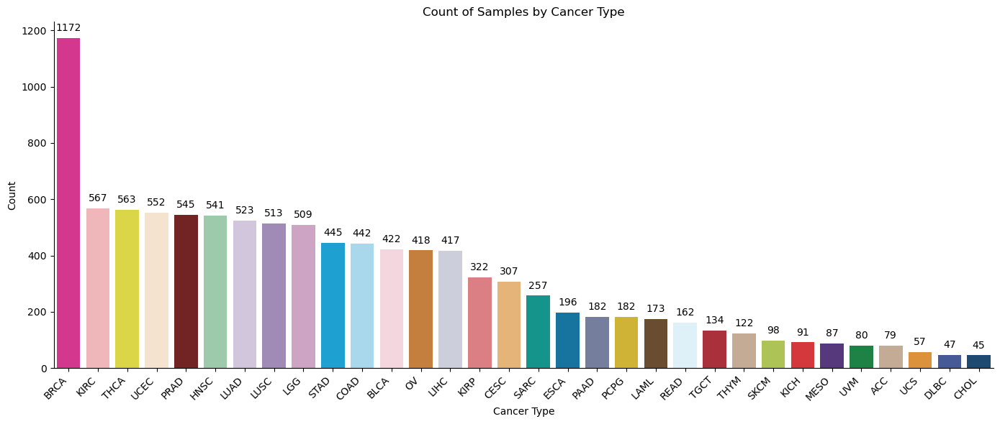

In [7]:
color_mapping = dict(zip(tcga_mrna['cancer_type'], tcga_mrna['color']))

primary_site_counts = tcga_mrna['cancer_type'].value_counts().reset_index()
primary_site_counts.columns = ['cancer_type', 'count']

# Create a bar plot
plt.figure(figsize=(14, 6))
barplot = sns.barplot(x='cancer_type', hue='cancer_type', y='count', data=primary_site_counts, palette=color_mapping)
plt.xlabel('Cancer Type')
plt.ylabel('Count')
plt.title('Count of Samples by Cancer Type')
plt.xticks(rotation=45, ha='right')  # Rotate the x labels to show them more clearly

# Annotate each bar with the count
for p in barplot.patches:
    barplot.annotate(format(p.get_height(), '.0f'),  # Format the count as a string with no decimal places
                     (p.get_x() + p.get_width() / 2., p.get_height()),  # Position the text at the center of the bar
                     ha='center', va='center',  # Center the text horizontally and vertically
                     xytext=(0, 10),  # Offset the text by 10 points vertically
                     textcoords='offset points')  # Use offset points for the text coordinates

plt.tight_layout()  # Adjust the layout to fit the x labels
sns.despine()
plt.show()

In [8]:
# shuffle the data
tcga_mrna = tcga_mrna.sample(frac=1, random_state=seed)
tcga_mirna = tcga_mirna.sample(frac=1, random_state=seed)

In [9]:
# make data split for train, validation, and test sets
train_ratio= 0.70
batch_size = 256
scaling_type = 'mean'

# Split data
train_mrna, val_mrna = train_test_split(tcga_mrna, train_size=train_ratio, stratify=tcga_mrna['cancer_type'], random_state=seed) 
val_mrna, test_mrna = train_test_split(val_mrna, test_size=0.50, stratify=val_mrna['cancer_type'], random_state=seed)

# Get the indices of the samples in each split
train_idx = train_mrna.index
val_idx = val_mrna.index
test_idx = test_mrna.index

# Use the same indices to split tcga_mirna
train_mirna = tcga_mirna.loc[train_idx]
val_mirna = tcga_mirna.loc[val_idx]
test_mirna = tcga_mirna.loc[test_idx]

# Default scaling_type = "mean"
train_dataset = GeneExpressionDatasetCombined(train_mrna, train_mirna, scaling_type=scaling_type)
validation_dataset = GeneExpressionDatasetCombined(val_mrna, val_mirna, scaling_type=scaling_type)
test_dataset = GeneExpressionDatasetCombined(test_mrna, test_mirna, scaling_type=scaling_type)

# Stratified Sampler
train_sampler = StratifiedBatchSampler(train_dataset.__getlabel__(), batch_size=batch_size)
validation_sampler = StratifiedBatchSampler(validation_dataset.__getlabel__(), batch_size=batch_size)
test_sampler = StratifiedBatchSampler(test_dataset.__getlabel__(), batch_size=batch_size)

# Data Loader
train_loader = torch.utils.data.DataLoader(train_dataset, 
                                           batch_size=batch_size,
                                           #batch_sampler=train_sampler,
                                           shuffle=True,
                                           num_workers=num_workers)
validation_loader = torch.utils.data.DataLoader(validation_dataset, 
                                                batch_size=batch_size, 
                                                #batch_sampler=validation_sampler,
                                                shuffle=False,
                                                num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(test_dataset, 
                                          batch_size=batch_size, 
                                          #batch_sampler=test_sampler,
                                          shuffle=False,
                                          num_workers=num_workers)

In [10]:
# make data split for train and validation sets
mrna_out_dim = tcga_mrna.shape[1]-4
mirna_out_dim = tcga_mirna.shape[1]-4

In [11]:
print(train_dataset.mrna_data.shape)
print(validation_dataset.mrna_data.shape)
# print(test_dataset.mrna_data.shape)

print(train_dataset.mirna_data.shape)
print(validation_dataset.mirna_data.shape)
# print(test_dataset.mirna_data.shape)

print(mrna_out_dim)
print(mirna_out_dim)

torch.Size([7174, 19741])
torch.Size([1538, 19741])
torch.Size([7174, 2024])
torch.Size([1538, 2024])
19741
2024


In [12]:
n_tissues = len(np.unique(train_dataset.label))
n_tissues = 32
n_tissues

32

# Model Setup

In [13]:
# hyperparameters
latent_dim = 20
hidden_dims = [100, 100, 100]
fc_mrna = 256
fc_mirna = 128
activation = "relu"
reduction_type = "sum" # output loss reduction
r_init_mrna = 2
r_init_mirna = 2
pi_init = 0.5

In [14]:
# Decoder setup
big_mirna = True

# set up an output module for the miRNA expression data

if big_mirna:
    mirna_out_fc = nn.Sequential(
        nn.Linear(hidden_dims[-1], 128),
        get_activation(activation),
        nn.Linear(128, fc_mirna),
        get_activation(activation),
        nn.Linear(fc_mirna, mirna_out_dim))
    output_mirna_layer = ZINB_Module(mirna_out_fc, mirna_out_dim, r_init=r_init_mirna, pi_init=pi_init, scaling_type=scaling_type)
    output_mirna_layer.n_features = mirna_out_dim
else:
    mirna_out_fc = nn.Sequential(
        nn.Linear(hidden_dims[-1], fc_mirna),
        get_activation(activation),
        nn.Linear(fc_mirna, mirna_out_dim))
    output_mirna_layer = ZINB_Module(mirna_out_fc, mirna_out_dim, r_init=r_init_mirna, pi_init=pi_init, scaling_type=scaling_type)
    output_mirna_layer.n_features = mirna_out_dim

# set up an output module for the mRNA expression data
mrna_out_fc = nn.Sequential(
    nn.Linear(hidden_dims[-1], 128),
    get_activation(activation),
    nn.Linear(128, fc_mrna),
    get_activation(activation),
    nn.Linear(fc_mrna, mrna_out_dim))
output_mrna_layer = NB_Module(mrna_out_fc, mrna_out_dim, r_init=r_init_mrna, scaling_type=scaling_type)
output_mrna_layer.n_features = mrna_out_dim

# set up the decoder
decoder = Decoder(latent_dim, 
                  hidden_dims, 
                  output_module_mirna=output_mirna_layer, 
                  output_module_mrna=output_mrna_layer, 
                  activation=activation).to(device)

# setup gmm init
gmm_mean_scale = 4.0 # usually between 2 and 10
sd_mean_init = 0.2 * gmm_mean_scale / n_tissues # empirically good for single-cell data at dimensionality 20

In [15]:
# init a DGD model
dgd = DGD(
        decoder=decoder,
        n_mix=n_tissues,
        rep_dim=latent_dim,
        gmm_spec={"mean_init": (gmm_mean_scale, 5.0), "sd_init": (sd_mean_init, 1.0), "weight_alpha": 1}
)

# Training

[1371, 1304, 34, 359]


  0%|                                                                                                                                                                                                                                       | 0/1500 [00:00<?, ?it/s]

0 train_loss: 31.271809841961506 train_loss_decoder: 18.307824993756128 train_recon_mirna: 7.339891900673242 train_recon_mrna: 10.967933093082884 train_gmm: 12.96398484820538 train_mse: 831859264.0 train_mae: 6339.86181640625 train_r2: -0.013257980346679688 train_spearman: 0.0859561339020729 train_pearson: 0.037082839757204056 train_msle: 43.92072677612305
0 test_loss: 27.012115342987194 test_loss_decoder: 18.193103654754772 test_recon_mirna: 7.2616879270217884 test_recon_mrna: 10.931415727732984 test_gmm: 8.819011688232422 test_mse: 722240640.0 test_mae: 5981.623046875 test_r2: -0.013166308403015137 test_spearman: 0.08104755729436874 test_pearson: 0.030794920399785042 test_msle: 43.85064697265625


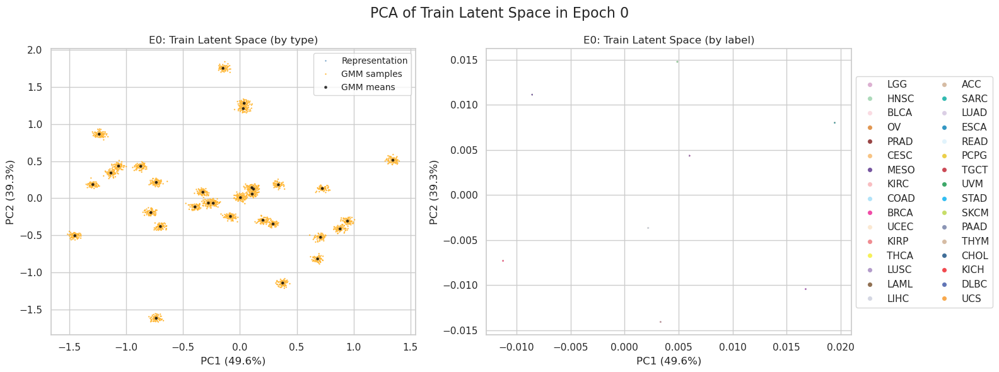

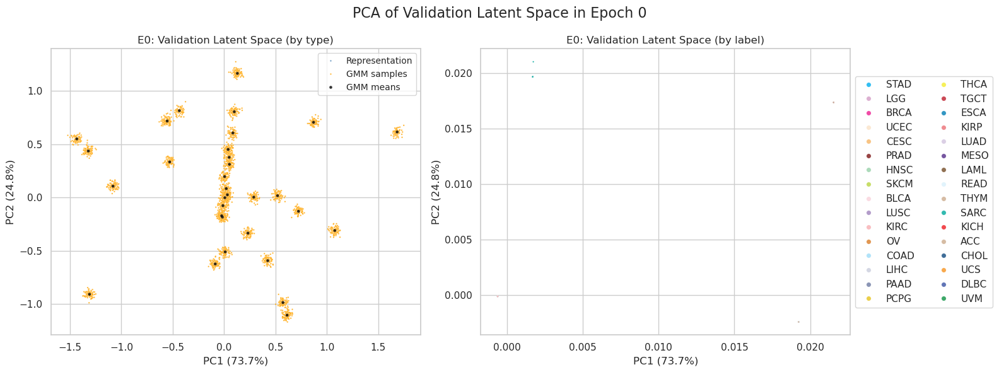

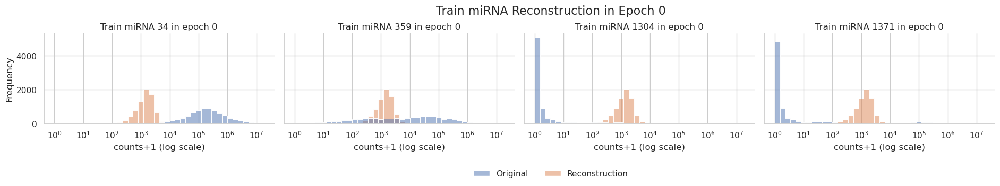

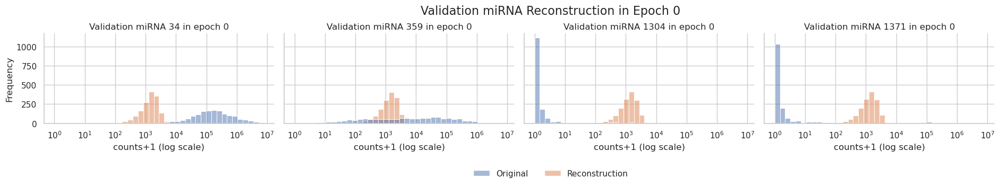

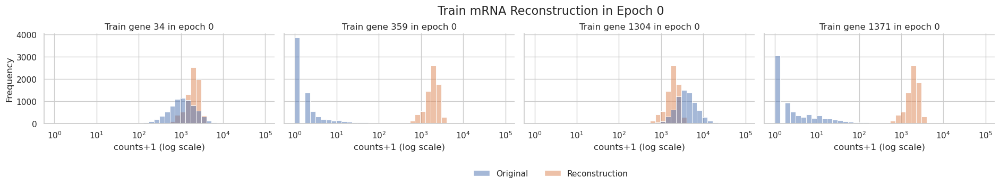

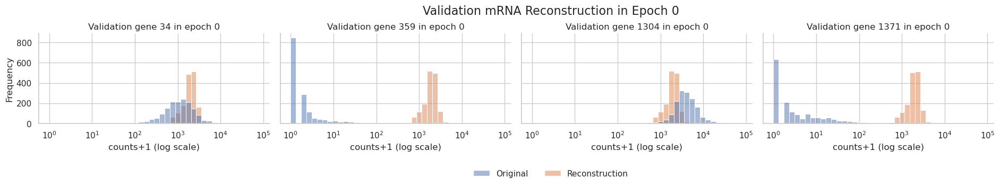

  0%|▉                                                                                                                                                                                                                            | 6/1500 [00:45<2:30:31,  6.05s/it]

5 train_loss: 16.468976799311317 train_loss_decoder: 13.772892323694343 train_recon_mirna: 5.264239693745792 train_recon_mrna: 8.50865262994855 train_gmm: 2.696084475616974 train_mse: 824130176.0 train_mae: 9689.1650390625 train_r2: -0.003843545913696289 train_spearman: 0.08527924120426178 train_pearson: 0.03765454143285751 train_msle: 60.509056091308594
5 test_loss: 15.445026201631638 test_loss_decoder: 12.871181616138529 test_recon_mirna: 4.676786855154133 test_recon_mrna: 8.194394760984396 test_gmm: 2.5738445854931102 test_mse: 716929664.0 test_mae: 9253.427734375 test_r2: -0.005716085433959961 test_spearman: 0.08008739352226257 test_pearson: 0.03156226500868797 test_msle: 60.47163009643555


  1%|█▌                                                                                                                                                                                                                          | 11/1500 [01:12<2:15:16,  5.45s/it]

10 train_loss: 12.37634046390742 train_loss_decoder: 10.35253459846889 train_recon_mirna: 2.615396060045174 train_recon_mrna: 7.737138538423716 train_gmm: 2.0238058654385287 train_mse: 949447936.0 train_mae: 17645.630859375 train_r2: -0.15648865699768066 train_spearman: 0.07119777798652649 train_pearson: 0.04559333249926567 train_msle: 75.95980834960938
10 test_loss: 12.255150366901228 test_loss_decoder: 10.305859252738976 test_recon_mirna: 2.581853186848239 test_recon_mrna: 7.724006065890737 test_gmm: 1.9492911141622515 test_mse: 836687296.0 test_mae: 16984.515625 test_r2: -0.1737133264541626 test_spearman: 0.06382360309362411 test_pearson: 0.04168477654457092 test_msle: 75.87444305419922


  1%|██▎                                                                                                                                                                                                                         | 16/1500 [01:39<2:14:42,  5.45s/it]

15 train_loss: 12.173058406569503 train_loss_decoder: 10.246110949165304 train_recon_mirna: 2.5489424653625066 train_recon_mrna: 7.697168483802798 train_gmm: 1.9269474574041991 train_mse: 981255680.0 train_mae: 18692.5 train_r2: -0.19523251056671143 train_spearman: 0.06355894356966019 train_pearson: 0.05127043277025223 train_msle: 77.22191619873047
15 test_loss: 12.168243509436053 test_loss_decoder: 10.241398033803922 test_recon_mirna: 2.55213473047905 test_recon_mrna: 7.689263303324871 test_gmm: 1.9268454756321305 test_mse: 865364288.0 test_mae: 18032.58203125 test_r2: -0.2139415740966797 test_spearman: 0.05686759203672409 test_pearson: 0.05250048264861107 test_msle: 77.19844818115234


  1%|███                                                                                                                                                                                                                         | 21/1500 [02:01<1:47:41,  4.37s/it]

20 train_loss: 12.113265289217283 train_loss_decoder: 10.18968470807973 train_recon_mirna: 2.50749930459908 train_recon_mrna: 7.68218540348065 train_gmm: 1.9235805811375537 train_mse: 982323136.0 train_mae: 18758.328125 train_r2: -0.1965327262878418 train_spearman: 0.06530103087425232 train_pearson: 0.052086081355810165 train_msle: 77.32502746582031
20 test_loss: 12.105932220779751 test_loss_decoder: 10.181626883104535 test_recon_mirna: 2.5075360970792784 test_recon_mrna: 7.674090786025256 test_gmm: 1.9243053376752162 test_mse: 869215808.0 test_mae: 18151.4140625 test_r2: -0.2193446159362793 test_spearman: 0.05858105421066284 test_pearson: 0.0517333522439003 test_msle: 77.35469055175781


  2%|███▊                                                                                                                                                                                                                        | 26/1500 [02:24<1:50:38,  4.50s/it]

25 train_loss: 12.069589911983117 train_loss_decoder: 10.146279105980954 train_recon_mirna: 2.476592218884778 train_recon_mrna: 7.669686887096176 train_gmm: 1.9233108060021635 train_mse: 971801088.0 train_mae: 18444.853515625 train_r2: -0.18371617794036865 train_spearman: 0.06606854498386383 train_pearson: 0.05204567685723305 train_msle: 76.95819854736328
25 test_loss: 12.059042917821815 test_loss_decoder: 10.135114383441799 test_recon_mirna: 2.4738627585305375 test_recon_mrna: 7.661251624911261 test_gmm: 1.923928534380016 test_mse: 858966144.0 test_mae: 17818.107421875 test_r2: -0.20496618747711182 test_spearman: 0.060037869960069656 test_pearson: 0.05109981819987297 test_msle: 76.94537353515625


  2%|████▌                                                                                                                                                                                                                       | 31/1500 [02:44<1:42:04,  4.17s/it]

30 train_loss: 12.016301966344319 train_loss_decoder: 10.093200410046526 train_recon_mirna: 2.447738719945612 train_recon_mrna: 7.645461690100913 train_gmm: 1.9231015562977936 train_mse: 966379968.0 train_mae: 18260.9921875 train_r2: -0.17711293697357178 train_spearman: 0.07106500118970871 train_pearson: 0.049627989530563354 train_msle: 76.7507553100586
30 test_loss: 11.990341611305585 test_loss_decoder: 10.066791487205396 test_recon_mirna: 2.4357027880968047 test_recon_mrna: 7.631088699108592 test_gmm: 1.9235501241001878 test_mse: 853319424.0 test_mae: 17625.20703125 test_r2: -0.19704508781433105 test_spearman: 0.06626548618078232 test_pearson: 0.04809374734759331 test_msle: 76.72091674804688


  2%|█████▎                                                                                                                                                                                                                      | 36/1500 [03:05<1:41:47,  4.17s/it]

35 train_loss: 11.903499238174684 train_loss_decoder: 9.97969088557906 train_recon_mirna: 2.409745596860577 train_recon_mrna: 7.5699452887184835 train_gmm: 1.9238083525956224 train_mse: 983672896.0 train_mae: 18835.2734375 train_r2: -0.19817686080932617 train_spearman: 0.07820603251457214 train_pearson: 0.05196424946188927 train_msle: 77.45795440673828
35 test_loss: 11.874971800575675 test_loss_decoder: 9.950616577424714 test_recon_mirna: 2.391949909336298 test_recon_mrna: 7.558666668088416 test_gmm: 1.9243552231509602 test_mse: 870345664.0 test_mae: 18207.6484375 test_r2: -0.22092962265014648 test_spearman: 0.07373666018247604 test_pearson: 0.05162042751908302 test_msle: 77.4512939453125


  3%|██████                                                                                                                                                                                                                      | 41/1500 [03:26<1:42:28,  4.21s/it]

40 train_loss: 11.798973884951426 train_loss_decoder: 9.871476228134805 train_recon_mirna: 2.3509305132669365 train_recon_mrna: 7.520545714867868 train_gmm: 1.9274976568166213 train_mse: 985517248.0 train_mae: 19184.70703125 train_r2: -0.20042335987091064 train_spearman: 0.07668787240982056 train_pearson: 0.07655561715364456 train_msle: 77.88499450683594
40 test_loss: 11.780267182455376 test_loss_decoder: 9.851934416630602 test_recon_mirna: 2.344471099327575 test_recon_mrna: 7.507463317303027 test_gmm: 1.928332765824773 test_mse: 870198848.0 test_mae: 18498.521484375 test_r2: -0.22072362899780273 test_spearman: 0.07194318622350693 test_pearson: 0.07839661836624146 test_msle: 77.8251953125


  3%|██████▋                                                                                                                                                                                                                     | 46/1500 [03:47<1:41:20,  4.18s/it]

45 train_loss: 11.718633167196622 train_loss_decoder: 9.787738031669647 train_recon_mirna: 2.336899772039609 train_recon_mrna: 7.4508382596300375 train_gmm: 1.9308951355269734 train_mse: 893253184.0 train_mae: 16751.833984375 train_r2: -0.08803975582122803 train_spearman: 0.07860767841339111 train_pearson: 0.13380196690559387 train_msle: 74.76909637451172
45 test_loss: 11.706122092575171 test_loss_decoder: 9.774582537210332 test_recon_mirna: 2.339795076410267 test_recon_mrna: 7.434787460800066 test_gmm: 1.9315395553648393 test_mse: 784400448.0 test_mae: 16139.76953125 test_r2: -0.1003648042678833 test_spearman: 0.07484734803438187 test_pearson: 0.1386009007692337 test_msle: 74.71975708007812


  3%|███████▍                                                                                                                                                                                                                    | 51/1500 [04:08<1:41:39,  4.21s/it]

50 train_loss: 11.654503387184182 train_loss_decoder: 9.721541123041586 train_recon_mirna: 2.3335927235726173 train_recon_mrna: 7.38794839946897 train_gmm: 1.932962264142596 train_mse: 765579904.0 train_mae: 9738.5185546875 train_r2: 0.06747442483901978 train_spearman: 0.08591131865978241 train_pearson: 0.303561270236969 train_msle: 59.865901947021484
50 test_loss: 11.643980883465906 test_loss_decoder: 9.709735003775485 test_recon_mirna: 2.3341443328048825 test_recon_mrna: 7.375590670970603 test_gmm: 1.9342458796904207 test_mse: 662546944.0 test_mae: 9242.6162109375 test_r2: 0.07057255506515503 test_spearman: 0.08471817523241043 test_pearson: 0.30704185366630554 test_msle: 59.61578369140625


  4%|████████▏                                                                                                                                                                                                                   | 56/1500 [04:28<1:34:56,  3.95s/it]

55 train_loss: 11.606375444205417 train_loss_decoder: 9.672754583161522 train_recon_mirna: 2.3234223374233722 train_recon_mrna: 7.349332245738149 train_gmm: 1.9336208610438954 train_mse: 751427456.0 train_mae: 7210.509765625 train_r2: 0.08471310138702393 train_spearman: 0.12903746962547302 train_pearson: 0.46641889214515686 train_msle: 46.85578155517578
55 test_loss: 11.593679646715389 test_loss_decoder: 9.65872238873645 test_recon_mirna: 2.3203184385964413 test_recon_mrna: 7.338403950140009 test_gmm: 1.9349572579789378 test_mse: 648440384.0 test_mae: 6808.8837890625 test_r2: 0.09036135673522949 test_spearman: 0.12029701471328735 test_pearson: 0.46411165595054626 test_msle: 46.63703536987305


  4%|████████▉                                                                                                                                                                                                                   | 61/1500 [04:47<1:31:32,  3.82s/it]

60 train_loss: 11.549407410444323 train_loss_decoder: 9.615164891785636 train_recon_mirna: 2.3032570467056495 train_recon_mrna: 7.311907845079986 train_gmm: 1.9342425186586871 train_mse: 736154048.0 train_mae: 7679.1240234375 train_r2: 0.10331708192825317 train_spearman: 0.12699547410011292 train_pearson: 0.4553583562374115 train_msle: 48.12466812133789
60 test_loss: 11.53127822400445 test_loss_decoder: 9.595437651047039 test_recon_mirna: 2.2956937664245327 test_recon_mrna: 7.299743884622506 test_gmm: 1.9358405729574097 test_mse: 634908736.0 test_mae: 7272.49951171875 test_r2: 0.10934364795684814 test_spearman: 0.11600254476070404 test_pearson: 0.45089560747146606 test_msle: 47.998573303222656


  4%|█████████▋                                                                                                                                                                                                                  | 66/1500 [05:06<1:32:41,  3.88s/it]

65 train_loss: 11.482595237596112 train_loss_decoder: 9.546949466117521 train_recon_mirna: 2.281271010635477 train_recon_mrna: 7.265678455482044 train_gmm: 1.9356457714785897 train_mse: 742086208.0 train_mae: 9903.8994140625 train_r2: 0.09609133005142212 train_spearman: 0.08711981028318405 train_pearson: 0.33981743454933167 train_msle: 55.96213912963867
65 test_loss: 11.46179221573895 test_loss_decoder: 9.524765075740413 test_recon_mirna: 2.2702944186208325 test_recon_mrna: 7.254470657119581 test_gmm: 1.9370271399985364 test_mse: 645743616.0 test_mae: 9465.763671875 test_r2: 0.09414440393447876 test_spearman: 0.075563445687294 test_pearson: 0.3273108899593353 test_msle: 55.762210845947266


  5%|██████████▍                                                                                                                                                                                                                 | 71/1500 [05:26<1:34:43,  3.98s/it]

70 train_loss: 11.426972032963011 train_loss_decoder: 9.487556522664693 train_recon_mirna: 2.2679116175894665 train_recon_mrna: 7.219644905075227 train_gmm: 1.939415510298317 train_mse: 741741760.0 train_mae: 9786.62890625 train_r2: 0.09651082754135132 train_spearman: 0.08788733184337616 train_pearson: 0.33504346013069153 train_msle: 54.88721466064453
70 test_loss: 11.412467458790449 test_loss_decoder: 9.470964542923165 test_recon_mirna: 2.260435393584548 test_recon_mrna: 7.210529149338616 test_gmm: 1.9415029158672834 test_mse: 648930752.0 test_mae: 9417.59765625 test_r2: 0.08967345952987671 test_spearman: 0.07564486563205719 test_pearson: 0.31276431679725647 test_msle: 54.84575653076172


  5%|███████████                                                                                                                                                                                                                 | 75/1500 [05:41<1:30:44,  3.82s/it]

75 train_loss: 11.384511345782267 train_loss_decoder: 9.438700132978319 train_recon_mirna: 2.2561863600764465 train_recon_mrna: 7.182513772901872 train_gmm: 1.9458112128039473 train_mse: 730320960.0 train_mae: 8217.7255859375 train_r2: 0.11042213439941406 train_spearman: 0.1153780072927475 train_pearson: 0.3950214087963104 train_msle: 47.808013916015625
75 test_loss: 11.377556508344224 test_loss_decoder: 9.428638632297815 test_recon_mirna: 2.2535914786641094 test_recon_mrna: 7.175047153633705 test_gmm: 1.9489178760464076 test_mse: 634986048.0 test_mae: 7834.91845703125 test_r2: 0.10923522710800171 test_spearman: 0.10547240823507309 test_pearson: 0.37223225831985474 test_msle: 47.541526794433594


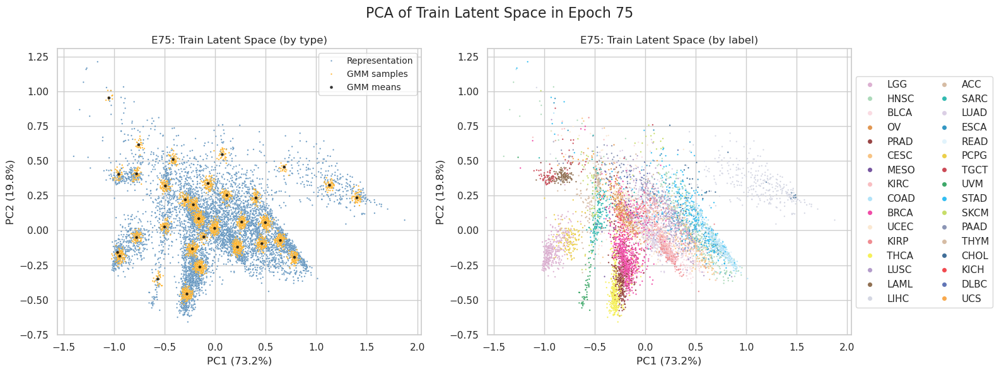

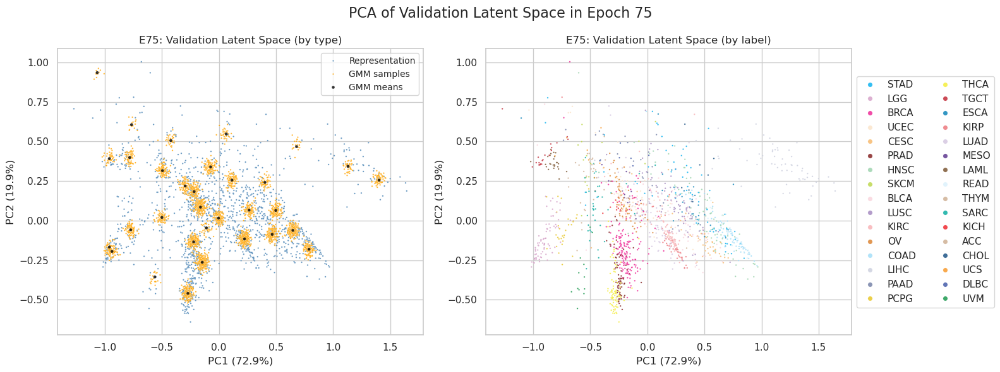

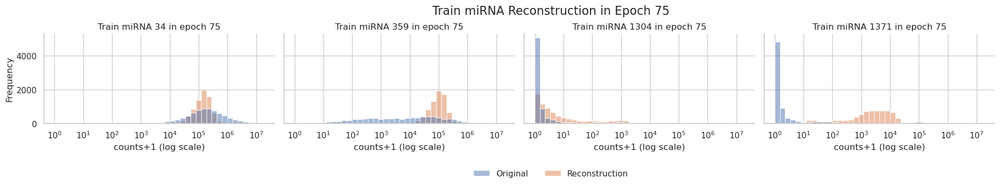

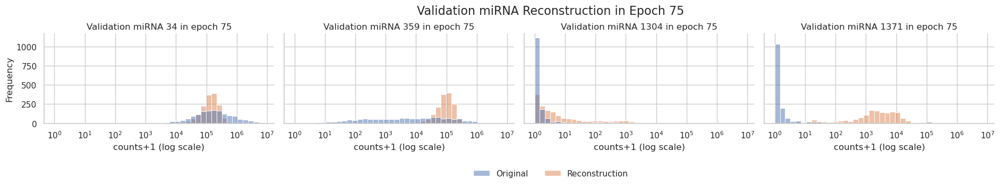

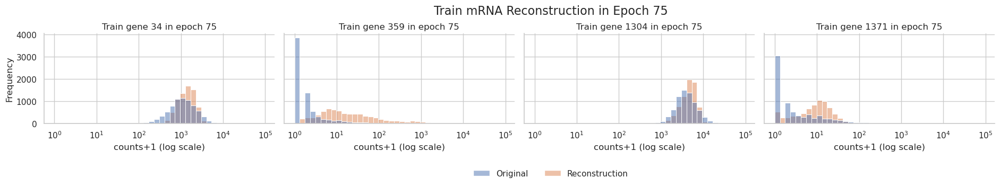

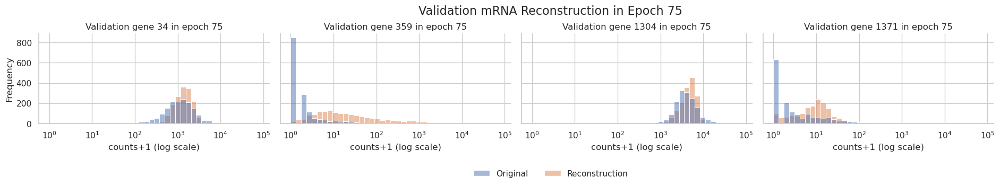

  5%|███████████▉                                                                                                                                                                                                                | 81/1500 [06:21<1:50:19,  4.67s/it]

80 train_loss: 11.34734679764057 train_loss_decoder: 9.3967917775866 train_recon_mirna: 2.2466442133152347 train_recon_mrna: 7.150147564271365 train_gmm: 1.950555020053971 train_mse: 720153600.0 train_mae: 6742.6796875 train_r2: 0.1228066086769104 train_spearman: 0.1446593850851059 train_pearson: 0.5189812183380127 train_msle: 38.370235443115234
80 test_loss: 11.345107192295883 test_loss_decoder: 9.390552176880735 test_recon_mirna: 2.2467862941842114 test_recon_mrna: 7.143765882696525 test_gmm: 1.954555015415147 test_mse: 622528192.0 test_mae: 6389.17431640625 test_r2: 0.12671130895614624 test_spearman: 0.13628113269805908 test_pearson: 0.4985821843147278 test_msle: 38.164730072021484


  6%|████████████▌                                                                                                                                                                                                               | 86/1500 [06:39<1:30:02,  3.82s/it]

85 train_loss: 11.308953566664913 train_loss_decoder: 9.355809132765732 train_recon_mirna: 2.2371620196356434 train_recon_mrna: 7.118647113130089 train_gmm: 1.953144433899181 train_mse: 726648832.0 train_mae: 5300.04833984375 train_r2: 0.1148950457572937 train_spearman: 0.17457619309425354 train_pearson: 0.7526178359985352 train_msle: 23.669939041137695
85 test_loss: 11.310856623233313 test_loss_decoder: 9.353771909432638 test_recon_mirna: 2.239899556430703 test_recon_mrna: 7.113872353001934 test_gmm: 1.957084713800676 test_mse: 626324928.0 test_mae: 4966.1220703125 test_r2: 0.12138509750366211 test_spearman: 0.16219638288021088 test_pearson: 0.7432439923286438 test_msle: 23.591108322143555


  6%|█████████████▎                                                                                                                                                                                                              | 91/1500 [06:58<1:31:13,  3.88s/it]

90 train_loss: 11.27188000429901 train_loss_decoder: 9.317220235350852 train_recon_mirna: 2.2288562676620622 train_recon_mrna: 7.088363967688791 train_gmm: 1.9546597689481575 train_mse: 710151104.0 train_mae: 4985.38818359375 train_r2: 0.13499027490615845 train_spearman: 0.18672208487987518 train_pearson: 0.823765218257904 train_msle: 18.971946716308594
90 test_loss: 11.274713100130967 test_loss_decoder: 9.315898718756008 test_recon_mirna: 2.2306170062915567 test_recon_mrna: 7.085281712464451 test_gmm: 1.9588143813749594 test_mse: 611770432.0 test_mae: 4670.1484375 test_r2: 0.14180231094360352 test_spearman: 0.17567257583141327 test_pearson: 0.8092320561408997 test_msle: 18.94407081604004


  6%|██████████████                                                                                                                                                                                                              | 96/1500 [07:17<1:25:58,  3.67s/it]

95 train_loss: 11.236587030738853 train_loss_decoder: 9.280766671573417 train_recon_mirna: 2.2200300967749116 train_recon_mrna: 7.060736574798505 train_gmm: 1.9558203591654353 train_mse: 688512000.0 train_mae: 4964.09765625 train_r2: 0.1613481044769287 train_spearman: 0.19117426872253418 train_pearson: 0.8137547969818115 train_msle: 18.69725799560547
95 test_loss: 11.241365085353303 test_loss_decoder: 9.2811291002435 test_recon_mirna: 2.222412731312002 test_recon_mrna: 7.058716368931499 test_gmm: 1.960235985109803 test_mse: 592747200.0 test_mae: 4665.830078125 test_r2: 0.16848832368850708 test_spearman: 0.17927241325378418 test_pearson: 0.791100025177002 test_msle: 18.67595100402832


  7%|██████████████▋                                                                                                                                                                                                            | 101/1500 [07:37<1:28:28,  3.79s/it]

100 train_loss: 11.202972209900704 train_loss_decoder: 9.246084247778471 train_recon_mirna: 2.209658441112818 train_recon_mrna: 7.036425806665654 train_gmm: 1.956887962122232 train_mse: 665234176.0 train_mae: 5081.77880859375 train_r2: 0.18970203399658203 train_spearman: 0.19417886435985565 train_pearson: 0.7748951315879822 train_msle: 20.132492065429688
100 test_loss: 11.205856077073646 test_loss_decoder: 9.245706114627332 test_recon_mirna: 2.210138550472897 test_recon_mrna: 7.035567564154435 test_gmm: 1.9601499624463146 test_mse: 571743360.0 test_mae: 4777.79052734375 test_r2: 0.1979527473449707 test_spearman: 0.18130290508270264 test_pearson: 0.7571431994438171 test_msle: 20.034683227539062


  7%|███████████████▍                                                                                                                                                                                                           | 106/1500 [07:57<1:35:11,  4.10s/it]

105 train_loss: 11.171208800953583 train_loss_decoder: 9.212775141472106 train_recon_mirna: 2.1968828878929396 train_recon_mrna: 7.015892253579167 train_gmm: 1.958433659481477 train_mse: 660198976.0 train_mae: 5033.185546875 train_r2: 0.1958351731300354 train_spearman: 0.198755145072937 train_pearson: 0.7717027068138123 train_msle: 18.62567138671875
105 test_loss: 11.17358100701186 test_loss_decoder: 9.211829352395602 test_recon_mirna: 2.196691816510704 test_recon_mrna: 7.015137535884898 test_gmm: 1.961751654616258 test_mse: 567671104.0 test_mae: 4728.15869140625 test_r2: 0.20366525650024414 test_spearman: 0.18352793157100677 test_pearson: 0.754649817943573 test_msle: 18.392047882080078


  7%|████████████████▏                                                                                                                                                                                                          | 111/1500 [08:17<1:31:58,  3.97s/it]

110 train_loss: 11.141880158891151 train_loss_decoder: 9.18127951867371 train_recon_mirna: 2.183367993277509 train_recon_mrna: 6.9979115253962005 train_gmm: 1.960600640217441 train_mse: 648105536.0 train_mae: 5110.5078125 train_r2: 0.21056580543518066 train_spearman: 0.19981342554092407 train_pearson: 0.7491637468338013 train_msle: 19.23529815673828
110 test_loss: 11.146740275497406 test_loss_decoder: 9.182963548904905 test_recon_mirna: 2.1850110470191377 test_recon_mrna: 6.9979525018857665 test_gmm: 1.9637767265925017 test_mse: 557395584.0 test_mae: 4821.578125 test_r2: 0.21807986497879028 test_spearman: 0.18305696547031403 test_pearson: 0.7288244366645813 test_msle: 19.102828979492188


  8%|████████████████▉                                                                                                                                                                                                          | 116/1500 [08:38<1:32:36,  4.01s/it]

115 train_loss: 11.114894722792505 train_loss_decoder: 9.151268054986016 train_recon_mirna: 2.169818459226364 train_recon_mrna: 6.981449595759651 train_gmm: 1.9636266678064886 train_mse: 641659072.0 train_mae: 5138.41943359375 train_r2: 0.21841806173324585 train_spearman: 0.20120900869369507 train_pearson: 0.7388864159584045 train_msle: 19.212890625
115 test_loss: 11.119824068005903 test_loss_decoder: 9.155020828453868 test_recon_mirna: 2.1728401492893754 test_recon_mrna: 6.982180679164491 test_gmm: 1.9648032395520354 test_mse: 551677056.0 test_mae: 4858.490234375 test_r2: 0.22610193490982056 test_spearman: 0.18267792463302612 test_pearson: 0.71604984998703 test_msle: 19.18155860900879


  8%|█████████████████▋                                                                                                                                                                                                         | 121/1500 [08:58<1:35:37,  4.16s/it]

120 train_loss: 11.093953565186732 train_loss_decoder: 9.125994022251572 train_recon_mirna: 2.160551347602037 train_recon_mrna: 6.965442674649536 train_gmm: 1.967959542935161 train_mse: 632717376.0 train_mae: 5171.9306640625 train_r2: 0.22930961847305298 train_spearman: 0.20388083159923553 train_pearson: 0.7294583916664124 train_msle: 19.35253143310547
120 test_loss: 11.101568535097542 test_loss_decoder: 9.132554123994732 test_recon_mirna: 2.166534063841891 test_recon_mrna: 6.966020060152841 test_gmm: 1.9690144111028107 test_mse: 543758848.0 test_mae: 4893.3994140625 test_r2: 0.23720967769622803 test_spearman: 0.187569722533226 test_pearson: 0.7096211910247803 test_msle: 19.36118507385254


  8%|██████████████████▍                                                                                                                                                                                                        | 126/1500 [09:20<1:43:10,  4.51s/it]

125 train_loss: 11.076673958531721 train_loss_decoder: 9.103680562248062 train_recon_mirna: 2.153733503729569 train_recon_mrna: 6.949947058518492 train_gmm: 1.9729933962836583 train_mse: 623370560.0 train_mae: 5207.458984375 train_r2: 0.2406945824623108 train_spearman: 0.20973332226276398 train_pearson: 0.7195804119110107 train_msle: 19.163076400756836
125 test_loss: 11.088370352821546 test_loss_decoder: 9.115146810212497 test_recon_mirna: 2.1646819611749386 test_recon_mrna: 6.95046484903756 test_gmm: 1.9732235426090474 test_mse: 536475744.0 test_mae: 4937.134765625 test_r2: 0.24742650985717773 test_spearman: 0.19288882613182068 test_pearson: 0.6977238059043884 test_msle: 19.072608947753906


  9%|███████████████████▏                                                                                                                                                                                                       | 131/1500 [09:40<1:34:36,  4.15s/it]

130 train_loss: 11.06125935189037 train_loss_decoder: 9.083820158100977 train_recon_mirna: 2.1489739600360647 train_recon_mrna: 6.934846198064912 train_gmm: 1.9774391937893947 train_mse: 614539904.0 train_mae: 5259.09326171875 train_r2: 0.25145089626312256 train_spearman: 0.2166074961423874 train_pearson: 0.71116703748703 train_msle: 19.30768585205078
130 test_loss: 11.081056421883119 test_loss_decoder: 9.09973520857882 test_recon_mirna: 2.1643472638559067 test_recon_mrna: 6.935387944722914 test_gmm: 1.981321213304299 test_mse: 528576000.0 test_mae: 4997.22412109375 test_r2: 0.2585083246231079 test_spearman: 0.19806182384490967 test_pearson: 0.6896177530288696 test_msle: 19.273202896118164


  9%|███████████████████▊                                                                                                                                                                                                       | 136/1500 [10:01<1:37:00,  4.27s/it]

135 train_loss: 11.046801035546036 train_loss_decoder: 9.065438777736667 train_recon_mirna: 2.145377617312886 train_recon_mrna: 6.9200611604237805 train_gmm: 1.981362257809369 train_mse: 603805120.0 train_mae: 5395.3037109375 train_r2: 0.2645265460014343 train_spearman: 0.22167304158210754 train_pearson: 0.6945690512657166 train_msle: 20.73850440979004
135 test_loss: 11.07050565576692 test_loss_decoder: 9.084282667097554 test_recon_mirna: 2.1636291264542855 test_recon_mrna: 6.920653540643268 test_gmm: 1.986222988669367 test_mse: 519687808.0 test_mae: 5145.1015625 test_r2: 0.270976722240448 test_spearman: 0.20112866163253784 test_pearson: 0.6733711957931519 test_msle: 20.74372673034668


  9%|████████████████████▌                                                                                                                                                                                                      | 141/1500 [10:21<1:34:39,  4.18s/it]

140 train_loss: 11.030844161289991 train_loss_decoder: 9.04661065231454 train_recon_mirna: 2.1414199170821 train_recon_mrna: 6.9051907352324395 train_gmm: 1.984233508975452 train_mse: 597409920.0 train_mae: 5363.26025390625 train_r2: 0.2723163366317749 train_spearman: 0.22769054770469666 train_pearson: 0.697446346282959 train_msle: 19.81113052368164
140 test_loss: 11.056814891941197 test_loss_decoder: 9.066109685326875 test_recon_mirna: 2.1601056925607356 test_recon_mrna: 6.90600399276614 test_gmm: 1.990705206614322 test_mse: 513909632.0 test_mae: 5123.39697265625 test_r2: 0.2790824770927429 test_spearman: 0.2043721079826355 test_pearson: 0.6766669750213623 test_msle: 19.821664810180664


 10%|█████████████████████▎                                                                                                                                                                                                     | 146/1500 [10:42<1:37:14,  4.31s/it]

145 train_loss: 11.014281551378318 train_loss_decoder: 9.02846135879615 train_recon_mirna: 2.1377360280716036 train_recon_mrna: 6.890725330724547 train_gmm: 1.985820192582168 train_mse: 594149376.0 train_mae: 5367.3994140625 train_r2: 0.27628785371780396 train_spearman: 0.2320203334093094 train_pearson: 0.6970900893211365 train_msle: 19.847213745117188
145 test_loss: 11.039197568072096 test_loss_decoder: 9.046563947411862 test_recon_mirna: 2.1545634739034645 test_recon_mrna: 6.892000473508396 test_gmm: 1.9926336206602338 test_mse: 512394624.0 test_mae: 5140.01171875 test_r2: 0.28120774030685425 test_spearman: 0.2083720713853836 test_pearson: 0.6727991104125977 test_msle: 19.895069122314453


 10%|█████████████████████▉                                                                                                                                                                                                     | 150/1500 [10:59<1:36:08,  4.27s/it]

150 train_loss: 10.998111183056913 train_loss_decoder: 9.009792699824958 train_recon_mirna: 2.1332539816063525 train_recon_mrna: 6.8765387182186055 train_gmm: 1.9883184832319563 train_mse: 590852224.0 train_mae: 5310.39599609375 train_r2: 0.28030407428741455 train_spearman: 0.23481646180152893 train_pearson: 0.7025965452194214 train_msle: 18.706525802612305
150 test_loss: 11.025093570547837 test_loss_decoder: 9.030347653543823 test_recon_mirna: 2.1512920923323766 test_recon_mrna: 6.879055561211446 test_gmm: 1.9947459170040136 test_mse: 508536192.0 test_mae: 5058.26611328125 test_r2: 0.2866203784942627 test_spearman: 0.21046195924282074 test_pearson: 0.6836553812026978 test_msle: 18.621524810791016


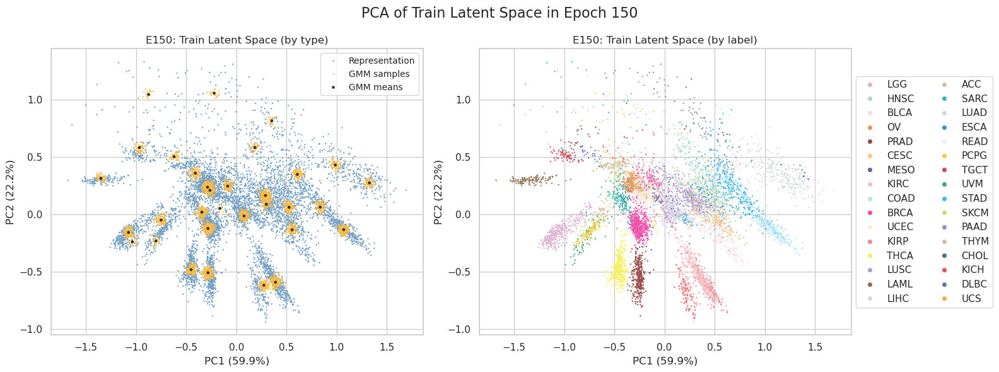

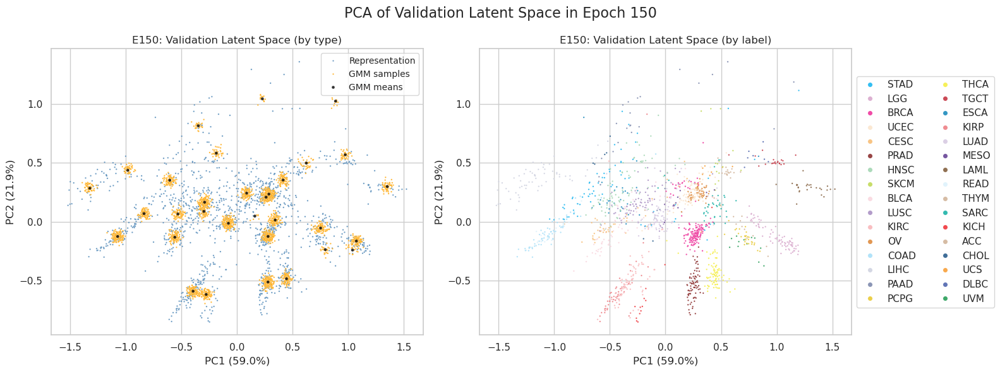

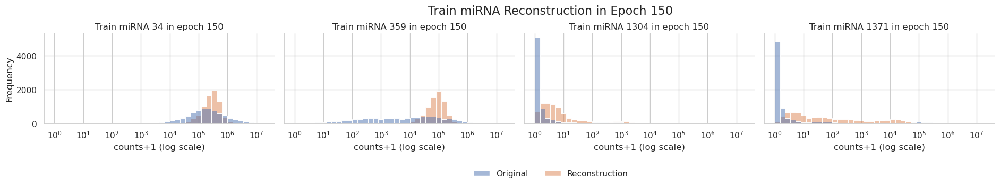

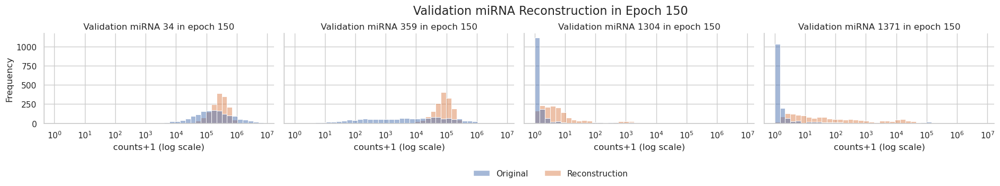

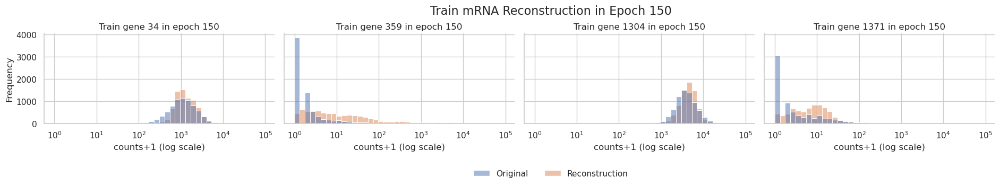

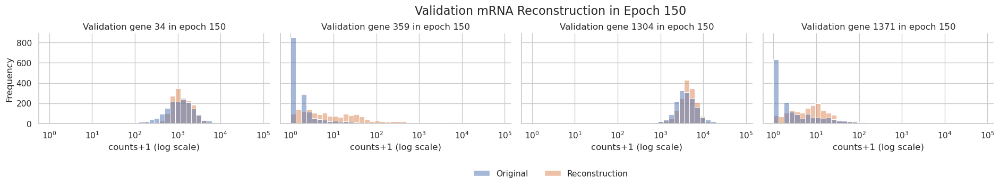

 10%|██████████████████████▊                                                                                                                                                                                                    | 156/1500 [11:41<1:54:02,  5.09s/it]

155 train_loss: 10.982991326385568 train_loss_decoder: 8.991913210752687 train_recon_mirna: 2.1287893641492364 train_recon_mrna: 6.86312384660345 train_gmm: 1.9910781156328816 train_mse: 582317312.0 train_mae: 5435.65771484375 train_r2: 0.2907000780105591 train_spearman: 0.23554039001464844 train_pearson: 0.6915541291236877 train_msle: 20.648815155029297
155 test_loss: 11.012047322594132 test_loss_decoder: 9.014036536664108 test_recon_mirna: 2.148631179025208 test_recon_mrna: 6.865405357638901 test_gmm: 1.9980107859300233 test_mse: 500792704.0 test_mae: 5197.8408203125 test_r2: 0.29748302698135376 test_spearman: 0.21215322613716125 test_pearson: 0.6724781394004822 test_msle: 20.59126853942871


 11%|███████████████████████▌                                                                                                                                                                                                   | 161/1500 [12:04<1:47:49,  4.83s/it]

160 train_loss: 10.967862379364377 train_loss_decoder: 8.974126546386444 train_recon_mirna: 2.123789059556897 train_recon_mrna: 6.850337486829547 train_gmm: 1.993735832977933 train_mse: 579654016.0 train_mae: 5349.88818359375 train_r2: 0.29394418001174927 train_spearman: 0.23604746162891388 train_pearson: 0.6994220614433289 train_msle: 19.343608856201172
160 test_loss: 10.998326286911439 test_loss_decoder: 8.998101196457974 test_recon_mirna: 2.1456679328084722 test_recon_mrna: 6.852433263649502 test_gmm: 2.0002250904534664 test_mse: 498578592.0 test_mae: 5133.43505859375 test_r2: 0.3005889654159546 test_spearman: 0.21281111240386963 test_pearson: 0.6771770715713501 test_msle: 19.34457015991211


 11%|████████████████████████▏                                                                                                                                                                                                  | 166/1500 [12:24<1:34:45,  4.26s/it]

165 train_loss: 10.952892094873809 train_loss_decoder: 8.957670741040365 train_recon_mirna: 2.118969484496305 train_recon_mrna: 6.83870125654406 train_gmm: 1.9952213538334433 train_mse: 577715200.0 train_mae: 5332.05224609375 train_r2: 0.29630571603775024 train_spearman: 0.23750297725200653 train_pearson: 0.7005634307861328 train_msle: 19.049816131591797
165 test_loss: 10.985784442420783 test_loss_decoder: 8.98472617148644 test_recon_mirna: 2.144030644829102 test_recon_mrna: 6.840695526657338 test_gmm: 2.0010582709343443 test_mse: 495996672.0 test_mae: 5114.08984375 test_r2: 0.304210901260376 test_spearman: 0.21197332441806793 test_pearson: 0.6802458167076111 test_msle: 19.142852783203125


 11%|████████████████████████▉                                                                                                                                                                                                  | 171/1500 [12:46<1:38:05,  4.43s/it]

170 train_loss: 10.937014434078934 train_loss_decoder: 8.94104629492395 train_recon_mirna: 2.113696396214051 train_recon_mrna: 6.827349898709899 train_gmm: 1.9959681391549835 train_mse: 570531008.0 train_mae: 5431.08154296875 train_r2: 0.3050565719604492 train_spearman: 0.23844139277935028 train_pearson: 0.6923578381538391 train_msle: 20.577558517456055
170 test_loss: 10.977004319799324 test_loss_decoder: 8.974198037011778 test_recon_mirna: 2.14360763825951 test_recon_mrna: 6.8305903987522685 test_gmm: 2.0028062827875464 test_mse: 490939136.0 test_mae: 5210.3466796875 test_r2: 0.3113057017326355 test_spearman: 0.21482835710048676 test_pearson: 0.6723899245262146 test_msle: 20.62974739074707


 12%|█████████████████████████▋                                                                                                                                                                                                 | 176/1500 [13:09<1:38:11,  4.45s/it]

175 train_loss: 10.922464764000951 train_loss_decoder: 8.926293455260696 train_recon_mirna: 2.1090991541646518 train_recon_mrna: 6.817194301096044 train_gmm: 1.9961713087402548 train_mse: 568483008.0 train_mae: 5347.33154296875 train_r2: 0.30755120515823364 train_spearman: 0.2381715178489685 train_pearson: 0.6995446681976318 train_msle: 19.17488670349121
175 test_loss: 10.964279772999449 test_loss_decoder: 8.96110479996921 test_recon_mirna: 2.1407383446853783 test_recon_mrna: 6.820366455283832 test_gmm: 2.003174973030239 test_mse: 489279328.0 test_mae: 5134.1884765625 test_r2: 0.31363409757614136 test_spearman: 0.2131699025630951 test_pearson: 0.6786217093467712 test_msle: 19.203094482421875


 12%|██████████████████████████▍                                                                                                                                                                                                | 181/1500 [13:29<1:29:17,  4.06s/it]

180 train_loss: 10.907606896866678 train_loss_decoder: 8.911747823915833 train_recon_mirna: 2.104787806603119 train_recon_mrna: 6.806960017312714 train_gmm: 1.9958590729508454 train_mse: 562296896.0 train_mae: 5454.52783203125 train_r2: 0.3150862455368042 train_spearman: 0.237330362200737 train_pearson: 0.6911086440086365 train_msle: 20.878032684326172
180 test_loss: 10.951843254114571 test_loss_decoder: 8.948559718222963 test_recon_mirna: 2.1382973584977467 test_recon_mrna: 6.8102623597252165 test_gmm: 2.0032835358916086 test_mse: 483623904.0 test_mae: 5237.52294921875 test_r2: 0.3215675950050354 test_spearman: 0.21387681365013123 test_pearson: 0.6725499629974365 test_msle: 20.870529174804688


 12%|███████████████████████████▏                                                                                                                                                                                               | 186/1500 [13:50<1:31:12,  4.16s/it]

185 train_loss: 10.893624636649667 train_loss_decoder: 8.898093400185621 train_recon_mirna: 2.1006053227032164 train_recon_mrna: 6.797488077482405 train_gmm: 1.995531236464046 train_mse: 559680512.0 train_mae: 5384.84521484375 train_r2: 0.3182731866836548 train_spearman: 0.23609130084514618 train_pearson: 0.6968322396278381 train_msle: 19.60388946533203
185 test_loss: 10.941248633997798 test_loss_decoder: 8.937763356923586 test_recon_mirna: 2.1366465091546014 test_recon_mrna: 6.801116847768985 test_gmm: 2.003485277074211 test_mse: 481289824.0 test_mae: 5175.6708984375 test_r2: 0.32484185695648193 test_spearman: 0.21161364018917084 test_pearson: 0.6774893999099731 test_msle: 19.59671974182129


 13%|███████████████████████████▉                                                                                                                                                                                               | 191/1500 [14:09<1:23:36,  3.83s/it]

190 train_loss: 10.879790243554337 train_loss_decoder: 8.884699863156087 train_recon_mirna: 2.096129669820075 train_recon_mrna: 6.788570193336012 train_gmm: 1.9950903803982507 train_mse: 554374144.0 train_mae: 5458.37939453125 train_r2: 0.32473665475845337 train_spearman: 0.23582105338573456 train_pearson: 0.6904439330101013 train_msle: 20.478134155273438
190 test_loss: 10.931158421874361 test_loss_decoder: 8.927283535233869 test_recon_mirna: 2.1342082361181225 test_recon_mrna: 6.793075299115746 test_gmm: 2.003874886640492 test_mse: 476213728.0 test_mae: 5245.42138671875 test_r2: 0.3319626450538635 test_spearman: 0.21140216290950775 test_pearson: 0.6739068627357483 test_msle: 20.487586975097656


 13%|████████████████████████████▌                                                                                                                                                                                              | 196/1500 [14:30<1:35:04,  4.37s/it]

195 train_loss: 10.867055898461656 train_loss_decoder: 8.87169570570627 train_recon_mirna: 2.0916525619302497 train_recon_mrna: 6.78004314377602 train_gmm: 1.9953601927553872 train_mse: 550637824.0 train_mae: 5490.02587890625 train_r2: 0.3292877674102783 train_spearman: 0.23394355177879333 train_pearson: 0.6886237263679504 train_msle: 20.860864639282227
195 test_loss: 10.915124404227798 test_loss_decoder: 8.912692686515157 test_recon_mirna: 2.1277098946498385 test_recon_mrna: 6.784982791865319 test_gmm: 2.0024317177126405 test_mse: 474964736.0 test_mae: 5285.85888671875 test_r2: 0.33371472358703613 test_spearman: 0.21108341217041016 test_pearson: 0.6687921285629272 test_msle: 20.84000015258789


 13%|█████████████████████████████▎                                                                                                                                                                                             | 201/1500 [14:50<1:28:03,  4.07s/it]

200 train_loss: 10.85544006099727 train_loss_decoder: 8.85960565670567 train_recon_mirna: 2.0879189374366054 train_recon_mrna: 6.771686719269065 train_gmm: 1.9958344042916 train_mse: 551890432.0 train_mae: 5381.25390625 train_r2: 0.32776200771331787 train_spearman: 0.23283907771110535 train_pearson: 0.696884274482727 train_msle: 19.225797653198242
200 test_loss: 10.902556665999091 test_loss_decoder: 8.899009037722877 test_recon_mirna: 2.1220755386530965 test_recon_mrna: 6.776933499069781 test_gmm: 2.003547628276215 test_mse: 475044608.0 test_mae: 5187.1142578125 test_r2: 0.3336027264595032 test_spearman: 0.2091801017522812 test_pearson: 0.67753005027771 test_msle: 19.277944564819336


 14%|██████████████████████████████                                                                                                                                                                                             | 206/1500 [15:10<1:26:00,  3.99s/it]

205 train_loss: 10.842964437674134 train_loss_decoder: 8.846674488020396 train_recon_mirna: 2.0826979524365785 train_recon_mrna: 6.763976535583817 train_gmm: 1.9962899496537383 train_mse: 546873472.0 train_mae: 5503.9267578125 train_r2: 0.33387291431427 train_spearman: 0.23271699249744415 train_pearson: 0.6886764764785767 train_msle: 21.31744384765625
205 test_loss: 10.884387560980992 test_loss_decoder: 8.88319606286078 test_recon_mirna: 2.1130359216557117 test_recon_mrna: 6.770160141205069 test_gmm: 2.0011914981202126 test_mse: 471250112.0 test_mae: 5298.19189453125 test_r2: 0.33892565965652466 test_spearman: 0.20882345736026764 test_pearson: 0.6703066825866699 test_msle: 21.29304313659668


 14%|██████████████████████████████▊                                                                                                                                                                                            | 211/1500 [15:32<1:33:05,  4.33s/it]

210 train_loss: 10.832088218425689 train_loss_decoder: 8.834342799584649 train_recon_mirna: 2.078128843789497 train_recon_mrna: 6.756213955795152 train_gmm: 1.9977454188410406 train_mse: 546167104.0 train_mae: 5434.4052734375 train_r2: 0.3347333073616028 train_spearman: 0.23146724700927734 train_pearson: 0.6945822834968567 train_msle: 20.155855178833008
210 test_loss: 10.869348148494861 test_loss_decoder: 8.867613066927605 test_recon_mirna: 2.105282563394169 test_recon_mrna: 6.762330503533437 test_gmm: 2.0017350815672557 test_mse: 470226240.0 test_mae: 5242.294921875 test_r2: 0.34036195278167725 test_spearman: 0.20659632980823517 test_pearson: 0.6757422685623169 test_msle: 20.202852249145508


 14%|███████████████████████████████▌                                                                                                                                                                                           | 216/1500 [15:53<1:32:56,  4.34s/it]

215 train_loss: 10.821147851159681 train_loss_decoder: 8.82231792292559 train_recon_mirna: 2.0735301248081033 train_recon_mrna: 6.748787798117487 train_gmm: 1.9988299282340907 train_mse: 542481344.0 train_mae: 5473.130859375 train_r2: 0.33922284841537476 train_spearman: 0.2308340221643448 train_pearson: 0.6927560567855835 train_msle: 20.813602447509766
215 test_loss: 10.856843920040264 test_loss_decoder: 8.85491849748094 test_recon_mirna: 2.099287038306345 test_recon_mrna: 6.7556314591745945 test_gmm: 2.001925422559324 test_mse: 466785984.0 test_mae: 5265.83349609375 test_r2: 0.3451879620552063 test_spearman: 0.20621612668037415 test_pearson: 0.6760305762290955 test_msle: 20.804882049560547


 15%|████████████████████████████████▎                                                                                                                                                                                          | 221/1500 [16:16<1:37:32,  4.58s/it]

220 train_loss: 10.810700443637625 train_loss_decoder: 8.810473182011133 train_recon_mirna: 2.0690708306281893 train_recon_mrna: 6.741402351382943 train_gmm: 2.0002272616264913 train_mse: 538287168.0 train_mae: 5524.6943359375 train_r2: 0.34433162212371826 train_spearman: 0.2298911213874817 train_pearson: 0.690238356590271 train_msle: 21.319538116455078
220 test_loss: 10.844344833276919 test_loss_decoder: 8.84168874613324 test_recon_mirna: 2.0928185880871952 test_recon_mrna: 6.748870158046046 test_gmm: 2.0026560871436785 test_mse: 463417632.0 test_mae: 5328.03369140625 test_r2: 0.3499131202697754 test_spearman: 0.20460548996925354 test_pearson: 0.6721329689025879 test_msle: 21.383182525634766


 15%|████████████████████████████████▊                                                                                                                                                                                          | 225/1500 [16:33<1:33:00,  4.38s/it]

225 train_loss: 10.801045653850968 train_loss_decoder: 8.799562484984438 train_recon_mirna: 2.065084917229998 train_recon_mrna: 6.734477567754441 train_gmm: 2.00148316886653 train_mse: 535441920.0 train_mae: 5552.5205078125 train_r2: 0.34779733419418335 train_spearman: 0.22884680330753326 train_pearson: 0.6885546445846558 train_msle: 21.474990844726562
225 test_loss: 10.835296242389168 test_loss_decoder: 8.831933487041567 test_recon_mirna: 2.0900468995650217 test_recon_mrna: 6.741886587476547 test_gmm: 2.0033627553476006 test_mse: 461944864.0 test_mae: 5304.45654296875 test_r2: 0.35197913646698 test_spearman: 0.2034316062927246 test_pearson: 0.6754456758499146 test_msle: 21.341651916503906


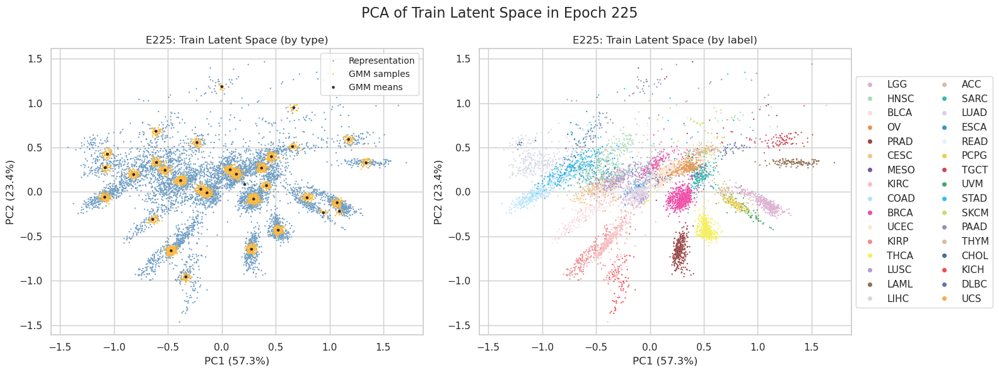

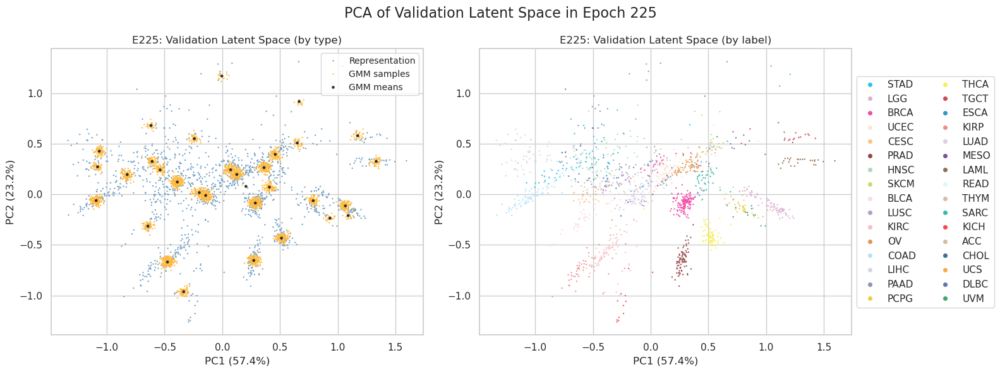

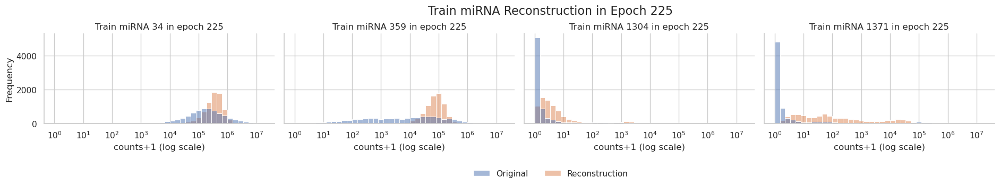

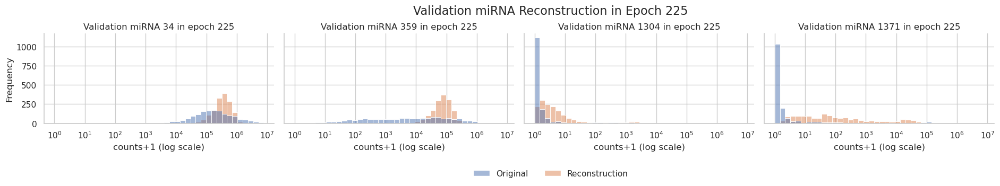

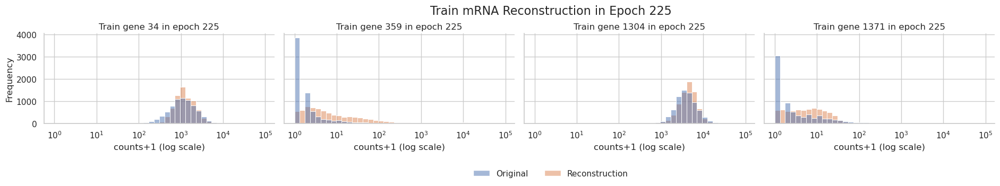

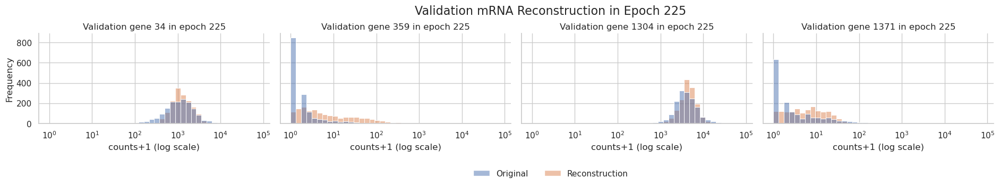

 15%|█████████████████████████████████▋                                                                                                                                                                                         | 231/1500 [17:18<1:51:16,  5.26s/it]

230 train_loss: 10.7903850064286 train_loss_decoder: 8.787991485636287 train_recon_mirna: 2.0603840780859852 train_recon_mrna: 6.727607407550302 train_gmm: 2.0023935207923143 train_mse: 535019360.0 train_mae: 5499.4326171875 train_r2: 0.34831202030181885 train_spearman: 0.2275351881980896 train_pearson: 0.6933905482292175 train_msle: 20.804698944091797
230 test_loss: 10.823000119568734 test_loss_decoder: 8.819206167013766 test_recon_mirna: 2.084480094083229 test_recon_mrna: 6.7347260729305365 test_gmm: 2.003793952554968 test_mse: 460638656.0 test_mae: 5278.48974609375 test_r2: 0.35381150245666504 test_spearman: 0.2009073793888092 test_pearson: 0.6790468692779541 test_msle: 20.670564651489258


 16%|██████████████████████████████████▍                                                                                                                                                                                        | 236/1500 [17:39<1:34:24,  4.48s/it]

235 train_loss: 10.780676185499692 train_loss_decoder: 8.777500314857946 train_recon_mirna: 2.0566618587894094 train_recon_mrna: 6.7208384560685355 train_gmm: 2.003175870641746 train_mse: 533627200.0 train_mae: 5389.4619140625 train_r2: 0.3500077724456787 train_spearman: 0.22651159763336182 train_pearson: 0.7032923102378845 train_msle: 19.084423065185547
235 test_loss: 10.81635183903156 test_loss_decoder: 8.810073760577811 test_recon_mirna: 2.081933516639223 test_recon_mrna: 6.728140243938588 test_gmm: 2.0062780784537484 test_mse: 458636640.0 test_mae: 5212.916015625 test_r2: 0.3566199541091919 test_spearman: 0.19945691525936127 test_pearson: 0.6827126741409302 test_msle: 19.142324447631836


 16%|███████████████████████████████████▏                                                                                                                                                                                       | 241/1500 [18:01<1:32:29,  4.41s/it]

240 train_loss: 10.77076738493539 train_loss_decoder: 8.766960948983202 train_recon_mirna: 2.0528109360339366 train_recon_mrna: 6.714150012949266 train_gmm: 2.003806435952188 train_mse: 528343936.0 train_mae: 5450.3984375 train_r2: 0.3564431071281433 train_spearman: 0.22681103646755219 train_pearson: 0.6999098658561707 train_msle: 19.7646484375
240 test_loss: 10.808402908659723 test_loss_decoder: 8.800774444239964 test_recon_mirna: 2.0796665937563046 test_recon_mrna: 6.721107850483659 test_gmm: 2.007628464419758 test_mse: 455484416.0 test_mae: 5206.22998046875 test_r2: 0.36104196310043335 test_spearman: 0.19890624284744263 test_pearson: 0.6861639022827148 test_msle: 19.566585540771484


 16%|███████████████████████████████████▉                                                                                                                                                                                       | 246/1500 [18:21<1:27:42,  4.20s/it]

245 train_loss: 10.761461619356503 train_loss_decoder: 8.756952826597352 train_recon_mirna: 2.0492545075996755 train_recon_mrna: 6.707698318997677 train_gmm: 2.004508792759151 train_mse: 524331808.0 train_mae: 5459.54248046875 train_r2: 0.36133015155792236 train_spearman: 0.22710247337818146 train_pearson: 0.7023729681968689 train_msle: 20.274452209472656
245 test_loss: 10.803930062240672 test_loss_decoder: 8.795066618352617 test_recon_mirna: 2.079801792194244 test_recon_mrna: 6.715264826158374 test_gmm: 2.0088634438880555 test_mse: 451176800.0 test_mae: 5268.3349609375 test_r2: 0.36708468198776245 test_spearman: 0.2009246051311493 test_pearson: 0.6850618124008179 test_msle: 20.321338653564453


 17%|████████████████████████████████████▋                                                                                                                                                                                      | 251/1500 [18:43<1:27:57,  4.23s/it]

250 train_loss: 10.752562213747218 train_loss_decoder: 8.747936930853438 train_recon_mirna: 2.0465956859301757 train_recon_mrna: 6.701341244923261 train_gmm: 2.0046252828937803 train_mse: 522216192.0 train_mae: 5422.36328125 train_r2: 0.3639071583747864 train_spearman: 0.2276574820280075 train_pearson: 0.708046555519104 train_msle: 20.08365249633789
250 test_loss: 10.797881373540854 test_loss_decoder: 8.78689795530066 test_recon_mirna: 2.077872492165545 test_recon_mrna: 6.709025463135116 test_gmm: 2.0109834182401936 test_mse: 449984832.0 test_mae: 5197.35888671875 test_r2: 0.3687567710876465 test_spearman: 0.19958102703094482 test_pearson: 0.6928556561470032 test_msle: 20.024728775024414


 17%|█████████████████████████████████████▍                                                                                                                                                                                     | 256/1500 [19:04<1:29:29,  4.32s/it]

255 train_loss: 10.743473428471265 train_loss_decoder: 8.738571973300065 train_recon_mirna: 2.0438199045633123 train_recon_mrna: 6.694752068736753 train_gmm: 2.0049014551712006 train_mse: 516573888.0 train_mae: 5424.98193359375 train_r2: 0.370779812335968 train_spearman: 0.22851403057575226 train_pearson: 0.7100847959518433 train_msle: 20.152584075927734
255 test_loss: 10.79260753578195 test_loss_decoder: 8.779095923208518 test_recon_mirna: 2.07692256754889 test_recon_mrna: 6.702173355659628 test_gmm: 2.0135116125734327 test_mse: 444927488.0 test_mae: 5214.72119140625 test_r2: 0.37585127353668213 test_spearman: 0.20084944367408752 test_pearson: 0.6929970979690552 test_msle: 20.122663497924805


 17%|██████████████████████████████████████                                                                                                                                                                                     | 261/1500 [19:26<1:30:55,  4.40s/it]

260 train_loss: 10.735103241199948 train_loss_decoder: 8.72972025839876 train_recon_mirna: 2.041378320489624 train_recon_mrna: 6.688341937909137 train_gmm: 2.005382982801188 train_mse: 512825184.0 train_mae: 5343.85546875 train_r2: 0.37534594535827637 train_spearman: 0.2292337864637375 train_pearson: 0.7187550067901611 train_msle: 19.05204963684082
260 test_loss: 10.785434594921728 test_loss_decoder: 8.771887964766757 test_recon_mirna: 2.075933510467851 test_recon_mrna: 6.695954454298906 test_gmm: 2.0135466301549707 test_mse: 441800768.0 test_mae: 5146.30419921875 test_r2: 0.38023751974105835 test_spearman: 0.20144808292388916 test_pearson: 0.7007067203521729 test_msle: 19.022113800048828


 18%|██████████████████████████████████████▊                                                                                                                                                                                    | 266/1500 [19:47<1:25:12,  4.14s/it]

265 train_loss: 10.727143667472307 train_loss_decoder: 8.72162681974432 train_recon_mirna: 2.0393536054482913 train_recon_mrna: 6.682273214296028 train_gmm: 2.005516847727988 train_mse: 509068192.0 train_mae: 5337.91455078125 train_r2: 0.37992221117019653 train_spearman: 0.23121410608291626 train_pearson: 0.7212070822715759 train_msle: 19.241561889648438
265 test_loss: 10.775626932866198 test_loss_decoder: 8.76098434241908 test_recon_mirna: 2.071404237389902 test_recon_mrna: 6.6895801050291785 test_gmm: 2.0146425904471172 test_mse: 439855136.0 test_mae: 5124.20947265625 test_r2: 0.3829668164253235 test_spearman: 0.20361432433128357 test_pearson: 0.7030552625656128 test_msle: 19.166330337524414


 18%|███████████████████████████████████████▌                                                                                                                                                                                   | 271/1500 [20:11<1:37:12,  4.75s/it]

270 train_loss: 10.718563929317746 train_loss_decoder: 8.713200622888829 train_recon_mirna: 2.037071076458543 train_recon_mrna: 6.676129546430286 train_gmm: 2.005363306428916 train_mse: 505279136.0 train_mae: 5299.2275390625 train_r2: 0.3845375180244446 train_spearman: 0.23221731185913086 train_pearson: 0.7256804704666138 train_msle: 18.80021858215332
270 test_loss: 10.764444583107025 test_loss_decoder: 8.750084977717169 test_recon_mirna: 2.0664439669890986 test_recon_mrna: 6.683641010728071 test_gmm: 2.0143596053898567 test_mse: 435079008.0 test_mae: 5086.13818359375 test_r2: 0.3896667957305908 test_spearman: 0.20600008964538574 test_pearson: 0.7088879942893982 test_msle: 18.7183837890625


 18%|████████████████████████████████████████▎                                                                                                                                                                                  | 276/1500 [20:33<1:31:10,  4.47s/it]

275 train_loss: 10.710881405929284 train_loss_decoder: 8.705631559784841 train_recon_mirna: 2.035132558020044 train_recon_mrna: 6.670499001764798 train_gmm: 2.005249846144443 train_mse: 500573056.0 train_mae: 5263.3505859375 train_r2: 0.3902698755264282 train_spearman: 0.2334674745798111 train_pearson: 0.7312687635421753 train_msle: 18.66014862060547
275 test_loss: 10.752969541659027 test_loss_decoder: 8.739126421475962 test_recon_mirna: 2.0605783216406373 test_recon_mrna: 6.678548099835325 test_gmm: 2.013843120183064 test_mse: 432542016.0 test_mae: 5080.41552734375 test_r2: 0.3932257294654846 test_spearman: 0.206436887383461 test_pearson: 0.7101569175720215 test_msle: 18.631410598754883


 19%|█████████████████████████████████████████                                                                                                                                                                                  | 281/1500 [20:54<1:26:37,  4.26s/it]

280 train_loss: 10.703138892051149 train_loss_decoder: 8.69791386579259 train_recon_mirna: 2.033185302277844 train_recon_mrna: 6.664728563514744 train_gmm: 2.0052250262585596 train_mse: 496440576.0 train_mae: 5378.8203125 train_r2: 0.39530348777770996 train_spearman: 0.23779475688934326 train_pearson: 0.7237066030502319 train_msle: 20.6734676361084
280 test_loss: 10.740462829778558 test_loss_decoder: 8.726445831328803 test_recon_mirna: 2.053915266627759 test_recon_mrna: 6.672530564701045 test_gmm: 2.0140169984497547 test_mse: 428381376.0 test_mae: 5157.41845703125 test_r2: 0.3990623354911804 test_spearman: 0.2113204300403595 test_pearson: 0.7074317336082458 test_msle: 20.663179397583008


 19%|█████████████████████████████████████████▊                                                                                                                                                                                 | 286/1500 [21:17<1:33:46,  4.63s/it]

285 train_loss: 10.694978224865178 train_loss_decoder: 8.689982875392712 train_recon_mirna: 2.030913396437567 train_recon_mrna: 6.6590694789551454 train_gmm: 2.004995349472467 train_mse: 492983424.0 train_mae: 5267.947265625 train_r2: 0.39951449632644653 train_spearman: 0.23742984235286713 train_pearson: 0.7332438230514526 train_msle: 19.017499923706055
285 test_loss: 10.725201476265276 test_loss_decoder: 8.714203700080004 test_recon_mirna: 2.0470274151913466 test_recon_mrna: 6.667176284888658 test_gmm: 2.0109977761852726 test_mse: 426716128.0 test_mae: 5088.00390625 test_r2: 0.40139836072921753 test_spearman: 0.21143105626106262 test_pearson: 0.7125320434570312 test_msle: 19.0124568939209


 19%|██████████████████████████████████████████▍                                                                                                                                                                                | 291/1500 [21:41<1:34:53,  4.71s/it]

290 train_loss: 10.686816095116402 train_loss_decoder: 8.682547113986798 train_recon_mirna: 2.0287547722228454 train_recon_mrna: 6.653792341763953 train_gmm: 2.004268981129604 train_mse: 490544256.0 train_mae: 5280.4443359375 train_r2: 0.40248554944992065 train_spearman: 0.24112550914287567 train_pearson: 0.7336617708206177 train_msle: 19.76232147216797
290 test_loss: 10.713660373696849 test_loss_decoder: 8.703805253617123 test_recon_mirna: 2.04153324944166 test_recon_mrna: 6.662272004175463 test_gmm: 2.009855120079725 test_mse: 422471776.0 test_mae: 5066.62890625 test_r2: 0.40735238790512085 test_spearman: 0.21690936386585236 test_pearson: 0.7165918350219727 test_msle: 19.67661476135254


 20%|███████████████████████████████████████████▏                                                                                                                                                                               | 296/1500 [22:06<1:36:38,  4.82s/it]

295 train_loss: 10.679789274349105 train_loss_decoder: 8.675570081665558 train_recon_mirna: 2.026864442255211 train_recon_mrna: 6.648705639410347 train_gmm: 2.0042191926835473 train_mse: 487101056.0 train_mae: 5188.19921875 train_r2: 0.406679630279541 train_spearman: 0.24200136959552765 train_pearson: 0.7415927648544312 train_msle: 18.337276458740234
295 test_loss: 10.706368614704793 test_loss_decoder: 8.697374890472105 test_recon_mirna: 2.039781763476208 test_recon_mrna: 6.657593126995898 test_gmm: 2.0089937242326874 test_mse: 420328992.0 test_mae: 4996.08984375 test_r2: 0.4103583097457886 test_spearman: 0.21778060495853424 test_pearson: 0.7221041917800903 test_msle: 18.351537704467773


 20%|███████████████████████████████████████████▊                                                                                                                                                                               | 300/1500 [22:25<1:34:07,  4.71s/it]

300 train_loss: 10.671675198629512 train_loss_decoder: 8.667996517069541 train_recon_mirna: 2.024352345574186 train_recon_mrna: 6.643644171495356 train_gmm: 2.003678681559971 train_mse: 484016384.0 train_mae: 5221.56591796875 train_r2: 0.4104369282722473 train_spearman: 0.24550548195838928 train_pearson: 0.7405633926391602 train_msle: 19.462100982666016
300 test_loss: 10.694392678370857 test_loss_decoder: 8.687318035073327 test_recon_mirna: 2.0341492516442403 test_recon_mrna: 6.653168783429087 test_gmm: 2.00707464329753 test_mse: 418502496.0 test_mae: 5046.80078125 test_r2: 0.4129205346107483 test_spearman: 0.21981647610664368 test_pearson: 0.7197752594947815 test_msle: 19.5908145904541


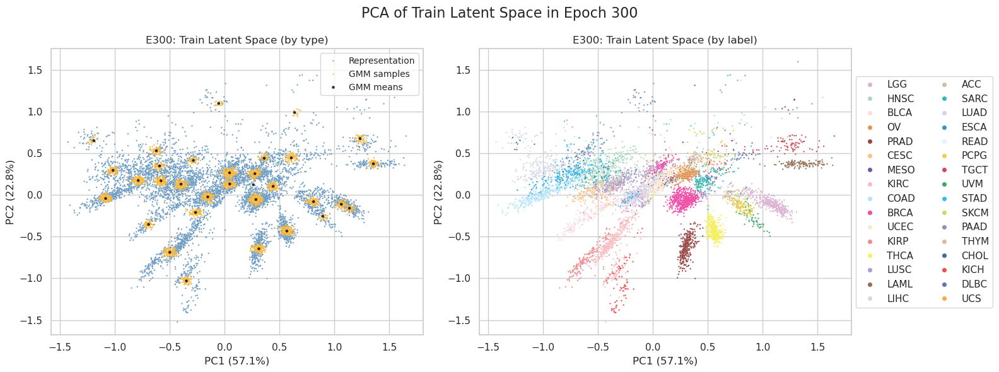

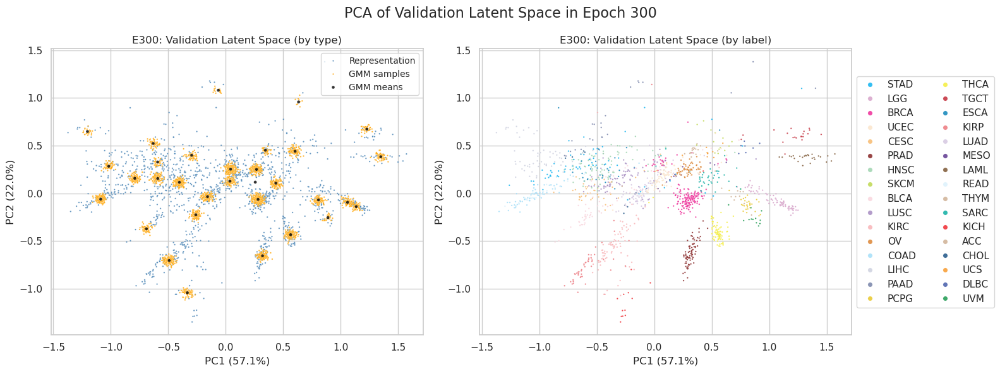

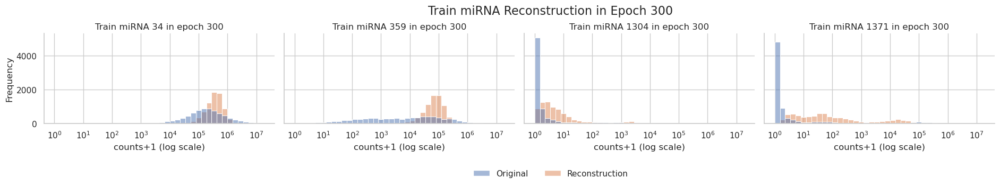

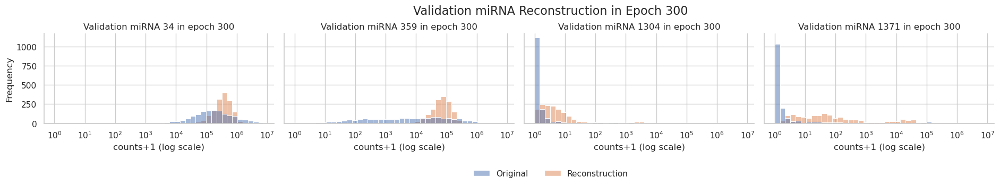

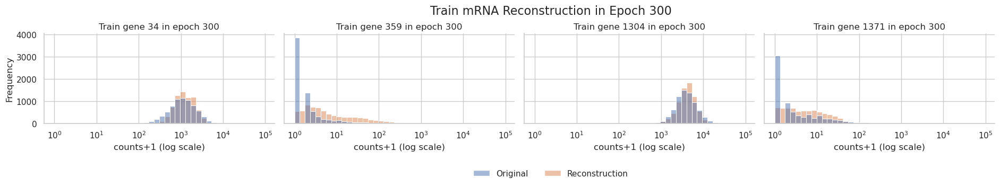

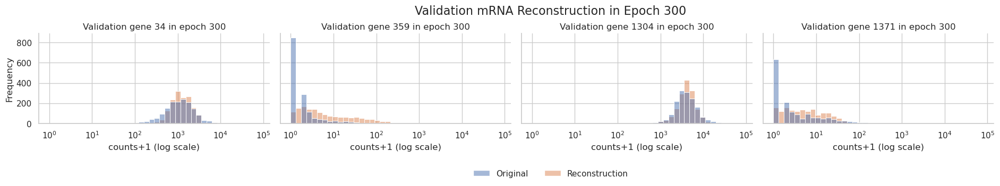

 20%|████████████████████████████████████████████▋                                                                                                                                                                              | 306/1500 [23:08<1:46:58,  5.38s/it]

305 train_loss: 10.663770028753206 train_loss_decoder: 8.660490537555166 train_recon_mirna: 2.0218703168342707 train_recon_mrna: 6.638620220720894 train_gmm: 2.0032794911980396 train_mse: 483497152.0 train_mae: 5147.82666015625 train_r2: 0.411069393157959 train_spearman: 0.2463422566652298 train_pearson: 0.747119128704071 train_msle: 18.388599395751953
305 test_loss: 10.686120974920708 test_loss_decoder: 8.679698698926082 test_recon_mirna: 2.0303344971259025 test_recon_mrna: 6.649364201800179 test_gmm: 2.006422275994627 test_mse: 417119520.0 test_mae: 4934.25146484375 test_r2: 0.4148606061935425 test_spearman: 0.22155849635601044 test_pearson: 0.728791356086731 test_msle: 18.31485366821289


 21%|█████████████████████████████████████████████▍                                                                                                                                                                             | 311/1500 [23:30<1:32:18,  4.66s/it]

310 train_loss: 10.655930286774371 train_loss_decoder: 8.653082536887219 train_recon_mirna: 2.0191865137613085 train_recon_mrna: 6.633896023125909 train_gmm: 2.002847749887152 train_mse: 481136320.0 train_mae: 5133.875 train_r2: 0.4139450788497925 train_spearman: 0.2483924776315689 train_pearson: 0.7492556571960449 train_msle: 18.886795043945312
310 test_loss: 10.674462331584525 test_loss_decoder: 8.669573279152548 test_recon_mirna: 2.0260934624376628 test_recon_mrna: 6.643479816714884 test_gmm: 2.0048890524319773 test_mse: 414817056.0 test_mae: 4936.9619140625 test_r2: 0.4180905222892761 test_spearman: 0.22513830661773682 test_pearson: 0.7304738759994507 test_msle: 18.89952278137207


 21%|██████████████████████████████████████████████▏                                                                                                                                                                            | 316/1500 [23:52<1:26:40,  4.39s/it]

315 train_loss: 10.648421316677577 train_loss_decoder: 8.64630268518226 train_recon_mirna: 2.0169870167314947 train_recon_mrna: 6.629315668450764 train_gmm: 2.002118631495318 train_mse: 478690464.0 train_mae: 5063.1650390625 train_r2: 0.41692429780960083 train_spearman: 0.2501637935638428 train_pearson: 0.7560380101203918 train_msle: 18.187641143798828
315 test_loss: 10.668179759749112 test_loss_decoder: 8.663242330606245 test_recon_mirna: 2.023294839102322 test_recon_mrna: 6.639947491503922 test_gmm: 2.0049374291428665 test_mse: 411769600.0 test_mae: 4858.30908203125 test_r2: 0.4223654866218567 test_spearman: 0.22512897849082947 test_pearson: 0.7379055619239807 test_msle: 18.171905517578125


 21%|██████████████████████████████████████████████▊                                                                                                                                                                            | 321/1500 [24:15<1:30:32,  4.61s/it]

320 train_loss: 10.641098763341406 train_loss_decoder: 8.639756295866661 train_recon_mirna: 2.0147312820859575 train_recon_mrna: 6.6250250137807045 train_gmm: 2.001342467474745 train_mse: 478618624.0 train_mae: 4949.7724609375 train_r2: 0.4170117974281311 train_spearman: 0.2525886595249176 train_pearson: 0.7664543986320496 train_msle: 16.80513572692871
320 test_loss: 10.659342768225406 test_loss_decoder: 8.65631539247957 test_recon_mirna: 2.019819057817939 test_recon_mrna: 6.636496334661631 test_gmm: 2.0030273757458352 test_mse: 412192448.0 test_mae: 4762.1025390625 test_r2: 0.421772301197052 test_spearman: 0.22677741944789886 test_pearson: 0.7460246086120605 test_msle: 16.771543502807617


 22%|███████████████████████████████████████████████▌                                                                                                                                                                           | 326/1500 [24:37<1:26:26,  4.42s/it]

325 train_loss: 10.634044737604693 train_loss_decoder: 8.633028067290438 train_recon_mirna: 2.012288880184717 train_recon_mrna: 6.620739187105721 train_gmm: 2.001016670314256 train_mse: 477728064.0 train_mae: 4956.2939453125 train_r2: 0.41809648275375366 train_spearman: 0.2554575204849243 train_pearson: 0.7664453983306885 train_msle: 17.5386905670166
325 test_loss: 10.65070169082194 test_loss_decoder: 8.648193283804595 test_recon_mirna: 2.0167764693802983 test_recon_mrna: 6.6314168144242975 test_gmm: 2.0025084070173444 test_mse: 411623360.0 test_mae: 4766.00732421875 test_r2: 0.4225706458091736 test_spearman: 0.23168236017227173 test_pearson: 0.7469858527183533 test_msle: 17.52035903930664


 22%|████████████████████████████████████████████████▎                                                                                                                                                                          | 331/1500 [24:59<1:26:43,  4.45s/it]

330 train_loss: 10.626571729763151 train_loss_decoder: 8.626038549303004 train_recon_mirna: 2.0095160783734647 train_recon_mrna: 6.616522470929539 train_gmm: 2.0005331804601467 train_mse: 472689984.0 train_mae: 4994.9794921875 train_r2: 0.42423325777053833 train_spearman: 0.25898244976997375 train_pearson: 0.7639158368110657 train_msle: 18.741901397705078
330 test_loss: 10.64466869857267 test_loss_decoder: 8.643039786131848 test_recon_mirna: 2.0156853239677592 test_recon_mrna: 6.627354462164089 test_gmm: 2.001628912440822 test_mse: 408375264.0 test_mae: 4812.96533203125 test_r2: 0.4271271228790283 test_spearman: 0.23381097614765167 test_pearson: 0.7435247302055359 test_msle: 18.727882385253906


 22%|█████████████████████████████████████████████████                                                                                                                                                                          | 336/1500 [25:22<1:27:10,  4.49s/it]

335 train_loss: 10.619886452937958 train_loss_decoder: 8.619519024104918 train_recon_mirna: 2.007192629893269 train_recon_mrna: 6.612326394211648 train_gmm: 2.0003674288330417 train_mse: 471374048.0 train_mae: 4898.6748046875 train_r2: 0.42583608627319336 train_spearman: 0.2608220875263214 train_pearson: 0.773202657699585 train_msle: 17.712867736816406
335 test_loss: 10.637602304678829 test_loss_decoder: 8.63630102289491 test_recon_mirna: 2.012995449258253 test_recon_mrna: 6.6233055736366575 test_gmm: 2.0013012817839186 test_mse: 405822688.0 test_mae: 4699.16748046875 test_r2: 0.4307078719139099 test_spearman: 0.23603582382202148 test_pearson: 0.7542821168899536 test_msle: 17.672046661376953


 23%|█████████████████████████████████████████████████▊                                                                                                                                                                         | 341/1500 [25:44<1:25:10,  4.41s/it]

340 train_loss: 10.61315618283803 train_loss_decoder: 8.612752431004251 train_recon_mirna: 2.0046534945958556 train_recon_mrna: 6.608098936408395 train_gmm: 2.0004037518337774 train_mse: 473847904.0 train_mae: 4824.37255859375 train_r2: 0.4228227734565735 train_spearman: 0.26411736011505127 train_pearson: 0.7804198861122131 train_msle: 17.333343505859375
340 test_loss: 10.63008714244209 test_loss_decoder: 8.630086850759126 test_recon_mirna: 2.0090551226005386 test_recon_mrna: 6.621031728158587 test_gmm: 2.000000291682964 test_mse: 409323936.0 test_mae: 4627.1865234375 test_r2: 0.4257963299751282 test_spearman: 0.23962028324604034 test_pearson: 0.7613759636878967 test_msle: 17.277854919433594


 23%|██████████████████████████████████████████████████▌                                                                                                                                                                        | 346/1500 [26:05<1:23:17,  4.33s/it]

345 train_loss: 10.606148344283746 train_loss_decoder: 8.605831685593735 train_recon_mirna: 2.001867795455785 train_recon_mrna: 6.60396389013795 train_gmm: 2.000316658690011 train_mse: 474584480.0 train_mae: 4701.08251953125 train_r2: 0.4219256043434143 train_spearman: 0.265447735786438 train_pearson: 0.791754961013794 train_msle: 15.73401927947998
345 test_loss: 10.622318406100776 test_loss_decoder: 8.622765018107907 test_recon_mirna: 2.007429895022731 test_recon_mrna: 6.615335123085176 test_gmm: 1.9995533879928689 test_mse: 408539328.0 test_mae: 4470.89453125 test_r2: 0.42689698934555054 test_spearman: 0.24090225994586945 test_pearson: 0.7772935032844543 test_msle: 15.565001487731934


 23%|███████████████████████████████████████████████████▏                                                                                                                                                                       | 351/1500 [26:27<1:23:34,  4.36s/it]

350 train_loss: 10.599787359372556 train_loss_decoder: 8.59941174569018 train_recon_mirna: 1.9995023153472795 train_recon_mrna: 6.599909430342901 train_gmm: 2.000375613682377 train_mse: 471162464.0 train_mae: 4693.10595703125 train_r2: 0.4260938763618469 train_spearman: 0.26903441548347473 train_pearson: 0.7920576333999634 train_msle: 16.393274307250977
350 test_loss: 10.61570343787982 test_loss_decoder: 8.616730016071173 test_recon_mirna: 2.0044694101121694 test_recon_mrna: 6.612260605959003 test_gmm: 1.998973421808647 test_mse: 406146944.0 test_mae: 4505.65380859375 test_r2: 0.43025296926498413 test_spearman: 0.24555613100528717 test_pearson: 0.773372232913971 test_msle: 16.34455680847168


 24%|███████████████████████████████████████████████████▉                                                                                                                                                                       | 356/1500 [26:49<1:23:38,  4.39s/it]

355 train_loss: 10.593938095074106 train_loss_decoder: 8.593125908060074 train_recon_mirna: 1.9971466572400707 train_recon_mrna: 6.595979250820004 train_gmm: 2.000812187014033 train_mse: 475645728.0 train_mae: 4568.0927734375 train_r2: 0.4206329584121704 train_spearman: 0.27047309279441833 train_pearson: 0.8040438890457153 train_msle: 14.847204208374023
355 test_loss: 10.609785667781809 test_loss_decoder: 8.610614594552796 test_recon_mirna: 2.0024494222571985 test_recon_mrna: 6.608165172295597 test_gmm: 1.9991710732290122 test_mse: 406845472.0 test_mae: 4353.5625 test_r2: 0.4292730689048767 test_spearman: 0.2438541054725647 test_pearson: 0.7896105051040649 test_msle: 14.77721881866455


 24%|████████████████████████████████████████████████████▋                                                                                                                                                                      | 361/1500 [27:11<1:21:21,  4.29s/it]

360 train_loss: 10.587126504485537 train_loss_decoder: 8.585923178598708 train_recon_mirna: 1.9938357737268044 train_recon_mrna: 6.592087404871903 train_gmm: 2.001203325886829 train_mse: 477209408.0 train_mae: 4554.1259765625 train_r2: 0.4187282919883728 train_spearman: 0.2755475640296936 train_pearson: 0.8068438172340393 train_msle: 15.503398895263672
360 test_loss: 10.601998108537789 test_loss_decoder: 8.60392644817478 test_recon_mirna: 1.999590478404947 test_recon_mrna: 6.604335969769833 test_gmm: 1.9980716603630075 test_mse: 408691488.0 test_mae: 4361.61328125 test_r2: 0.4266834855079651 test_spearman: 0.248809352517128 test_pearson: 0.788470983505249 test_msle: 15.516738891601562


 24%|█████████████████████████████████████████████████████▍                                                                                                                                                                     | 366/1500 [27:32<1:21:52,  4.33s/it]

365 train_loss: 10.581168397888398 train_loss_decoder: 8.579324907734472 train_recon_mirna: 1.9910747942315747 train_recon_mrna: 6.588250113502898 train_gmm: 2.001843490153925 train_mse: 474252544.0 train_mae: 4488.29736328125 train_r2: 0.42232996225357056 train_spearman: 0.2790282964706421 train_pearson: 0.8117596507072449 train_msle: 15.282450675964355
365 test_loss: 10.595772944283905 test_loss_decoder: 8.59806485433388 test_recon_mirna: 1.997283624970516 test_recon_mrna: 6.600781229363363 test_gmm: 1.9977080899500257 test_mse: 406334528.0 test_mae: 4273.5693359375 test_r2: 0.42998987436294556 test_spearman: 0.2552917003631592 test_pearson: 0.7968685626983643 test_msle: 15.167681694030762


 25%|██████████████████████████████████████████████████████▏                                                                                                                                                                    | 371/1500 [27:55<1:23:45,  4.45s/it]

370 train_loss: 10.574726171147518 train_loss_decoder: 8.572347310618584 train_recon_mirna: 1.9877423144214557 train_recon_mrna: 6.584604996197129 train_gmm: 2.0023788605289337 train_mse: 475632672.0 train_mae: 4474.63427734375 train_r2: 0.42064881324768066 train_spearman: 0.2825012505054474 train_pearson: 0.8138958811759949 train_msle: 15.918478012084961
370 test_loss: 10.590415193855023 test_loss_decoder: 8.592464514953996 test_recon_mirna: 1.9949037917385515 test_recon_mrna: 6.5975607232154445 test_gmm: 1.9979506789010275 test_mse: 407706272.0 test_mae: 4271.88720703125 test_r2: 0.42806559801101685 test_spearman: 0.25711575150489807 test_pearson: 0.7981940507888794 test_msle: 15.930438041687012


 25%|██████████████████████████████████████████████████████▊                                                                                                                                                                    | 375/1500 [28:13<1:24:21,  4.50s/it]

375 train_loss: 10.56925132701247 train_loss_decoder: 8.565865878795941 train_recon_mirna: 1.9846200846239743 train_recon_mrna: 6.581245794171967 train_gmm: 2.003385448216528 train_mse: 478171840.0 train_mae: 4352.58984375 train_r2: 0.4175559878349304 train_spearman: 0.2840588390827179 train_pearson: 0.8250313401222229 train_msle: 14.41560173034668
375 test_loss: 10.586691454020198 test_loss_decoder: 8.588297679181508 test_recon_mirna: 1.9927467945344965 test_recon_mrna: 6.595550884647011 test_gmm: 1.9983937748386893 test_mse: 409067744.0 test_mae: 4169.103515625 test_r2: 0.426155686378479 test_spearman: 0.2569117844104767 test_pearson: 0.8077325224876404 test_msle: 14.528095245361328


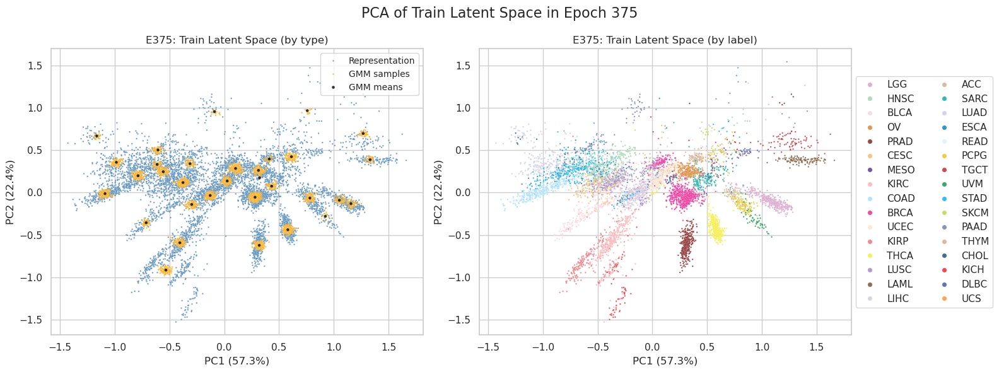

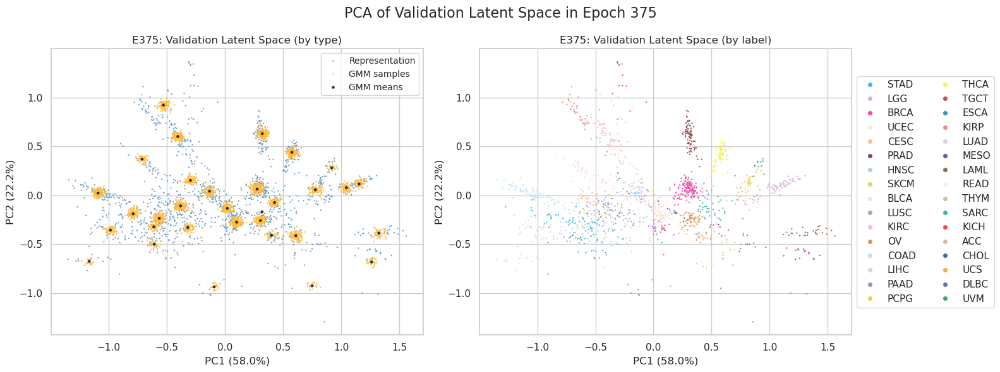

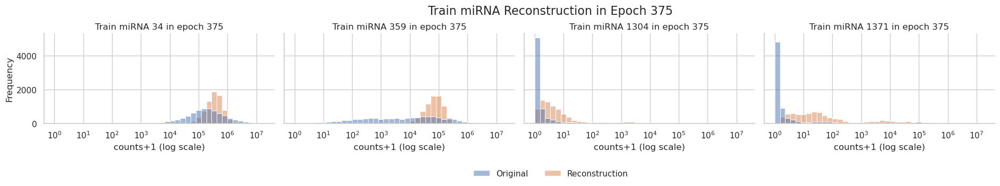

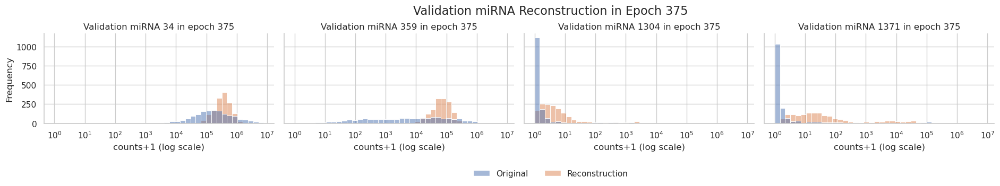

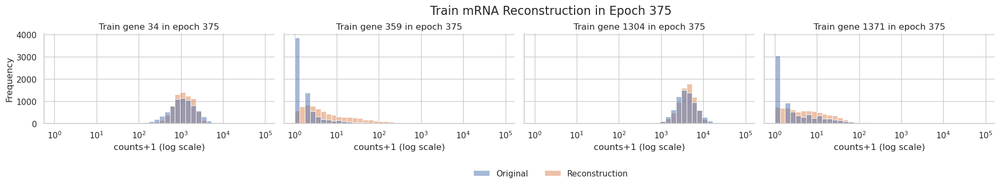

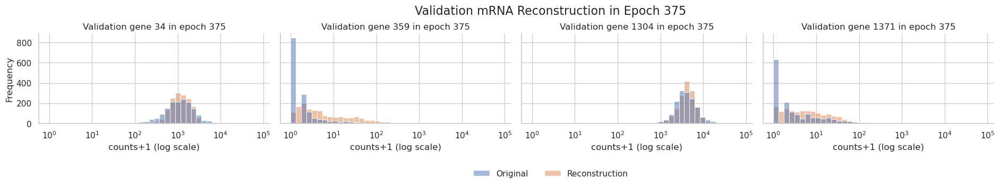

 25%|███████████████████████████████████████████████████████▋                                                                                                                                                                   | 381/1500 [28:55<1:34:55,  5.09s/it]

380 train_loss: 10.563620614733733 train_loss_decoder: 8.558973971874918 train_recon_mirna: 1.981545985861113 train_recon_mrna: 6.577427986013805 train_gmm: 2.004646642858815 train_mse: 480080128.0 train_mae: 4325.59326171875 train_r2: 0.41523152589797974 train_spearman: 0.2876729965209961 train_pearson: 0.8273946046829224 train_msle: 14.854818344116211
380 test_loss: 10.581989134592229 test_loss_decoder: 8.583839144207845 test_recon_mirna: 1.991142848809551 test_recon_mrna: 6.592696295398294 test_gmm: 1.9981499903843833 test_mse: 412411200.0 test_mae: 4112.83984375 test_r2: 0.4214654564857483 test_spearman: 0.2611752152442932 test_pearson: 0.8135432004928589 test_msle: 14.872074127197266


 26%|████████████████████████████████████████████████████████▎                                                                                                                                                                  | 386/1500 [29:17<1:23:14,  4.48s/it]

385 train_loss: 10.557595782755362 train_loss_decoder: 8.551661764115936 train_recon_mirna: 1.977905816996898 train_recon_mrna: 6.5737559471190385 train_gmm: 2.0059340186394254 train_mse: 481722784.0 train_mae: 4271.71923828125 train_r2: 0.41323065757751465 train_spearman: 0.29164597392082214 train_pearson: 0.8323360085487366 train_msle: 14.70660400390625
385 test_loss: 10.575100635496709 test_loss_decoder: 8.57672750863708 test_recon_mirna: 1.9884583996180667 test_recon_mrna: 6.588269109019014 test_gmm: 1.9983731268596276 test_mse: 411633056.0 test_mae: 4070.18017578125 test_r2: 0.4225570559501648 test_spearman: 0.26709941029548645 test_pearson: 0.8170152306556702 test_msle: 14.774373054504395


 26%|█████████████████████████████████████████████████████████                                                                                                                                                                  | 391/1500 [29:38<1:18:12,  4.23s/it]

390 train_loss: 10.553089659136983 train_loss_decoder: 8.545272731344381 train_recon_mirna: 1.975106094939035 train_recon_mrna: 6.570166636405347 train_gmm: 2.007816927792603 train_mse: 487201440.0 train_mae: 4165.162109375 train_r2: 0.4065573215484619 train_spearman: 0.2930414378643036 train_pearson: 0.8409292697906494 train_msle: 13.196843147277832
390 test_loss: 10.568947798780817 test_loss_decoder: 8.570440343979374 test_recon_mirna: 1.9865070241982226 test_recon_mrna: 6.583933319781153 test_gmm: 1.998507454801443 test_mse: 413659552.0 test_mae: 3954.387451171875 test_r2: 0.41971421241760254 test_spearman: 0.26688942313194275 test_pearson: 0.8288183212280273 test_msle: 13.29397201538086


 26%|█████████████████████████████████████████████████████████▊                                                                                                                                                                 | 396/1500 [30:00<1:19:27,  4.32s/it]

395 train_loss: 10.547067317816484 train_loss_decoder: 8.538715524163058 train_recon_mirna: 1.9721124993272292 train_recon_mrna: 6.566603024835828 train_gmm: 2.008351793653426 train_mse: 493381728.0 train_mae: 4133.46728515625 train_r2: 0.39902937412261963 train_spearman: 0.29739144444465637 train_pearson: 0.8468548655509949 train_msle: 13.506710052490234
395 test_loss: 10.563368990296926 test_loss_decoder: 8.564545718742705 test_recon_mirna: 1.9838868310594309 test_recon_mrna: 6.580658887683275 test_gmm: 1.9988232715542202 test_mse: 422129888.0 test_mae: 3925.966796875 test_r2: 0.40783196687698364 test_spearman: 0.27105584740638733 test_pearson: 0.830985426902771 test_msle: 13.574222564697266


 27%|██████████████████████████████████████████████████████████▌                                                                                                                                                                | 401/1500 [30:20<1:16:20,  4.17s/it]

400 train_loss: 10.542221242573568 train_loss_decoder: 8.532708869869388 train_recon_mirna: 1.9695187710814421 train_recon_mrna: 6.563190098787946 train_gmm: 2.0095123727041795 train_mse: 496418208.0 train_mae: 4060.8505859375 train_r2: 0.3953307271003723 train_spearman: 0.2997841536998749 train_pearson: 0.852715790271759 train_msle: 12.471424102783203
400 test_loss: 10.560512404172552 test_loss_decoder: 8.560258064813036 test_recon_mirna: 1.982235230058754 test_recon_mrna: 6.5780228347542815 test_gmm: 2.0002543393595165 test_mse: 428847648.0 test_mae: 3869.420654296875 test_r2: 0.3984082341194153 test_spearman: 0.27336862683296204 test_pearson: 0.8375175595283508 test_msle: 12.576516151428223


 27%|███████████████████████████████████████████████████████████▎                                                                                                                                                               | 406/1500 [30:41<1:17:09,  4.23s/it]

405 train_loss: 10.536917146964399 train_loss_decoder: 8.52693446005355 train_recon_mirna: 1.9671913621906167 train_recon_mrna: 6.559743097862934 train_gmm: 2.00998268691085 train_mse: 502209344.0 train_mae: 4004.245361328125 train_r2: 0.38827675580978394 train_spearman: 0.30242928862571716 train_pearson: 0.8579310774803162 train_msle: 11.522615432739258
405 test_loss: 10.554584786992969 test_loss_decoder: 8.55505234411878 test_recon_mirna: 1.980897381138826 test_recon_mrna: 6.574154962979954 test_gmm: 1.9995324428741892 test_mse: 427533856.0 test_mae: 3790.61181640625 test_r2: 0.40025126934051514 test_spearman: 0.2770751118659973 test_pearson: 0.8441023230552673 test_msle: 11.73077392578125


 27%|████████████████████████████████████████████████████████████                                                                                                                                                               | 411/1500 [31:02<1:15:23,  4.15s/it]

410 train_loss: 10.531757073474783 train_loss_decoder: 8.521141547111133 train_recon_mirna: 1.9648139790594221 train_recon_mrna: 6.556327568051712 train_gmm: 2.0106155263636483 train_mse: 508332352.0 train_mae: 3980.22802734375 train_r2: 0.38081854581832886 train_spearman: 0.30593112111091614 train_pearson: 0.8631837964057922 train_msle: 11.418363571166992
410 test_loss: 10.552140551976393 test_loss_decoder: 8.551043182627344 test_recon_mirna: 1.979620447536593 test_recon_mrna: 6.571422735090752 test_gmm: 2.0010973693490492 test_mse: 433857440.0 test_mae: 3753.9580078125 test_r2: 0.3913804888725281 test_spearman: 0.28019317984580994 test_pearson: 0.8495904207229614 test_msle: 11.501452445983887


 28%|████████████████████████████████████████████████████████████▋                                                                                                                                                              | 416/1500 [31:23<1:14:56,  4.15s/it]

415 train_loss: 10.526692659404702 train_loss_decoder: 8.515830310536053 train_recon_mirna: 1.9628694203995014 train_recon_mrna: 6.552960890136552 train_gmm: 2.0108623488686495 train_mse: 511010208.0 train_mae: 3944.63720703125 train_r2: 0.3775567412376404 train_spearman: 0.30857765674591064 train_pearson: 0.8668757081031799 train_msle: 10.856284141540527
415 test_loss: 10.5497886113057 test_loss_decoder: 8.547573540618417 test_recon_mirna: 1.979543304917851 test_recon_mrna: 6.568030235700567 test_gmm: 2.0022150706872828 test_mse: 441387840.0 test_mae: 3745.1611328125 test_r2: 0.3808166980743408 test_spearman: 0.28374141454696655 test_pearson: 0.8511558175086975 test_msle: 10.984524726867676


 28%|█████████████████████████████████████████████████████████████▍                                                                                                                                                             | 421/1500 [31:44<1:16:06,  4.23s/it]

420 train_loss: 10.521376197600013 train_loss_decoder: 8.510544157548665 train_recon_mirna: 1.9610508936733102 train_recon_mrna: 6.5494932638753545 train_gmm: 2.0108320400513477 train_mse: 519244960.0 train_mae: 3934.047119140625 train_r2: 0.36752623319625854 train_spearman: 0.31242021918296814 train_pearson: 0.8715187311172485 train_msle: 10.313344955444336
420 test_loss: 10.54551265009807 test_loss_decoder: 8.54297153862446 test_recon_mirna: 1.9785602217260216 test_recon_mrna: 6.564411316898438 test_gmm: 2.0025411114736094 test_mse: 444848640.0 test_mae: 3717.484375 test_r2: 0.37596189975738525 test_spearman: 0.28923922777175903 test_pearson: 0.8580641150474548 test_msle: 10.43787956237793


 28%|██████████████████████████████████████████████████████████████▏                                                                                                                                                            | 426/1500 [32:03<1:11:31,  4.00s/it]

425 train_loss: 10.516974077428289 train_loss_decoder: 8.505655379739519 train_recon_mirna: 1.9593442280008349 train_recon_mrna: 6.546311151738685 train_gmm: 2.0113186976887705 train_mse: 523243648.0 train_mae: 3915.104248046875 train_r2: 0.3626556396484375 train_spearman: 0.31590163707733154 train_pearson: 0.875303328037262 train_msle: 9.783761024475098
425 test_loss: 10.546804269430726 test_loss_decoder: 8.541548739677319 test_recon_mirna: 1.979670759808762 test_recon_mrna: 6.561877979868557 test_gmm: 2.0052555297534083 test_mse: 450211872.0 test_mae: 3699.197265625 test_r2: 0.3684383034706116 test_spearman: 0.2937307357788086 test_pearson: 0.8619634509086609 test_msle: 9.90429973602295


 29%|██████████████████████████████████████████████████████████████▉                                                                                                                                                            | 431/1500 [32:23<1:12:30,  4.07s/it]

430 train_loss: 10.512326023919766 train_loss_decoder: 8.500956745387132 train_recon_mirna: 1.9579736886453718 train_recon_mrna: 6.542983056741761 train_gmm: 2.011369278532634 train_mse: 524604640.0 train_mae: 3910.41064453125 train_r2: 0.36099785566329956 train_spearman: 0.32020801305770874 train_pearson: 0.877078115940094 train_msle: 10.062034606933594
430 test_loss: 10.543733886218114 test_loss_decoder: 8.537543359779177 test_recon_mirna: 1.979659158840611 test_recon_mrna: 6.557884200938565 test_gmm: 2.0061905264389375 test_mse: 451392544.0 test_mae: 3703.105224609375 test_r2: 0.3667820692062378 test_spearman: 0.298737496137619 test_pearson: 0.8605039119720459 test_msle: 10.24592113494873


 29%|███████████████████████████████████████████████████████████████▋                                                                                                                                                           | 436/1500 [32:44<1:14:02,  4.18s/it]

435 train_loss: 10.507855678452463 train_loss_decoder: 8.496154304627156 train_recon_mirna: 1.9564174249570907 train_recon_mrna: 6.539736879670066 train_gmm: 2.011701373825307 train_mse: 532823008.0 train_mae: 3913.834228515625 train_r2: 0.35098737478256226 train_spearman: 0.325346440076828 train_pearson: 0.8816473484039307 train_msle: 9.699699401855469
435 test_loss: 10.544811657578837 test_loss_decoder: 8.535086317071716 test_recon_mirna: 1.9802736267947223 test_recon_mrna: 6.554812690276994 test_gmm: 2.0097253405071203 test_mse: 453717216.0 test_mae: 3676.89990234375 test_r2: 0.36352092027664185 test_spearman: 0.30501386523246765 test_pearson: 0.8677684664726257 test_msle: 9.882781028747559


 29%|████████████████████████████████████████████████████████████████▍                                                                                                                                                          | 441/1500 [33:04<1:10:17,  3.98s/it]

440 train_loss: 10.50333554464469 train_loss_decoder: 8.491433341524829 train_recon_mirna: 1.9552203474980692 train_recon_mrna: 6.536212994026759 train_gmm: 2.0119022031198615 train_mse: 536484064.0 train_mae: 3899.046142578125 train_r2: 0.34652793407440186 train_spearman: 0.3288863003253937 train_pearson: 0.8848017454147339 train_msle: 8.381827354431152
440 test_loss: 10.545110163964795 test_loss_decoder: 8.53403362048173 test_recon_mirna: 1.9830859766639926 test_recon_mrna: 6.5509476438177385 test_gmm: 2.0110765434830644 test_mse: 458664640.0 test_mae: 3659.9541015625 test_r2: 0.3565806746482849 test_spearman: 0.31073543429374695 test_pearson: 0.8686012029647827 test_msle: 8.551398277282715


 30%|█████████████████████████████████████████████████████████████████                                                                                                                                                          | 446/1500 [33:24<1:11:09,  4.05s/it]

445 train_loss: 10.499193276475609 train_loss_decoder: 8.486701198326719 train_recon_mirna: 1.953918208387462 train_recon_mrna: 6.532782989939256 train_gmm: 2.01249207814889 train_mse: 541639488.0 train_mae: 3900.25244140625 train_r2: 0.3402482867240906 train_spearman: 0.33204716444015503 train_pearson: 0.8876358270645142 train_msle: 7.763079643249512
445 test_loss: 10.543152372996817 test_loss_decoder: 8.529978108141066 test_recon_mirna: 1.9819975175801026 test_recon_mrna: 6.547980590560964 test_gmm: 2.0131742648557505 test_mse: 467878208.0 test_mae: 3685.8291015625 test_r2: 0.3436557650566101 test_spearman: 0.31454089283943176 test_pearson: 0.8729537725448608 test_msle: 7.9189772605896


 30%|█████████████████████████████████████████████████████████████████▋                                                                                                                                                         | 450/1500 [33:40<1:08:38,  3.92s/it]

450 train_loss: 10.494969609191818 train_loss_decoder: 8.482200308686869 train_recon_mirna: 1.952578975013371 train_recon_mrna: 6.529621333673497 train_gmm: 2.01276930050495 train_mse: 543834624.0 train_mae: 3904.1337890625 train_r2: 0.33757448196411133 train_spearman: 0.33603212237358093 train_pearson: 0.8883382678031921 train_msle: 8.06155776977539
450 test_loss: 10.543679736778913 test_loss_decoder: 8.527598477903416 test_recon_mirna: 1.9827222148877401 test_recon_mrna: 6.544876263015676 test_gmm: 2.016081258875496 test_mse: 467192160.0 test_mae: 3678.816650390625 test_r2: 0.34461814165115356 test_spearman: 0.317253440618515 test_pearson: 0.8747580051422119 test_msle: 8.297080993652344


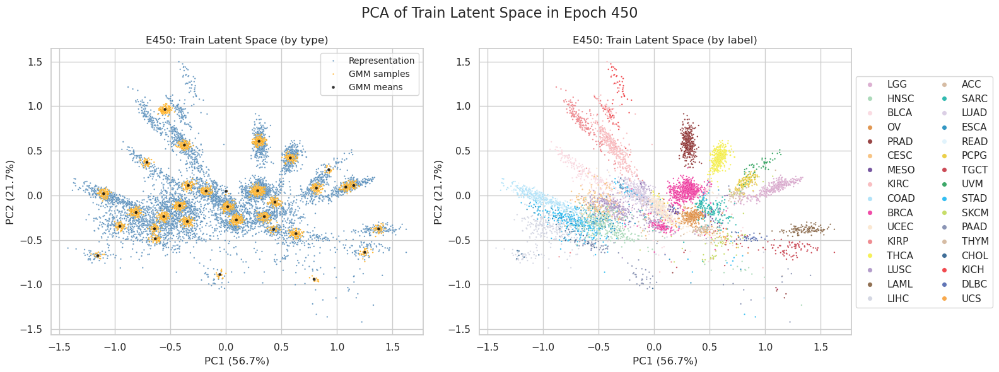

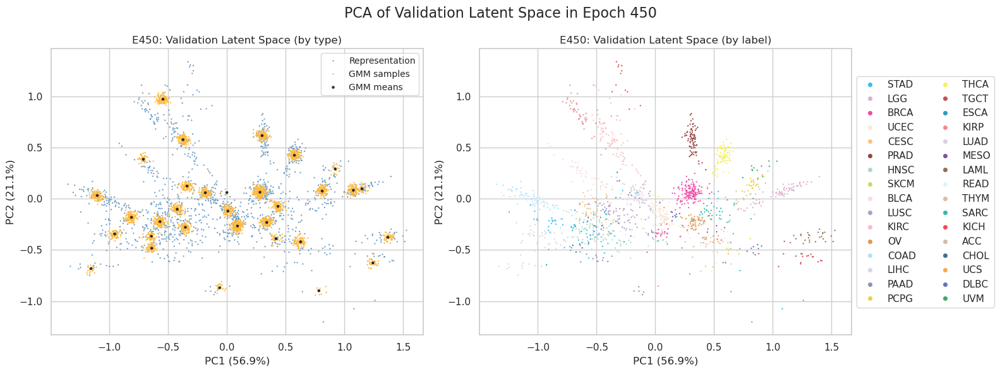

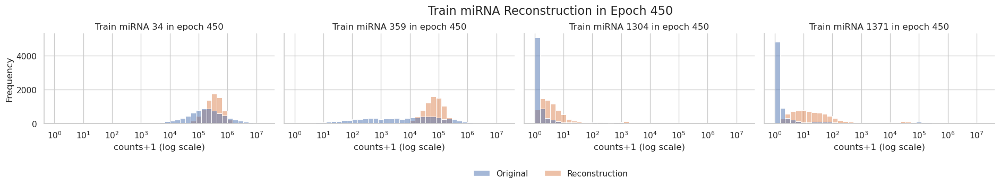

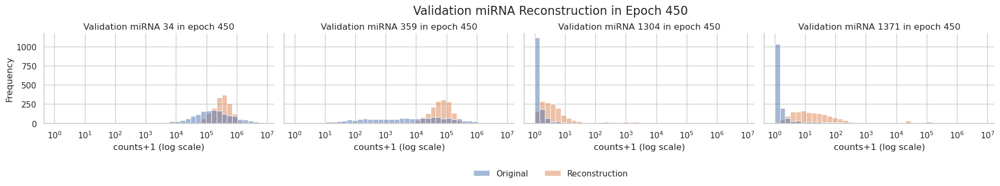

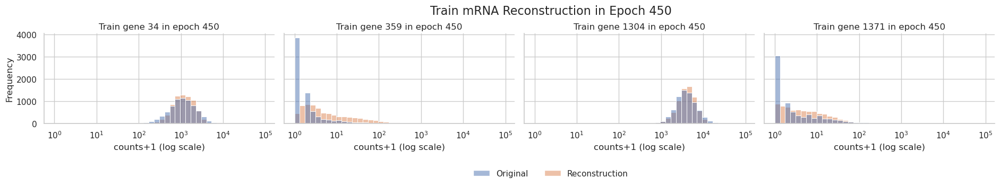

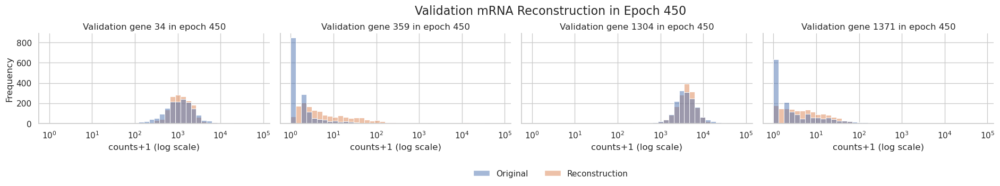

 30%|██████████████████████████████████████████████████████████████████▌                                                                                                                                                        | 456/1500 [34:23<1:30:08,  5.18s/it]

455 train_loss: 10.49105075498954 train_loss_decoder: 8.477655372586677 train_recon_mirna: 1.9513518781717505 train_recon_mrna: 6.526303494414926 train_gmm: 2.013395382402865 train_mse: 545888064.0 train_mae: 3900.87890625 train_r2: 0.33507323265075684 train_spearman: 0.3366713225841522 train_pearson: 0.8916661739349365 train_msle: 7.768274307250977
455 test_loss: 10.54235432685901 test_loss_decoder: 8.524779525209379 test_recon_mirna: 1.982958692746936 test_recon_mrna: 6.541820832462443 test_gmm: 2.0175748016496318 test_mse: 470238784.0 test_mae: 3674.88134765625 test_r2: 0.3403443694114685 test_spearman: 0.3190374970436096 test_pearson: 0.8759083151817322 test_msle: 7.938746929168701


 31%|███████████████████████████████████████████████████████████████████▎                                                                                                                                                       | 461/1500 [34:44<1:17:47,  4.49s/it]

460 train_loss: 10.48734908853923 train_loss_decoder: 8.473526225332916 train_recon_mirna: 1.9501760472806942 train_recon_mrna: 6.523350178052222 train_gmm: 2.013822863206313 train_mse: 541023360.0 train_mae: 3884.07177734375 train_r2: 0.3409987688064575 train_spearman: 0.33797261118888855 train_pearson: 0.891254186630249 train_msle: 8.350308418273926
460 test_loss: 10.538728977909344 test_loss_decoder: 8.521001511231841 test_recon_mirna: 1.9826335503566477 test_recon_mrna: 6.538367960875194 test_gmm: 2.017727466677503 test_mse: 465989600.0 test_mae: 3656.7080078125 test_r2: 0.34630513191223145 test_spearman: 0.3216020464897156 test_pearson: 0.8745672106742859 test_msle: 8.515509605407715


 31%|████████████████████████████████████████████████████████████████████                                                                                                                                                       | 466/1500 [35:04<1:08:24,  3.97s/it]

465 train_loss: 10.483526323852972 train_loss_decoder: 8.469240833368705 train_recon_mirna: 1.9491330970910752 train_recon_mrna: 6.52010773627763 train_gmm: 2.014285490484267 train_mse: 547423616.0 train_mae: 3892.022216796875 train_r2: 0.33320289850234985 train_spearman: 0.3384459912776947 train_pearson: 0.8931323289871216 train_msle: 7.534092903137207
465 test_loss: 10.539955322284948 test_loss_decoder: 8.520628383799655 test_recon_mirna: 1.9843957888521062 test_recon_mrna: 6.536232594947549 test_gmm: 2.019326938485293 test_mse: 469420320.0 test_mae: 3657.055908203125 test_r2: 0.34149253368377686 test_spearman: 0.3224380910396576 test_pearson: 0.8767680525779724 test_msle: 7.712206840515137


 31%|████████████████████████████████████████████████████████████████████▊                                                                                                                                                      | 471/1500 [35:26<1:16:35,  4.47s/it]

470 train_loss: 10.479398998817675 train_loss_decoder: 8.464545060587602 train_recon_mirna: 1.9477366847925086 train_recon_mrna: 6.516808375795094 train_gmm: 2.0148539382300736 train_mse: 548055680.0 train_mae: 3884.235107421875 train_r2: 0.33243298530578613 train_spearman: 0.33721935749053955 train_pearson: 0.8942619562149048 train_msle: 7.044796943664551
470 test_loss: 10.533275025795195 test_loss_decoder: 8.513502544062883 test_recon_mirna: 1.9808311254763225 test_recon_mrna: 6.532671418586561 test_gmm: 2.019772481732313 test_mse: 469323648.0 test_mae: 3637.7001953125 test_r2: 0.3416280746459961 test_spearman: 0.3219646215438843 test_pearson: 0.8780935406684875 test_msle: 7.205709934234619


 32%|█████████████████████████████████████████████████████████████████████▍                                                                                                                                                     | 476/1500 [35:48<1:12:48,  4.27s/it]

475 train_loss: 10.475594217084101 train_loss_decoder: 8.460386193378978 train_recon_mirna: 1.9467293200552458 train_recon_mrna: 6.5136568733237326 train_gmm: 2.015208023705122 train_mse: 547566016.0 train_mae: 3879.4638671875 train_r2: 0.3330293893814087 train_spearman: 0.33771660923957825 train_pearson: 0.8953095078468323 train_msle: 6.886697769165039
475 test_loss: 10.528808564072186 test_loss_decoder: 8.509302137383742 test_recon_mirna: 1.9792894730555948 test_recon_mrna: 6.530012664328147 test_gmm: 2.0195064266884435 test_mse: 471916992.0 test_mae: 3650.44287109375 test_r2: 0.3379901647567749 test_spearman: 0.3218287527561188 test_pearson: 0.8765829205513 test_msle: 7.14445161819458


 32%|██████████████████████████████████████████████████████████████████████▏                                                                                                                                                    | 481/1500 [36:07<1:07:24,  3.97s/it]

480 train_loss: 10.472041806096147 train_loss_decoder: 8.456339678064673 train_recon_mirna: 1.9453722764685324 train_recon_mrna: 6.510967401596139 train_gmm: 2.0157021280314753 train_mse: 548197376.0 train_mae: 3881.87939453125 train_r2: 0.3322603702545166 train_spearman: 0.33667582273483276 train_pearson: 0.8958884477615356 train_msle: 7.570098876953125
480 test_loss: 10.527194997277489 test_loss_decoder: 8.50766914390838 test_recon_mirna: 1.9781554971240052 test_recon_mrna: 6.529513646784375 test_gmm: 2.019525853369109 test_mse: 469828576.0 test_mae: 3637.2587890625 test_r2: 0.3409197926521301 test_spearman: 0.3218781650066376 test_pearson: 0.8787133693695068 test_msle: 7.8503737449646


 32%|██████████████████████████████████████████████████████████████████████▉                                                                                                                                                    | 486/1500 [36:28<1:11:00,  4.20s/it]

485 train_loss: 10.468141218425197 train_loss_decoder: 8.451587933912785 train_recon_mirna: 1.9438046312571384 train_recon_mrna: 6.507783302655646 train_gmm: 2.0165532845124114 train_mse: 543777664.0 train_mae: 3860.133544921875 train_r2: 0.3376438021659851 train_spearman: 0.33826643228530884 train_pearson: 0.8945651054382324 train_msle: 7.466175556182861
485 test_loss: 10.519368700159296 test_loss_decoder: 8.500123804452425 test_recon_mirna: 1.9758071513154323 test_recon_mrna: 6.524316653136992 test_gmm: 2.0192448957068714 test_mse: 467883584.0 test_mae: 3626.58544921875 test_r2: 0.3436482548713684 test_spearman: 0.3218443989753723 test_pearson: 0.8773680329322815 test_msle: 7.670555114746094


 33%|███████████████████████████████████████████████████████████████████████▋                                                                                                                                                   | 491/1500 [36:47<1:05:32,  3.90s/it]

490 train_loss: 10.463972670916094 train_loss_decoder: 8.447237237427467 train_recon_mirna: 1.9425562322944638 train_recon_mrna: 6.504681005133004 train_gmm: 2.0167354334886274 train_mse: 544852032.0 train_mae: 3855.927978515625 train_r2: 0.3363351821899414 train_spearman: 0.3364562392234802 train_pearson: 0.895110547542572 train_msle: 6.780559062957764
490 test_loss: 10.514775138726968 test_loss_decoder: 8.495892444805023 test_recon_mirna: 1.9736895380171264 test_recon_mrna: 6.522202906787896 test_gmm: 2.018882693921946 test_mse: 466147808.0 test_mae: 3605.569580078125 test_r2: 0.34608322381973267 test_spearman: 0.32090798020362854 test_pearson: 0.8780361413955688 test_msle: 7.015000343322754


 33%|████████████████████████████████████████████████████████████████████████▍                                                                                                                                                  | 496/1500 [37:09<1:11:21,  4.26s/it]

495 train_loss: 10.460204637645159 train_loss_decoder: 8.442846982047369 train_recon_mirna: 1.9410010078390234 train_recon_mrna: 6.501845974208345 train_gmm: 2.01735765559779 train_mse: 542399680.0 train_mae: 3845.6953125 train_r2: 0.3393223285675049 train_spearman: 0.3361351490020752 train_pearson: 0.8966396450996399 train_msle: 7.156057357788086
495 test_loss: 10.510300174114509 test_loss_decoder: 8.491696190705435 test_recon_mirna: 1.9732385339299063 test_recon_mrna: 6.518457656775529 test_gmm: 2.018603983409073 test_mse: 469080320.0 test_mae: 3620.236572265625 test_r2: 0.34196949005126953 test_spearman: 0.320376455783844 test_pearson: 0.8781156539916992 test_msle: 7.377631664276123


 33%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                                                 | 501/1500 [37:29<1:07:08,  4.03s/it]

500 train_loss: 10.456173864704098 train_loss_decoder: 8.438516108988743 train_recon_mirna: 1.9393790500004098 train_recon_mrna: 6.499137058988334 train_gmm: 2.0176577557153546 train_mse: 545715008.0 train_mae: 3854.873046875 train_r2: 0.3352840542793274 train_spearman: 0.33760493993759155 train_pearson: 0.8971855044364929 train_msle: 7.155386924743652
500 test_loss: 10.506898040456495 test_loss_decoder: 8.488141043785808 test_recon_mirna: 1.9718390787383124 test_recon_mrna: 6.516301965047495 test_gmm: 2.018756996670687 test_mse: 469213600.0 test_mae: 3619.7060546875 test_r2: 0.34178251028060913 test_spearman: 0.3223877549171448 test_pearson: 0.8786267638206482 test_msle: 7.378236293792725


 34%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                                                 | 506/1500 [37:51<1:11:46,  4.33s/it]

505 train_loss: 10.451618183167785 train_loss_decoder: 8.433816688021706 train_recon_mirna: 1.9377168227635464 train_recon_mrna: 6.496099865258159 train_gmm: 2.01780149514608 train_mse: 540632640.0 train_mae: 3832.798828125 train_r2: 0.341474711894989 train_spearman: 0.338283509016037 train_pearson: 0.8972029089927673 train_msle: 7.225851058959961
505 test_loss: 10.504426119311592 test_loss_decoder: 8.486424663119118 test_recon_mirna: 1.9719546900036846 test_recon_mrna: 6.514469973115434 test_gmm: 2.018001456192473 test_mse: 464362112.0 test_mae: 3592.636474609375 test_r2: 0.348588228225708 test_spearman: 0.3227880597114563 test_pearson: 0.876306414604187 test_msle: 7.558863639831543


 34%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                                                | 511/1500 [38:11<1:06:21,  4.03s/it]

510 train_loss: 10.44818528393357 train_loss_decoder: 8.429870163037679 train_recon_mirna: 1.9362528475517875 train_recon_mrna: 6.493617315485891 train_gmm: 2.018315120895892 train_mse: 543747840.0 train_mae: 3834.23876953125 train_r2: 0.3376801609992981 train_spearman: 0.33732733130455017 train_pearson: 0.8982400894165039 train_msle: 5.8930816650390625
510 test_loss: 10.499997947093593 test_loss_decoder: 8.482277701801713 test_recon_mirna: 1.971263819794677 test_recon_mrna: 6.5110138820070365 test_gmm: 2.01772024529188 test_mse: 466168896.0 test_mae: 3586.714111328125 test_r2: 0.3460536003112793 test_spearman: 0.32206013798713684 test_pearson: 0.8779304623603821 test_msle: 6.171016693115234


 34%|███████████████████████████████████████████████████████████████████████████▎                                                                                                                                               | 516/1500 [38:32<1:07:50,  4.14s/it]

515 train_loss: 10.44422391716777 train_loss_decoder: 8.4255752960178 train_recon_mirna: 1.9344095640556889 train_recon_mrna: 6.491165731962113 train_gmm: 2.01864862114997 train_mse: 537646080.0 train_mae: 3812.58251953125 train_r2: 0.34511250257492065 train_spearman: 0.3381439447402954 train_pearson: 0.896816074848175 train_msle: 6.933432102203369
515 test_loss: 10.498610399914813 test_loss_decoder: 8.480096467668123 test_recon_mirna: 1.971197374649223 test_recon_mrna: 6.508899093018899 test_gmm: 2.0185139322466905 test_mse: 464272544.0 test_mae: 3583.836181640625 test_r2: 0.34871387481689453 test_spearman: 0.32243871688842773 test_pearson: 0.8769936561584473 test_msle: 7.150030136108398


 35%|████████████████████████████████████████████████████████████████████████████                                                                                                                                               | 521/1500 [38:54<1:10:51,  4.34s/it]

520 train_loss: 10.440958027891435 train_loss_decoder: 8.421617665576573 train_recon_mirna: 1.9331437880061682 train_recon_mrna: 6.488473877570405 train_gmm: 2.0193403623148627 train_mse: 534306016.0 train_mae: 3798.146728515625 train_r2: 0.3491809368133545 train_spearman: 0.3380763530731201 train_pearson: 0.8970721364021301 train_msle: 7.022454738616943
520 test_loss: 10.498052284869747 test_loss_decoder: 8.479190334170278 test_recon_mirna: 1.972162142149276 test_recon_mrna: 6.507028192021003 test_gmm: 2.018861950699468 test_mse: 457367168.0 test_mae: 3547.05859375 test_r2: 0.35840076208114624 test_spearman: 0.3238021433353424 test_pearson: 0.8760347962379456 test_msle: 7.289958953857422


 35%|████████████████████████████████████████████████████████████████████████████▋                                                                                                                                              | 525/1500 [39:12<1:10:11,  4.32s/it]

525 train_loss: 10.43661455918381 train_loss_decoder: 8.417063264635294 train_recon_mirna: 1.9313653275664495 train_recon_mrna: 6.485697937068844 train_gmm: 2.0195512945485175 train_mse: 534276992.0 train_mae: 3794.980224609375 train_r2: 0.3492162823677063 train_spearman: 0.33950191736221313 train_pearson: 0.8969250321388245 train_msle: 7.076999664306641
525 test_loss: 10.497313037475159 test_loss_decoder: 8.478007267831362 test_recon_mirna: 1.9720346649847071 test_recon_mrna: 6.505972602846656 test_gmm: 2.019305769643796 test_mse: 462769728.0 test_mae: 3571.649169921875 test_r2: 0.3508220314979553 test_spearman: 0.3240791857242584 test_pearson: 0.8751464486122131 test_msle: 7.39321231842041


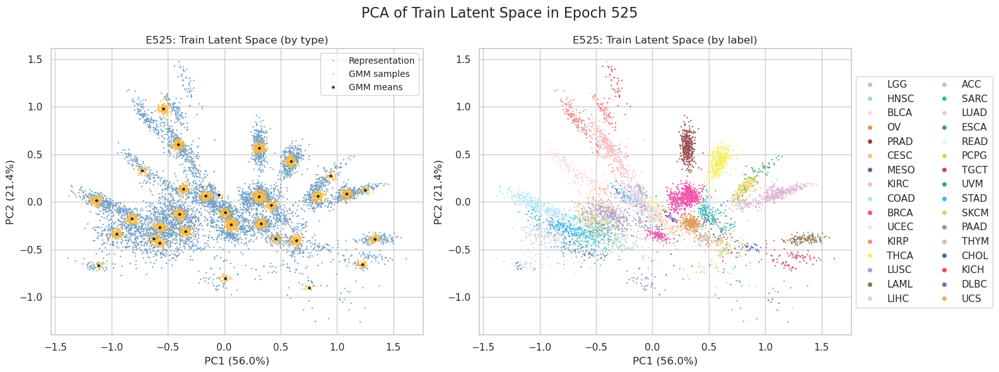

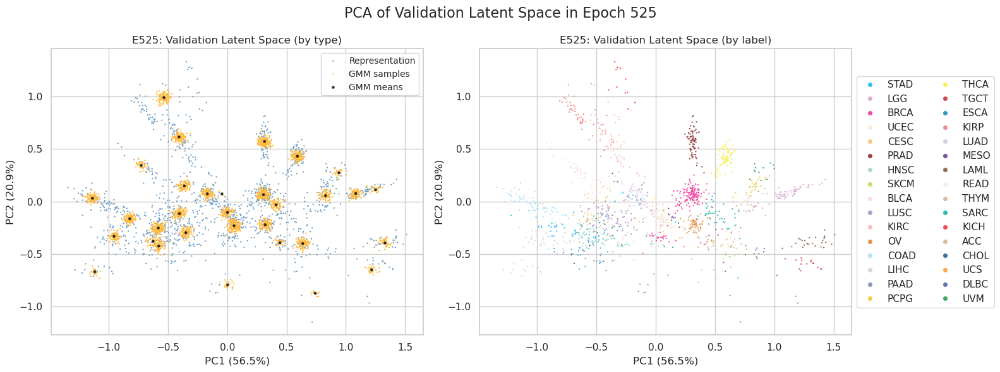

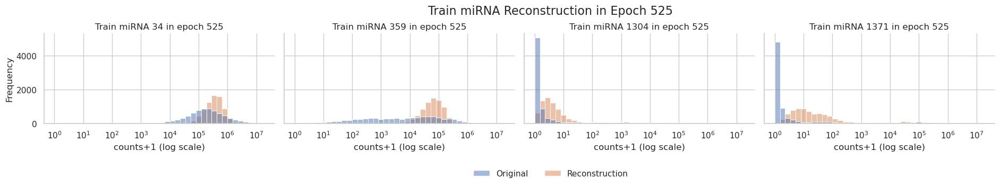

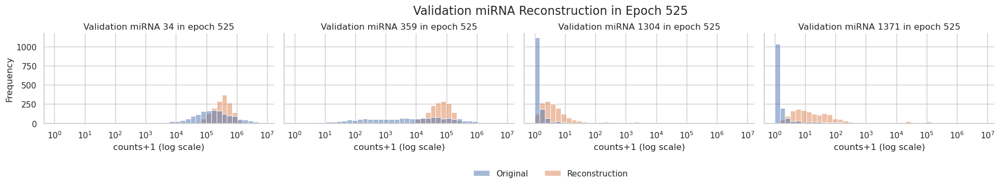

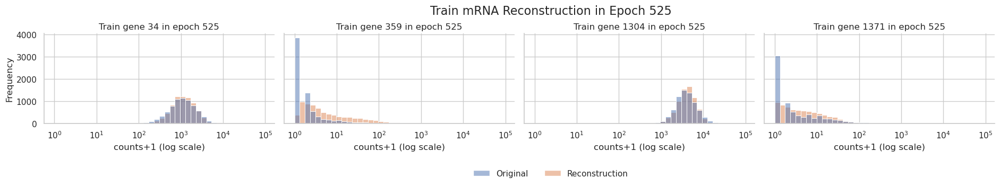

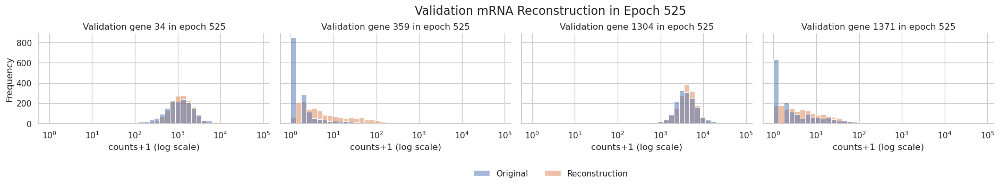

 35%|█████████████████████████████████████████████████████████████████████████████▌                                                                                                                                             | 531/1500 [39:54<1:23:14,  5.15s/it]

530 train_loss: 10.432690981567523 train_loss_decoder: 8.41296675595511 train_recon_mirna: 1.9297555201164573 train_recon_mrna: 6.4832112358386516 train_gmm: 2.0197242256124137 train_mse: 532000128.0 train_mae: 3782.134765625 train_r2: 0.35198962688446045 train_spearman: 0.3389315903186798 train_pearson: 0.8970199227333069 train_msle: 6.763439178466797
530 test_loss: 10.493911374118523 test_loss_decoder: 8.474012349849628 test_recon_mirna: 1.9727364499135978 test_recon_mrna: 6.501275899936031 test_gmm: 2.0198990242688954 test_mse: 459232736.0 test_mae: 3554.888427734375 test_r2: 0.35578376054763794 test_spearman: 0.32291072607040405 test_pearson: 0.8762342929840088 test_msle: 7.040494441986084


 36%|██████████████████████████████████████████████████████████████████████████████▎                                                                                                                                            | 536/1500 [40:16<1:14:35,  4.64s/it]

535 train_loss: 10.428930230358922 train_loss_decoder: 8.408881782278588 train_recon_mirna: 1.92823009390735 train_recon_mrna: 6.480651688371238 train_gmm: 2.0200484480803347 train_mse: 535240768.0 train_mae: 3788.96923828125 train_r2: 0.348042368888855 train_spearman: 0.3395616412162781 train_pearson: 0.8981908559799194 train_msle: 6.077066421508789
535 test_loss: 10.49272451303198 test_loss_decoder: 8.472276850222089 test_recon_mirna: 1.9736775765921708 test_recon_mrna: 6.498599273629918 test_gmm: 2.0204476628098904 test_mse: 458115648.0 test_mae: 3532.437255859375 test_r2: 0.35735082626342773 test_spearman: 0.3243086040019989 test_pearson: 0.87621009349823 test_msle: 6.36808967590332


 36%|██████████████████████████████████████████████████████████████████████████████▉                                                                                                                                            | 541/1500 [40:39<1:14:12,  4.64s/it]

540 train_loss: 10.424939792334053 train_loss_decoder: 8.404951494064143 train_recon_mirna: 1.9267888670801063 train_recon_mrna: 6.478162626984037 train_gmm: 2.0199882982699093 train_mse: 524131872.0 train_mae: 3746.633544921875 train_r2: 0.3615736961364746 train_spearman: 0.34080469608306885 train_pearson: 0.8958919644355774 train_msle: 6.992343425750732
540 test_loss: 10.493088803877335 test_loss_decoder: 8.472115304147668 test_recon_mirna: 1.9758644087337878 test_recon_mrna: 6.49625089541388 test_gmm: 2.0209734997296676 test_mse: 454090432.0 test_mae: 3526.769775390625 test_r2: 0.3629974126815796 test_spearman: 0.32539284229278564 test_pearson: 0.8715400099754333 test_msle: 7.2936692237854


 36%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                                           | 546/1500 [40:59<1:03:10,  3.97s/it]

545 train_loss: 10.421007355176181 train_loss_decoder: 8.40115182698199 train_recon_mirna: 1.925402430529036 train_recon_mrna: 6.4757493964529536 train_gmm: 2.0198555281941926 train_mse: 526107264.0 train_mae: 3748.60595703125 train_r2: 0.35916751623153687 train_spearman: 0.34186282753944397 train_pearson: 0.8963493704795837 train_msle: 6.509387493133545
545 test_loss: 10.491014371478723 test_loss_decoder: 8.469513845278687 test_recon_mirna: 1.9755481789438636 test_recon_mrna: 6.493965666334823 test_gmm: 2.021500526200035 test_mse: 457903264.0 test_mae: 3538.37939453125 test_r2: 0.35764873027801514 test_spearman: 0.3261330723762512 test_pearson: 0.8759046792984009 test_msle: 6.724958419799805


 37%|████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                          | 551/1500 [41:20<1:05:08,  4.12s/it]

550 train_loss: 10.417352483738554 train_loss_decoder: 8.397640396882073 train_recon_mirna: 1.9241822645069007 train_recon_mrna: 6.473458132375173 train_gmm: 2.0197120868564817 train_mse: 527218656.0 train_mae: 3749.013427734375 train_r2: 0.3578137755393982 train_spearman: 0.342629075050354 train_pearson: 0.896881103515625 train_msle: 6.01874303817749
550 test_loss: 10.492251364984094 test_loss_decoder: 8.470020264234497 test_recon_mirna: 1.9779855509951876 test_recon_mrna: 6.49203471323931 test_gmm: 2.022231100749597 test_mse: 452427360.0 test_mae: 3509.05810546875 test_r2: 0.36533039808273315 test_spearman: 0.3278307318687439 test_pearson: 0.8747590184211731 test_msle: 6.31512975692749


 37%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                         | 556/1500 [41:40<1:02:10,  3.95s/it]

555 train_loss: 10.41361393559189 train_loss_decoder: 8.394217446818343 train_recon_mirna: 1.9230205054956806 train_recon_mrna: 6.471196941322662 train_gmm: 2.019396488773547 train_mse: 518013536.0 train_mae: 3715.04833984375 train_r2: 0.36902618408203125 train_spearman: 0.34247854351997375 train_pearson: 0.8952977657318115 train_msle: 7.096100807189941
555 test_loss: 10.491004323868571 test_loss_decoder: 8.469118731510871 test_recon_mirna: 1.97896715612589 test_recon_mrna: 6.4901515753849806 test_gmm: 2.0218855923577 test_mse: 445317728.0 test_mae: 3482.721435546875 test_r2: 0.37530386447906494 test_spearman: 0.3264288902282715 test_pearson: 0.8718013167381287 test_msle: 7.370944499969482


 37%|█████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                         | 561/1500 [42:03<1:11:01,  4.54s/it]

560 train_loss: 10.410168497884174 train_loss_decoder: 8.390618947865736 train_recon_mirna: 1.9218235598575475 train_recon_mrna: 6.468795388008188 train_gmm: 2.019549550018438 train_mse: 515827776.0 train_mae: 3702.29345703125 train_r2: 0.3716886043548584 train_spearman: 0.3438888192176819 train_pearson: 0.8959318995475769 train_msle: 6.572476387023926
560 test_loss: 10.490525196394266 test_loss_decoder: 8.467281239450164 test_recon_mirna: 1.9804165584271456 test_recon_mrna: 6.486864681023019 test_gmm: 2.023243956944102 test_mse: 446050528.0 test_mae: 3477.753662109375 test_r2: 0.3742758631706238 test_spearman: 0.32983845472335815 test_pearson: 0.8726546764373779 test_msle: 6.855710029602051


 38%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                        | 566/1500 [42:25<1:06:03,  4.24s/it]

565 train_loss: 10.407826379389924 train_loss_decoder: 8.388208945839292 train_recon_mirna: 1.9206918149829932 train_recon_mrna: 6.467517130856298 train_gmm: 2.0196174335506325 train_mse: 515202016.0 train_mae: 3696.673828125 train_r2: 0.3724508285522461 train_spearman: 0.34440723061561584 train_pearson: 0.8967057466506958 train_msle: 6.198858737945557
565 test_loss: 10.492886711043472 test_loss_decoder: 8.46738113220002 test_recon_mirna: 1.9825118533632053 test_recon_mrna: 6.484869278836815 test_gmm: 2.025505578843453 test_mse: 446033920.0 test_mae: 3473.236083984375 test_r2: 0.37429916858673096 test_spearman: 0.32754939794540405 test_pearson: 0.8708680868148804 test_msle: 6.513884544372559


 38%|███████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                       | 571/1500 [42:48<1:10:17,  4.54s/it]

570 train_loss: 10.403855736380818 train_loss_decoder: 8.383923945401232 train_recon_mirna: 1.9195178726279298 train_recon_mrna: 6.464406072773303 train_gmm: 2.019931790979586 train_mse: 520497632.0 train_mae: 3712.801513671875 train_r2: 0.3660004138946533 train_spearman: 0.34378600120544434 train_pearson: 0.8973261117935181 train_msle: 5.818294525146484
570 test_loss: 10.496113603426066 test_loss_decoder: 8.469519677563065 test_recon_mirna: 1.985623849970251 test_recon_mrna: 6.483895827592814 test_gmm: 2.0265939258630006 test_mse: 448899680.0 test_mae: 3477.475830078125 test_r2: 0.3702790141105652 test_spearman: 0.32953304052352905 test_pearson: 0.8724001049995422 test_msle: 6.154530048370361


 38%|████████████████████████████████████████████████████████████████████████████████████                                                                                                                                       | 576/1500 [43:09<1:05:16,  4.24s/it]

575 train_loss: 10.400270969240495 train_loss_decoder: 8.38023369502208 train_recon_mirna: 1.918352453165857 train_recon_mrna: 6.461881241856223 train_gmm: 2.0200372742184163 train_mse: 514790208.0 train_mae: 3689.401611328125 train_r2: 0.3729524612426758 train_spearman: 0.34537196159362793 train_pearson: 0.8958810567855835 train_msle: 6.17616605758667
575 test_loss: 10.495990992653923 test_loss_decoder: 8.469244294118146 test_recon_mirna: 1.988460362209685 test_recon_mrna: 6.480783931908461 test_gmm: 2.026746698535775 test_mse: 444617984.0 test_mae: 3463.024658203125 test_r2: 0.3762854337692261 test_spearman: 0.3303142488002777 test_pearson: 0.8729203939437866 test_msle: 6.4403204917907715


 39%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                      | 581/1500 [43:31<1:05:48,  4.30s/it]

580 train_loss: 10.397150619853763 train_loss_decoder: 8.376881442563429 train_recon_mirna: 1.917321831726592 train_recon_mrna: 6.459559610836836 train_gmm: 2.0202691772903343 train_mse: 508412928.0 train_mae: 3661.46240234375 train_r2: 0.3807203769683838 train_spearman: 0.34698137640953064 train_pearson: 0.8949867486953735 train_msle: 6.465729713439941
580 test_loss: 10.496776044824284 test_loss_decoder: 8.468244223482838 test_recon_mirna: 1.9905739617006921 test_recon_mrna: 6.477670261782146 test_gmm: 2.0285318213414465 test_mse: 438529184.0 test_mae: 3438.6669921875 test_r2: 0.3848268389701843 test_spearman: 0.33381199836730957 test_pearson: 0.871414303779602 test_msle: 6.74381685256958


 39%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                     | 586/1500 [43:54<1:06:37,  4.37s/it]

585 train_loss: 10.39447329389166 train_loss_decoder: 8.373573928400349 train_recon_mirna: 1.9161595114005074 train_recon_mrna: 6.457414416999841 train_gmm: 2.0208993654913114 train_mse: 513388096.0 train_mae: 3678.497802734375 train_r2: 0.37466031312942505 train_spearman: 0.34723272919654846 train_pearson: 0.8957973122596741 train_msle: 5.78456449508667
585 test_loss: 10.496840938525413 test_loss_decoder: 8.466620433546405 test_recon_mirna: 1.9909114066793607 test_recon_mrna: 6.475709026867044 test_gmm: 2.0302205049790083 test_mse: 443499744.0 test_mae: 3451.614501953125 test_r2: 0.3778541088104248 test_spearman: 0.33166128396987915 test_pearson: 0.8710416555404663 test_msle: 6.099807262420654


 39%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                    | 591/1500 [44:16<1:09:29,  4.59s/it]

590 train_loss: 10.391268613655662 train_loss_decoder: 8.369904366843784 train_recon_mirna: 1.9150251353541186 train_recon_mrna: 6.454879231489665 train_gmm: 2.0213642468118787 train_mse: 507985120.0 train_mae: 3657.07958984375 train_r2: 0.38124144077301025 train_spearman: 0.34811344742774963 train_pearson: 0.8945376873016357 train_msle: 6.301004409790039
590 test_loss: 10.49841688142587 test_loss_decoder: 8.466017160937518 test_recon_mirna: 1.9918827701624817 test_recon_mrna: 6.474134390775036 test_gmm: 2.032399720488351 test_mse: 440274944.0 test_mae: 3442.052001953125 test_r2: 0.3823779225349426 test_spearman: 0.33392447233200073 test_pearson: 0.8704480528831482 test_msle: 6.6336588859558105


 40%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                                    | 596/1500 [44:38<1:05:48,  4.37s/it]

595 train_loss: 10.388711207421636 train_loss_decoder: 8.367195159905894 train_recon_mirna: 1.9142073497690817 train_recon_mrna: 6.452987810136811 train_gmm: 2.0215160475157417 train_mse: 496967616.0 train_mae: 3609.785888671875 train_r2: 0.39466148614883423 train_spearman: 0.34949925541877747 train_pearson: 0.8934679627418518 train_msle: 6.413246154785156
595 test_loss: 10.498877354486597 test_loss_decoder: 8.464522795608863 test_recon_mirna: 1.992579160317273 test_recon_mrna: 6.4719436352915904 test_gmm: 2.0343545588777343 test_mse: 429741312.0 test_mae: 3392.93408203125 test_r2: 0.3971545696258545 test_spearman: 0.335452675819397 test_pearson: 0.869240939617157 test_msle: 6.740361213684082


 40%|███████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                   | 600/1500 [44:55<1:02:31,  4.17s/it]

600 train_loss: 10.385885316008455 train_loss_decoder: 8.3636270728252 train_recon_mirna: 1.9131543630329446 train_recon_mrna: 6.450472709792256 train_gmm: 2.022258243183256 train_mse: 495680224.0 train_mae: 3603.452880859375 train_r2: 0.39622962474823 train_spearman: 0.35005906224250793 train_pearson: 0.8936663269996643 train_msle: 6.4055376052856445
600 test_loss: 10.495949553501797 test_loss_decoder: 8.461662959234943 test_recon_mirna: 1.9928347510142332 test_recon_mrna: 6.46882820822071 test_gmm: 2.034286594266854 test_mse: 429625472.0 test_mae: 3391.057861328125 test_r2: 0.397317111492157 test_spearman: 0.3365243971347809 test_pearson: 0.8684508204460144 test_msle: 6.741197109222412


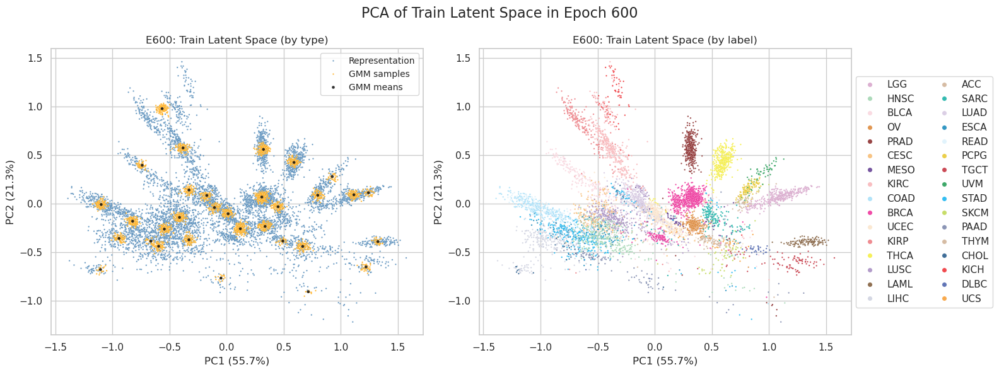

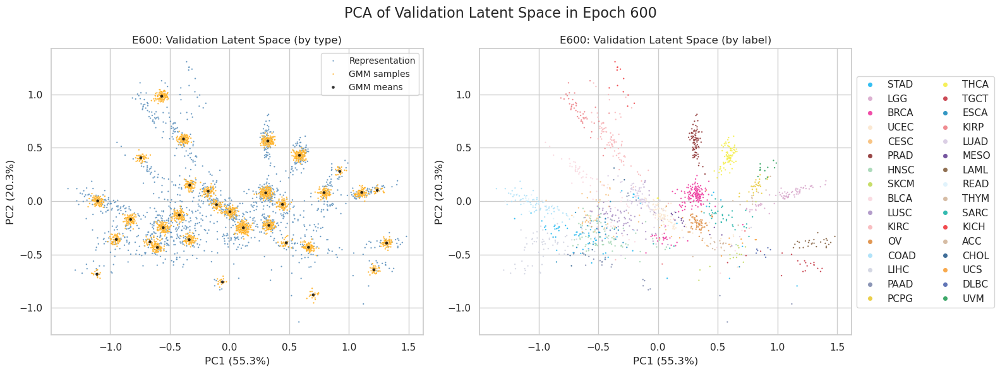

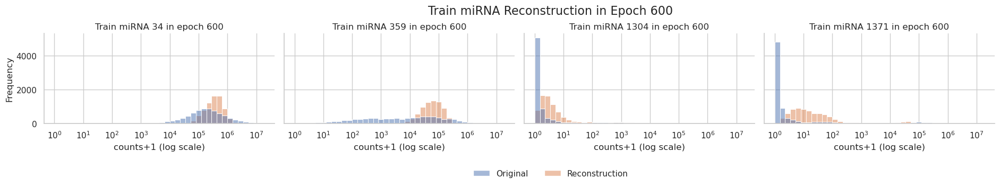

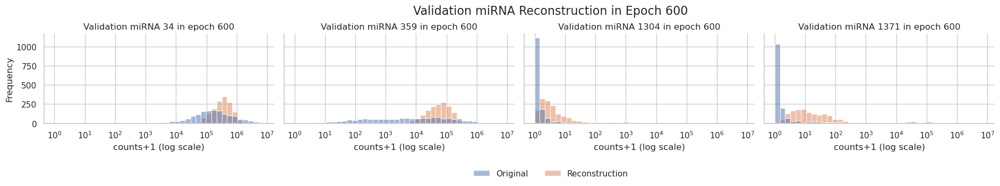

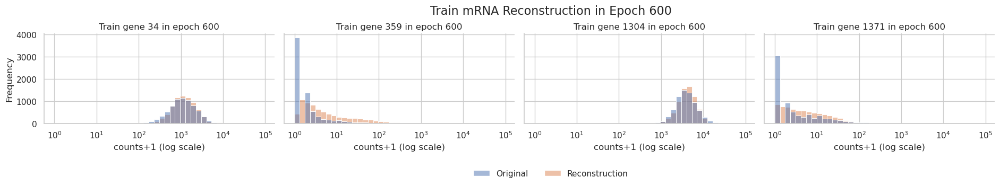

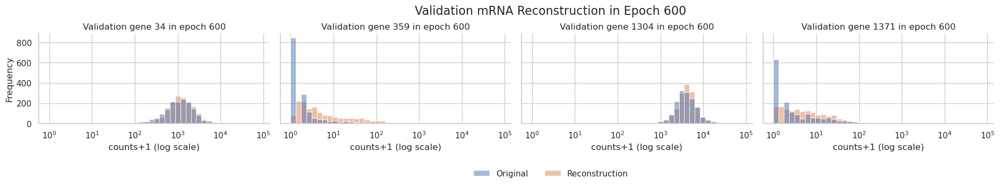

 40%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                  | 606/1500 [45:40<1:23:54,  5.63s/it]

605 train_loss: 10.38325306028168 train_loss_decoder: 8.360327086405952 train_recon_mirna: 1.9121817407669077 train_recon_mrna: 6.448145345639045 train_gmm: 2.022925973875728 train_mse: 499516128.0 train_mae: 3613.5146484375 train_r2: 0.3915572762489319 train_spearman: 0.3510315716266632 train_pearson: 0.8939584493637085 train_msle: 5.838873386383057
605 test_loss: 10.496069126373982 test_loss_decoder: 8.459931601805149 test_recon_mirna: 1.9934901317568063 test_recon_mrna: 6.466441470048342 test_gmm: 2.036137524568833 test_mse: 432369440.0 test_mae: 3395.5078125 test_r2: 0.39346784353256226 test_spearman: 0.3360731601715088 test_pearson: 0.8705676794052124 test_msle: 6.195052623748779


 41%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                 | 611/1500 [46:03<1:10:12,  4.74s/it]

610 train_loss: 10.380894843601732 train_loss_decoder: 8.357515903937239 train_recon_mirna: 1.911361908998856 train_recon_mrna: 6.446153994938383 train_gmm: 2.0233789396644934 train_mse: 491672128.0 train_mae: 3582.041748046875 train_r2: 0.4011117219924927 train_spearman: 0.35053351521492004 train_pearson: 0.8928108811378479 train_msle: 6.376882553100586
610 test_loss: 10.495262636429576 test_loss_decoder: 8.458050352405929 test_recon_mirna: 1.9923197336885647 test_recon_mrna: 6.465730618717364 test_gmm: 2.037212284023647 test_mse: 425324448.0 test_mae: 3367.34619140625 test_r2: 0.4033505916595459 test_spearman: 0.3351598083972931 test_pearson: 0.8686134219169617 test_msle: 6.6935930252075195


 41%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                 | 616/1500 [46:26<1:07:47,  4.60s/it]

615 train_loss: 10.378237826112104 train_loss_decoder: 8.353908015992186 train_recon_mirna: 1.910121874609595 train_recon_mrna: 6.443786141382591 train_gmm: 2.024329810119918 train_mse: 493883808.0 train_mae: 3586.5302734375 train_r2: 0.39841777086257935 train_spearman: 0.3511941432952881 train_pearson: 0.8939473032951355 train_msle: 5.849360466003418
615 test_loss: 10.491146188300883 test_loss_decoder: 8.453662150998323 test_recon_mirna: 1.9894237612914771 test_recon_mrna: 6.464238389706846 test_gmm: 2.0374840373025602 test_mse: 428226240.0 test_mae: 3367.21484375 test_r2: 0.39927995204925537 test_spearman: 0.33779722452163696 test_pearson: 0.868607759475708 test_msle: 6.178230285644531


 41%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                | 621/1500 [46:49<1:08:28,  4.67s/it]

620 train_loss: 10.377204602400505 train_loss_decoder: 8.351428642567798 train_recon_mirna: 1.9090886101615177 train_recon_mrna: 6.44234003240628 train_gmm: 2.0257759598327074 train_mse: 495708832.0 train_mae: 3590.678955078125 train_r2: 0.3961947560310364 train_spearman: 0.3524697721004486 train_pearson: 0.8935321569442749 train_msle: 5.325498580932617
620 test_loss: 10.487676158576889 test_loss_decoder: 8.44851030905244 test_recon_mirna: 1.9877323086382321 test_recon_mrna: 6.460778000414207 test_gmm: 2.0391658495244496 test_mse: 431923584.0 test_mae: 3386.90625 test_r2: 0.3940933346748352 test_spearman: 0.33817464113235474 test_pearson: 0.8693944215774536 test_msle: 5.7091965675354


 42%|███████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                               | 626/1500 [47:11<1:03:59,  4.39s/it]

625 train_loss: 10.374454894601886 train_loss_decoder: 8.347649230781858 train_recon_mirna: 1.9080564100998587 train_recon_mrna: 6.439592820682 train_gmm: 2.026805663820027 train_mse: 493586688.0 train_mae: 3582.081298828125 train_r2: 0.3987796902656555 train_spearman: 0.3543785512447357 train_pearson: 0.8935908675193787 train_msle: 5.667403221130371
625 test_loss: 10.481771719008007 test_loss_decoder: 8.442170249906082 test_recon_mirna: 1.9839465545795625 test_recon_mrna: 6.45822369532652 test_gmm: 2.0396014691019246 test_mse: 427674304.0 test_mae: 3367.114013671875 test_r2: 0.4000542163848877 test_spearman: 0.33997824788093567 test_pearson: 0.8693711161613464 test_msle: 6.067466735839844


 42%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                              | 631/1500 [47:34<1:06:43,  4.61s/it]

630 train_loss: 10.372173546278376 train_loss_decoder: 8.344204239526128 train_recon_mirna: 1.9072937191896382 train_recon_mrna: 6.43691052033649 train_gmm: 2.0279693067522477 train_mse: 491133888.0 train_mae: 3569.337158203125 train_r2: 0.401767373085022 train_spearman: 0.35557079315185547 train_pearson: 0.8931463956832886 train_msle: 5.344696998596191
630 test_loss: 10.477664948035418 test_loss_decoder: 8.438161144608623 test_recon_mirna: 1.9811220483124001 test_recon_mrna: 6.457039096296223 test_gmm: 2.0395038034267947 test_mse: 419628800.0 test_mae: 3320.189208984375 test_r2: 0.41134053468704224 test_spearman: 0.34126266837120056 test_pearson: 0.8687855005264282 test_msle: 5.692046165466309


 42%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                              | 636/1500 [47:57<1:08:17,  4.74s/it]

635 train_loss: 10.369885850185351 train_loss_decoder: 8.3409921430631 train_recon_mirna: 1.9061739275104173 train_recon_mrna: 6.434818215552684 train_gmm: 2.0288937071222497 train_mse: 490957024.0 train_mae: 3567.763671875 train_r2: 0.40198278427124023 train_spearman: 0.3562326729297638 train_pearson: 0.8937965631484985 train_msle: 5.61859655380249
635 test_loss: 10.474054781615767 test_loss_decoder: 8.433562845102012 test_recon_mirna: 1.9789815042831078 test_recon_mrna: 6.454581340818904 test_gmm: 2.0404919365137544 test_mse: 425078080.0 test_mae: 3343.801025390625 test_r2: 0.4036962389945984 test_spearman: 0.34661269187927246 test_pearson: 0.8671525120735168 test_msle: 5.970798492431641


 43%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                             | 641/1500 [48:21<1:05:00,  4.54s/it]

640 train_loss: 10.367276277638002 train_loss_decoder: 8.337901204215449 train_recon_mirna: 1.9051165031182302 train_recon_mrna: 6.432784701097218 train_gmm: 2.0293750734225533 train_mse: 483921920.0 train_mae: 3541.233154296875 train_r2: 0.4105519652366638 train_spearman: 0.3560120463371277 train_pearson: 0.8922713994979858 train_msle: 6.43695068359375
640 test_loss: 10.468893512020564 test_loss_decoder: 8.428965077725506 test_recon_mirna: 1.9736742622091068 test_recon_mrna: 6.455290815516399 test_gmm: 2.039928434295059 test_mse: 420180992.0 test_mae: 3328.052734375 test_r2: 0.41056591272354126 test_spearman: 0.3458072543144226 test_pearson: 0.8646788001060486 test_msle: 6.817008972167969


 43%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                            | 646/1500 [48:43<1:05:26,  4.60s/it]

645 train_loss: 10.364606975580577 train_loss_decoder: 8.33458154391807 train_recon_mirna: 1.9040090734136075 train_recon_mrna: 6.430572470504463 train_gmm: 2.0300254316625073 train_mse: 482127360.0 train_mae: 3528.740234375 train_r2: 0.4127379059791565 train_spearman: 0.3576816916465759 train_pearson: 0.8917953968048096 train_msle: 5.946111679077148
645 test_loss: 10.462704149601967 test_loss_decoder: 8.421712514037567 test_recon_mirna: 1.9703967624406022 test_recon_mrna: 6.451315751596965 test_gmm: 2.0409916355643998 test_mse: 420919328.0 test_mae: 3328.83740234375 test_r2: 0.4095301628112793 test_spearman: 0.3475213050842285 test_pearson: 0.86769700050354 test_msle: 6.2529425621032715


 43%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                            | 651/1500 [49:06<1:04:49,  4.58s/it]

650 train_loss: 10.3622461748142 train_loss_decoder: 8.331697534929143 train_recon_mirna: 1.9031264758021011 train_recon_mrna: 6.428571059127042 train_gmm: 2.0305486398850574 train_mse: 483136000.0 train_mae: 3527.98583984375 train_r2: 0.41150927543640137 train_spearman: 0.3589784502983093 train_pearson: 0.8917191028594971 train_msle: 5.206554412841797
650 test_loss: 10.455873947740695 test_loss_decoder: 8.415677732610897 test_recon_mirna: 1.9664629434556073 test_recon_mrna: 6.449214789155289 test_gmm: 2.040196215129798 test_mse: 415611680.0 test_mae: 3292.403076171875 test_r2: 0.41697579622268677 test_spearman: 0.34943854808807373 test_pearson: 0.8680115342140198 test_msle: 5.512478351593018


 44%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                           | 656/1500 [49:30<1:07:48,  4.82s/it]

655 train_loss: 10.359046063417969 train_loss_decoder: 8.328178295977636 train_recon_mirna: 1.901867283129867 train_recon_mrna: 6.42631101284777 train_gmm: 2.0308677674403324 train_mse: 480712672.0 train_mae: 3516.99462890625 train_r2: 0.41446107625961304 train_spearman: 0.35968244075775146 train_pearson: 0.889946699142456 train_msle: 5.495086669921875
655 test_loss: 10.452145767749805 test_loss_decoder: 8.410999327901102 test_recon_mirna: 1.9640814607180912 test_recon_mrna: 6.446917867183011 test_gmm: 2.0411464398487027 test_mse: 422576288.0 test_mae: 3323.635498046875 test_r2: 0.4072057604789734 test_spearman: 0.34955793619155884 test_pearson: 0.8632808923721313 test_msle: 5.756893634796143


 44%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                          | 661/1500 [49:54<1:06:44,  4.77s/it]

660 train_loss: 10.357030545523884 train_loss_decoder: 8.326078722978725 train_recon_mirna: 1.9011998064473357 train_recon_mrna: 6.42487891653139 train_gmm: 2.030951822545158 train_mse: 472362016.0 train_mae: 3481.659912109375 train_r2: 0.424632728099823 train_spearman: 0.35908323526382446 train_pearson: 0.8893068432807922 train_msle: 5.847702980041504
660 test_loss: 10.453061121001081 test_loss_decoder: 8.412298400012544 test_recon_mirna: 1.962639544405086 test_recon_mrna: 6.449658855607457 test_gmm: 2.0407627209885377 test_mse: 412467488.0 test_mae: 3283.04931640625 test_r2: 0.4213865399360657 test_spearman: 0.3505386412143707 test_pearson: 0.8637917041778564 test_msle: 6.067444801330566


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                         | 666/1500 [50:17<1:03:05,  4.54s/it]

665 train_loss: 10.354434412075431 train_loss_decoder: 8.323195682182151 train_recon_mirna: 1.900511879368103 train_recon_mrna: 6.422683802814047 train_gmm: 2.0312387298932806 train_mse: 483226656.0 train_mae: 3524.51220703125 train_r2: 0.41139888763427734 train_spearman: 0.36169686913490295 train_pearson: 0.8896046876907349 train_msle: 5.283993721008301
665 test_loss: 10.44464923406007 test_loss_decoder: 8.404142859239602 test_recon_mirna: 1.9596610893581616 test_recon_mrna: 6.444481769881441 test_gmm: 2.0405063748204664 test_mse: 416038560.0 test_mae: 3289.41796875 test_r2: 0.4163769483566284 test_spearman: 0.3503651022911072 test_pearson: 0.8650494813919067 test_msle: 5.5993123054504395


 45%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                         | 671/1500 [50:41<1:06:17,  4.80s/it]

670 train_loss: 10.351095186795984 train_loss_decoder: 8.319724864842085 train_recon_mirna: 1.8992874813574057 train_recon_mrna: 6.420437383484679 train_gmm: 2.031370321953898 train_mse: 473356672.0 train_mae: 3479.9384765625 train_r2: 0.42342114448547363 train_spearman: 0.36172521114349365 train_pearson: 0.8891849517822266 train_msle: 5.274491310119629
670 test_loss: 10.441004414420117 test_loss_decoder: 8.398892539677274 test_recon_mirna: 1.9567393085362075 test_recon_mrna: 6.4421532311410665 test_gmm: 2.042111874742843 test_mse: 413899424.0 test_mae: 3272.55126953125 test_r2: 0.41937774419784546 test_spearman: 0.35002052783966064 test_pearson: 0.8620505928993225 test_msle: 5.559966564178467


 45%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                        | 675/1500 [50:58<1:03:02,  4.59s/it]

675 train_loss: 10.348377240231216 train_loss_decoder: 8.317297495157893 train_recon_mirna: 1.8986932431498678 train_recon_mrna: 6.418604252008026 train_gmm: 2.0310797450733213 train_mse: 470326080.0 train_mae: 3466.266845703125 train_r2: 0.4271126389503479 train_spearman: 0.3624780476093292 train_pearson: 0.8885597586631775 train_msle: 5.530627727508545
675 test_loss: 10.435792568461462 test_loss_decoder: 8.39526661169372 test_recon_mirna: 1.95519093919586 test_recon_mrna: 6.440075672497859 test_gmm: 2.0405259567677434 test_mse: 409812448.0 test_mae: 3259.07470703125 test_r2: 0.42511099576950073 test_spearman: 0.3524177372455597 test_pearson: 0.8617546558380127 test_msle: 5.873713493347168


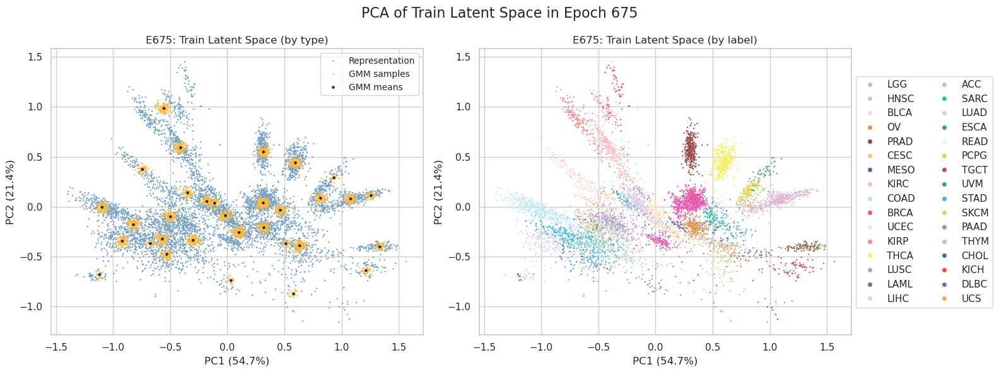

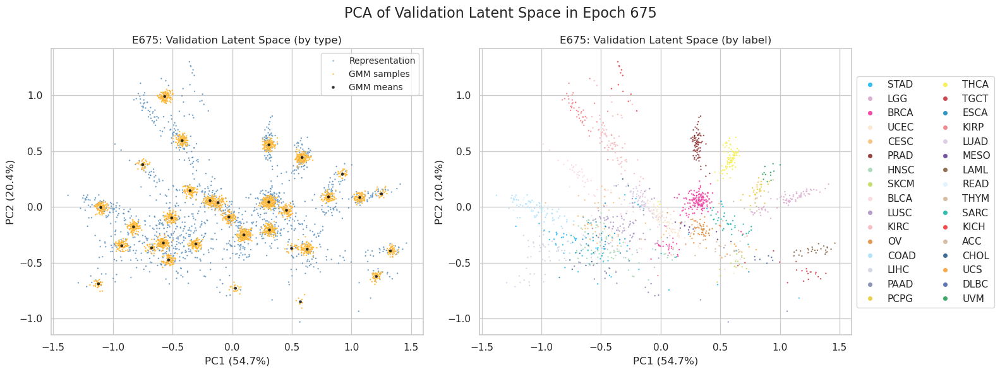

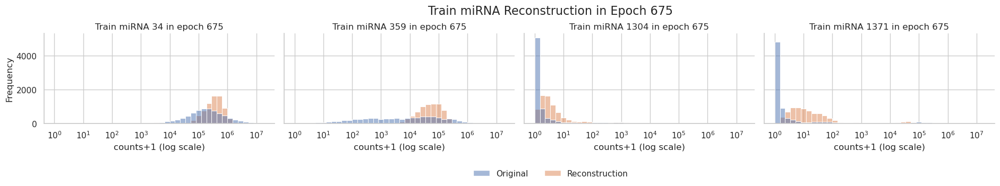

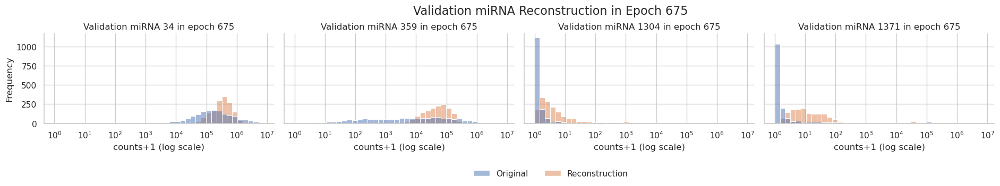

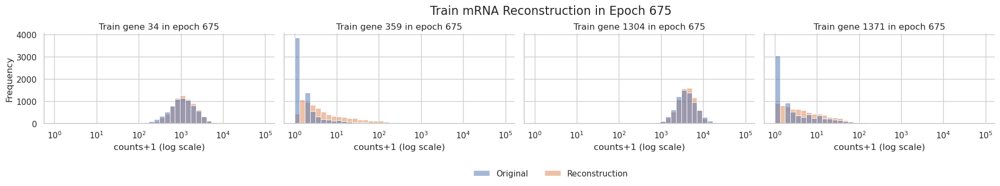

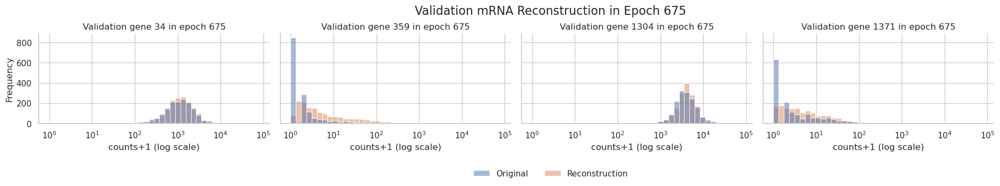

 45%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                       | 681/1500 [51:44<1:15:27,  5.53s/it]

680 train_loss: 10.346057754677314 train_loss_decoder: 8.314807152429458 train_recon_mirna: 1.8977077992847675 train_recon_mrna: 6.41709935314469 train_gmm: 2.0312506022478565 train_mse: 467492832.0 train_mae: 3451.503662109375 train_r2: 0.43056368827819824 train_spearman: 0.3628147542476654 train_pearson: 0.8882445096969604 train_msle: 5.070740699768066
680 test_loss: 10.430536865714709 test_loss_decoder: 8.390288460168875 test_recon_mirna: 1.951820139779389 test_recon_mrna: 6.438468320389486 test_gmm: 2.040248405545834 test_mse: 409740320.0 test_mae: 3247.097900390625 test_r2: 0.42521220445632935 test_spearman: 0.3530057370662689 test_pearson: 0.8593813180923462 test_msle: 5.341693878173828


 46%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                      | 686/1500 [52:06<1:02:52,  4.63s/it]

685 train_loss: 10.343215886012429 train_loss_decoder: 8.312315363222579 train_recon_mirna: 1.8970679764724443 train_recon_mrna: 6.415247386750134 train_gmm: 2.03090052278985 train_mse: 471465600.0 train_mae: 3467.206298828125 train_r2: 0.4257246255874634 train_spearman: 0.36557504534721375 train_pearson: 0.8880594968795776 train_msle: 5.1291961669921875
685 test_loss: 10.427289729998677 test_loss_decoder: 8.386672037450616 test_recon_mirna: 1.9501152341503811 test_recon_mrna: 6.436556803300235 test_gmm: 2.04061769254806 test_mse: 406849024.0 test_mae: 3230.7880859375 test_r2: 0.42926812171936035 test_spearman: 0.3546757698059082 test_pearson: 0.8613864779472351 test_msle: 5.410120487213135


 46%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 691/1500 [52:30<1:03:04,  4.68s/it]

690 train_loss: 10.340385778413632 train_loss_decoder: 8.309397486214058 train_recon_mirna: 1.8963382214147233 train_recon_mrna: 6.413059264799335 train_gmm: 2.030988292199574 train_mse: 464715744.0 train_mae: 3438.423095703125 train_r2: 0.4339463710784912 train_spearman: 0.36567825078964233 train_pearson: 0.8877552151679993 train_msle: 4.815606117248535
690 test_loss: 10.4240728178254 test_loss_decoder: 8.383435076290079 test_recon_mirna: 1.9487101079599565 test_recon_mrna: 6.434724968330122 test_gmm: 2.0406377415353205 test_mse: 399385760.0 test_mae: 3196.892822265625 test_r2: 0.4397376775741577 test_spearman: 0.3541049659252167 test_pearson: 0.8590599894523621 test_msle: 5.08149528503418


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 696/1500 [52:52<1:01:18,  4.58s/it]

695 train_loss: 10.337392776905517 train_loss_decoder: 8.306778393525986 train_recon_mirna: 1.895717361306218 train_recon_mrna: 6.411061032219769 train_gmm: 2.03061438337953 train_mse: 461144832.0 train_mae: 3424.206787109375 train_r2: 0.43829596042633057 train_spearman: 0.3662877678871155 train_pearson: 0.8882772326469421 train_msle: 5.222236633300781
695 test_loss: 10.419538207540887 test_loss_decoder: 8.37869976183527 test_recon_mirna: 1.9454898077296676 test_recon_mrna: 6.433209954105602 test_gmm: 2.0408384457056172 test_mse: 407367712.0 test_mae: 3234.783447265625 test_r2: 0.4285404682159424 test_spearman: 0.3574455678462982 test_pearson: 0.859521210193634 test_msle: 5.438352584838867


 47%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                    | 701/1500 [53:15<1:00:07,  4.52s/it]

700 train_loss: 10.334889850321321 train_loss_decoder: 8.304551905726916 train_recon_mirna: 1.895188109720571 train_recon_mrna: 6.409363796006344 train_gmm: 2.030337944594405 train_mse: 462794848.0 train_mae: 3427.805908203125 train_r2: 0.43628615140914917 train_spearman: 0.3678385317325592 train_pearson: 0.8880277872085571 train_msle: 5.087032794952393
700 test_loss: 10.414764394720873 test_loss_decoder: 8.373954272770408 test_recon_mirna: 1.9433955850663303 test_recon_mrna: 6.430558687704077 test_gmm: 2.0408101219504644 test_mse: 399791808.0 test_mae: 3207.646240234375 test_r2: 0.4391680955886841 test_spearman: 0.3591512441635132 test_pearson: 0.8613405227661133 test_msle: 5.364629745483398


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                     | 706/1500 [53:38<59:58,  4.53s/it]

705 train_loss: 10.332912218440146 train_loss_decoder: 8.30260010945991 train_recon_mirna: 1.8950542208583594 train_recon_mrna: 6.4075458886015495 train_gmm: 2.0303121089802367 train_mse: 459806176.0 train_mae: 3411.864013671875 train_r2: 0.43992650508880615 train_spearman: 0.3675995171070099 train_pearson: 0.8875007629394531 train_msle: 5.1621294021606445
705 test_loss: 10.412902181606224 test_loss_decoder: 8.372699958204217 test_recon_mirna: 1.9435266526818378 test_recon_mrna: 6.429173305522379 test_gmm: 2.040202223402006 test_mse: 399914208.0 test_mae: 3191.08837890625 test_r2: 0.4389963150024414 test_spearman: 0.35876205563545227 test_pearson: 0.8597038984298706 test_msle: 5.423398971557617


 47%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                   | 711/1500 [54:00<1:00:13,  4.58s/it]

710 train_loss: 10.330022402711672 train_loss_decoder: 8.300081788242661 train_recon_mirna: 1.8941964620685383 train_recon_mrna: 6.405885326174122 train_gmm: 2.0299406144690106 train_mse: 461807040.0 train_mae: 3418.22119140625 train_r2: 0.4374893307685852 train_spearman: 0.3679441511631012 train_pearson: 0.8861650228500366 train_msle: 5.084445953369141
710 test_loss: 10.405669520350731 test_loss_decoder: 8.365625640617292 test_recon_mirna: 1.9382039357486054 test_recon_mrna: 6.427421704868687 test_gmm: 2.0400438797334393 test_mse: 400855168.0 test_mae: 3203.28271484375 test_r2: 0.4376763701438904 test_spearman: 0.3578487038612366 test_pearson: 0.8604418039321899 test_msle: 5.307443141937256


 48%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 716/1500 [54:23<59:52,  4.58s/it]

715 train_loss: 10.328714133780345 train_loss_decoder: 8.298835352501827 train_recon_mirna: 1.8943937349872688 train_recon_mrna: 6.404441617514558 train_gmm: 2.0298787812785184 train_mse: 453819840.0 train_mae: 3383.78125 train_r2: 0.44721829891204834 train_spearman: 0.36846742033958435 train_pearson: 0.8864835500717163 train_msle: 5.05731725692749
715 test_loss: 10.402478848162868 test_loss_decoder: 8.362893785483573 test_recon_mirna: 1.9362904133126595 test_recon_mrna: 6.426603372170914 test_gmm: 2.0395850626792957 test_mse: 392725888.0 test_mae: 3166.13134765625 test_r2: 0.449080228805542 test_spearman: 0.3599684536457062 test_pearson: 0.8605595231056213 test_msle: 5.254880905151367


 48%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                 | 721/1500 [54:46<1:00:19,  4.65s/it]

720 train_loss: 10.326175378237073 train_loss_decoder: 8.296309283724941 train_recon_mirna: 1.893853833215417 train_recon_mrna: 6.402455450509524 train_gmm: 2.029866094512131 train_mse: 445486336.0 train_mae: 3345.90234375 train_r2: 0.45736902952194214 train_spearman: 0.3703407943248749 train_pearson: 0.8859743475914001 train_msle: 5.086126327514648
720 test_loss: 10.396723419437116 test_loss_decoder: 8.357160524415045 test_recon_mirna: 1.932829809957686 test_recon_mrna: 6.424330714457359 test_gmm: 2.039562895022071 test_mse: 392297504.0 test_mae: 3160.525390625 test_r2: 0.4496811628341675 test_spearman: 0.36154675483703613 test_pearson: 0.858590841293335 test_msle: 5.230348110198975


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                  | 726/1500 [55:09<57:04,  4.42s/it]

725 train_loss: 10.323931590637782 train_loss_decoder: 8.294225938230156 train_recon_mirna: 1.8935534204053381 train_recon_mrna: 6.400672517824817 train_gmm: 2.029705652407627 train_mse: 441433984.0 train_mae: 3329.731689453125 train_r2: 0.4623050093650818 train_spearman: 0.37195146083831787 train_pearson: 0.8860486149787903 train_msle: 5.018157005310059
725 test_loss: 10.395332950506065 test_loss_decoder: 8.355062935617932 test_recon_mirna: 1.9317577091502265 test_recon_mrna: 6.423305226467705 test_gmm: 2.0402700148881334 test_mse: 390396576.0 test_mae: 3158.10205078125 test_r2: 0.4523477554321289 test_spearman: 0.36260443925857544 test_pearson: 0.8581005334854126 test_msle: 5.153311729431152


 49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 731/1500 [55:31<57:44,  4.51s/it]

730 train_loss: 10.322120222075503 train_loss_decoder: 8.292446179970128 train_recon_mirna: 1.89302828418712 train_recon_mrna: 6.3994178957830075 train_gmm: 2.0296740421053756 train_mse: 449401504.0 train_mae: 3361.8701171875 train_r2: 0.45260006189346313 train_spearman: 0.3724902272224426 train_pearson: 0.8858176469802856 train_msle: 4.994441032409668
730 test_loss: 10.398284711788648 test_loss_decoder: 8.357787501418718 test_recon_mirna: 1.929462350335072 test_recon_mrna: 6.428325151083646 test_gmm: 2.040497210369929 test_mse: 394419808.0 test_mae: 3172.83544921875 test_r2: 0.4467039704322815 test_spearman: 0.3631766736507416 test_pearson: 0.861527681350708 test_msle: 5.171082496643066


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                | 736/1500 [55:54<57:55,  4.55s/it]

735 train_loss: 10.321022851431536 train_loss_decoder: 8.290838138876664 train_recon_mirna: 1.8931736667547108 train_recon_mrna: 6.397664472121953 train_gmm: 2.030184712554872 train_mse: 436822464.0 train_mae: 3310.291259765625 train_r2: 0.4679221510887146 train_spearman: 0.3726348876953125 train_pearson: 0.8856807947158813 train_msle: 5.304352283477783
735 test_loss: 10.387996912256968 test_loss_decoder: 8.348020965386603 test_recon_mirna: 1.9260161105092775 test_recon_mrna: 6.422004854877326 test_gmm: 2.039975946870365 test_mse: 380349536.0 test_mae: 3109.484619140625 test_r2: 0.4664418697357178 test_spearman: 0.36202073097229004 test_pearson: 0.8578909635543823 test_msle: 5.565197467803955


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 741/1500 [56:17<58:13,  4.60s/it]

740 train_loss: 10.31781153949532 train_loss_decoder: 8.288115449779731 train_recon_mirna: 1.892473487461946 train_recon_mrna: 6.395641962317786 train_gmm: 2.0296960897155882 train_mse: 440141216.0 train_mae: 3317.645751953125 train_r2: 0.46387970447540283 train_spearman: 0.37333083152770996 train_pearson: 0.8850878477096558 train_msle: 4.864790439605713
740 test_loss: 10.380649394989868 test_loss_decoder: 8.3416950771256 test_recon_mirna: 1.9231377982996207 test_recon_mrna: 6.418557278825978 test_gmm: 2.038954317864268 test_mse: 387555744.0 test_mae: 3138.036376953125 test_r2: 0.4563329219818115 test_spearman: 0.3622046411037445 test_pearson: 0.8590065240859985 test_msle: 5.022550582885742


 50%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                               | 746/1500 [56:40<57:15,  4.56s/it]

745 train_loss: 10.316393470838843 train_loss_decoder: 8.286224399287196 train_recon_mirna: 1.8922358999492328 train_recon_mrna: 6.393988499337962 train_gmm: 2.030169071551648 train_mse: 439945792.0 train_mae: 3319.429931640625 train_r2: 0.46411776542663574 train_spearman: 0.3732791543006897 train_pearson: 0.8849108815193176 train_msle: 4.975656032562256
745 test_loss: 10.37775676831948 test_loss_decoder: 8.338912707607676 test_recon_mirna: 1.920842212042183 test_recon_mrna: 6.418070495565493 test_gmm: 2.038844060711805 test_mse: 384011712.0 test_mae: 3121.863525390625 test_r2: 0.46130454540252686 test_spearman: 0.3637853264808655 test_pearson: 0.8580101132392883 test_msle: 5.129164218902588


 50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 750/1500 [56:59<57:22,  4.59s/it]

750 train_loss: 10.314219695782905 train_loss_decoder: 8.284288124177657 train_recon_mirna: 1.891902930069942 train_recon_mrna: 6.392385194107715 train_gmm: 2.0299315716052475 train_mse: 433238208.0 train_mae: 3289.709228515625 train_r2: 0.47228801250457764 train_spearman: 0.37403160333633423 train_pearson: 0.8839901685714722 train_msle: 5.278025150299072
750 test_loss: 10.372467378536058 test_loss_decoder: 8.33375300240147 test_recon_mirna: 1.9182113264495189 test_recon_mrna: 6.415541675951952 test_gmm: 2.038714376134587 test_mse: 378406912.0 test_mae: 3101.399169921875 test_r2: 0.46916699409484863 test_spearman: 0.3658720850944519 test_pearson: 0.8587120175361633 test_msle: 5.4579291343688965


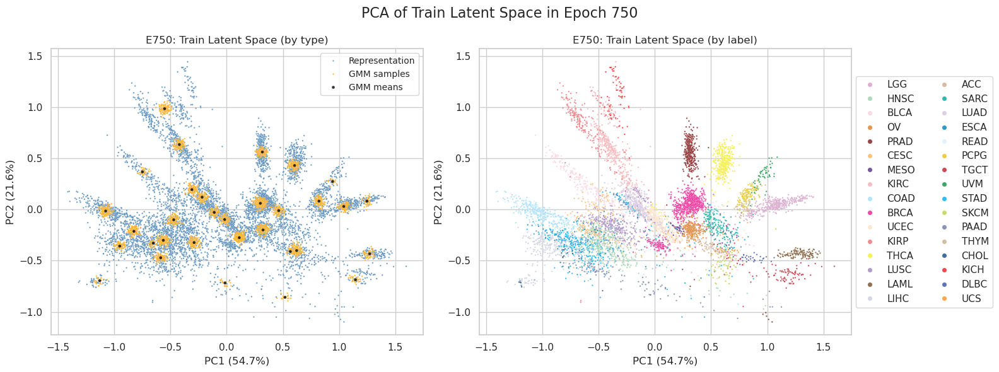

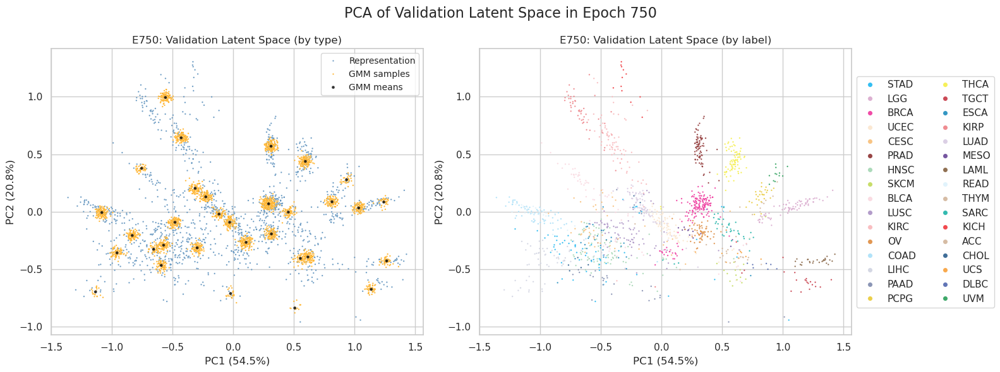

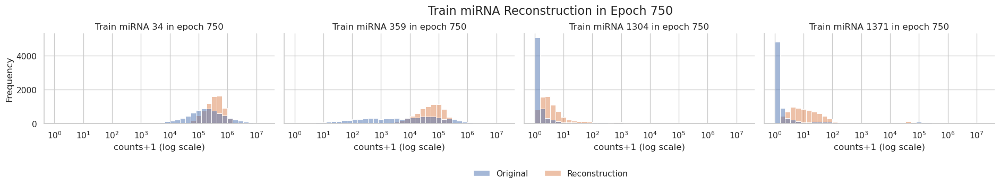

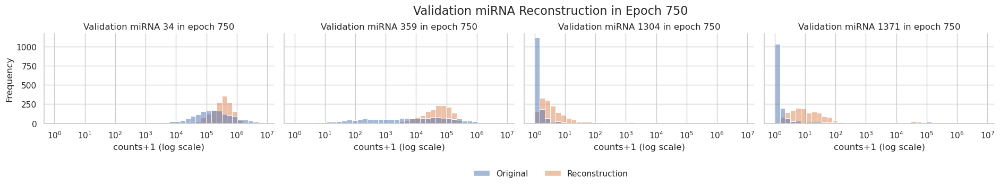

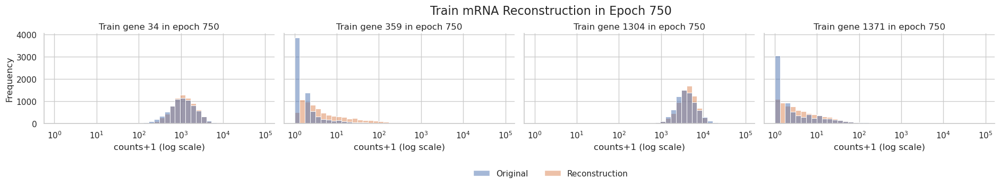

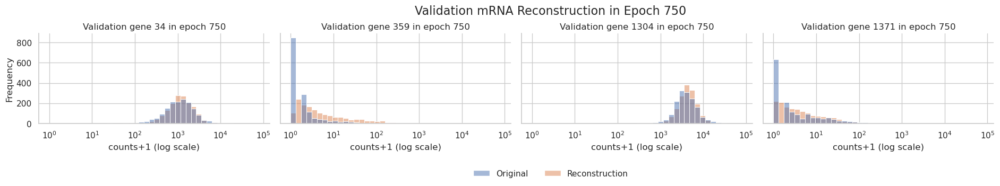

 50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                            | 756/1500 [57:42<1:07:27,  5.44s/it]

755 train_loss: 10.312312241003848 train_loss_decoder: 8.28253549793201 train_recon_mirna: 1.8918842102931896 train_recon_mrna: 6.39065128763882 train_gmm: 2.029776743071838 train_mse: 432458368.0 train_mae: 3287.584716796875 train_r2: 0.47323793172836304 train_spearman: 0.3738725781440735 train_pearson: 0.8842799663543701 train_msle: 5.320256233215332
755 test_loss: 10.367347215391282 test_loss_decoder: 8.329734553094516 test_recon_mirna: 1.9155856828524827 test_recon_mrna: 6.414148870242034 test_gmm: 2.0376126622967665 test_mse: 379393792.0 test_mae: 3106.513671875 test_r2: 0.4677826166152954 test_spearman: 0.36603060364723206 test_pearson: 0.8574056625366211 test_msle: 5.519252300262451


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                             | 761/1500 [58:05<57:16,  4.65s/it]

760 train_loss: 10.310181638812123 train_loss_decoder: 8.280344577474871 train_recon_mirna: 1.89141280278946 train_recon_mrna: 6.38893177468541 train_gmm: 2.0298370613372523 train_mse: 426097408.0 train_mae: 3256.3154296875 train_r2: 0.48098599910736084 train_spearman: 0.3742865324020386 train_pearson: 0.8836965560913086 train_msle: 5.299111366271973
760 test_loss: 10.362641362593454 test_loss_decoder: 8.325438757185978 test_recon_mirna: 1.9131411805640104 test_recon_mrna: 6.4122975766219685 test_gmm: 2.0372026054074768 test_mse: 377170368.0 test_mae: 3094.624267578125 test_r2: 0.47090160846710205 test_spearman: 0.3678181767463684 test_pearson: 0.8579141497612 test_msle: 5.509184837341309


 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 766/1500 [58:28<55:45,  4.56s/it]

765 train_loss: 10.308294130740954 train_loss_decoder: 8.278513827781293 train_recon_mirna: 1.891123152213341 train_recon_mrna: 6.387390675567953 train_gmm: 2.0297803029596624 train_mse: 434725600.0 train_mae: 3292.866943359375 train_r2: 0.47047626972198486 train_spearman: 0.3755829632282257 train_pearson: 0.8830565214157104 train_msle: 5.2286834716796875
765 test_loss: 10.358621606523265 test_loss_decoder: 8.322841009139093 test_recon_mirna: 1.91236752952049 test_recon_mrna: 6.410473479618603 test_gmm: 2.0357805973841714 test_mse: 381712512.0 test_mae: 3109.7275390625 test_r2: 0.4645298719406128 test_spearman: 0.36549821496009827 test_pearson: 0.857036292552948 test_msle: 5.464619159698486


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 771/1500 [58:50<54:51,  4.52s/it]

770 train_loss: 10.306145299187706 train_loss_decoder: 8.276686501295783 train_recon_mirna: 1.8908116745193033 train_recon_mrna: 6.3858748267764796 train_gmm: 2.0294587978919236 train_mse: 428157792.0 train_mae: 3261.650146484375 train_r2: 0.47847628593444824 train_spearman: 0.3749484717845917 train_pearson: 0.8825351595878601 train_msle: 5.001236915588379
770 test_loss: 10.355769042131245 test_loss_decoder: 8.320335973589161 test_recon_mirna: 1.9104230056033547 test_recon_mrna: 6.4099129679858065 test_gmm: 2.035433068542084 test_mse: 378720256.0 test_mae: 3091.43994140625 test_r2: 0.4687274098396301 test_spearman: 0.36555570363998413 test_pearson: 0.8553125262260437 test_msle: 5.286093235015869


 52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 776/1500 [59:13<56:20,  4.67s/it]

775 train_loss: 10.304096975295687 train_loss_decoder: 8.274733437743123 train_recon_mirna: 1.8904602992157258 train_recon_mrna: 6.384273138527398 train_gmm: 2.0293635375525647 train_mse: 423275360.0 train_mae: 3239.09814453125 train_r2: 0.4844233989715576 train_spearman: 0.37726205587387085 train_pearson: 0.881971001625061 train_msle: 4.65346622467041
775 test_loss: 10.35156651686711 test_loss_decoder: 8.316937877695523 test_recon_mirna: 1.9089577370852837 test_recon_mrna: 6.407980140610239 test_gmm: 2.0346286391715855 test_mse: 372256480.0 test_mae: 3066.755615234375 test_r2: 0.477794885635376 test_spearman: 0.36954811215400696 test_pearson: 0.8562720417976379 test_msle: 4.875500202178955


 52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 781/1500 [59:36<53:29,  4.46s/it]

780 train_loss: 10.302919959141324 train_loss_decoder: 8.273506090981378 train_recon_mirna: 1.8901363908119124 train_recon_mrna: 6.3833697001694665 train_gmm: 2.0294138681599447 train_mse: 422754112.0 train_mae: 3234.753173828125 train_r2: 0.48505836725234985 train_spearman: 0.37752941250801086 train_pearson: 0.8824467062950134 train_msle: 4.882936000823975
780 test_loss: 10.349071917837879 test_loss_decoder: 8.314089114532837 test_recon_mirna: 1.906277427029639 test_recon_mrna: 6.407811687503199 test_gmm: 2.034982803305042 test_mse: 371195488.0 test_mae: 3051.696044921875 test_r2: 0.47928327322006226 test_spearman: 0.3699584901332855 test_pearson: 0.8562442660331726 test_msle: 5.149393081665039


 52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 786/1500 [59:58<52:42,  4.43s/it]

785 train_loss: 10.300968334823814 train_loss_decoder: 8.271858164103701 train_recon_mirna: 1.8898682687390462 train_recon_mrna: 6.381989895364654 train_gmm: 2.0291101707201133 train_mse: 419205024.0 train_mae: 3222.989013671875 train_r2: 0.4893813133239746 train_spearman: 0.37555867433547974 train_pearson: 0.8826913833618164 train_msle: 5.447168827056885
785 test_loss: 10.346572367308568 test_loss_decoder: 8.31318125313441 test_recon_mirna: 1.905145069389108 test_recon_mrna: 6.408036183745302 test_gmm: 2.033391114174157 test_mse: 371119040.0 test_mae: 3058.56494140625 test_r2: 0.4793905019760132 test_spearman: 0.37038904428482056 test_pearson: 0.8552529811859131 test_msle: 5.684532165527344


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                       | 791/1500 [1:00:20<52:32,  4.45s/it]

790 train_loss: 10.298543863118306 train_loss_decoder: 8.269614356652118 train_recon_mirna: 1.889321147621377 train_recon_mrna: 6.380293209030742 train_gmm: 2.0289295064661874 train_mse: 413021184.0 train_mae: 3192.7607421875 train_r2: 0.4969136714935303 train_spearman: 0.3763269782066345 train_pearson: 0.8813338279724121 train_msle: 5.006176948547363
790 test_loss: 10.342691499568726 test_loss_decoder: 8.309898996717774 test_recon_mirna: 1.9045634415909745 test_recon_mrna: 6.405335555126799 test_gmm: 2.032792502850953 test_mse: 362830400.0 test_mae: 3018.716552734375 test_r2: 0.4910179376602173 test_spearman: 0.36859527230262756 test_pearson: 0.8554657101631165 test_msle: 5.2164154052734375


 53%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 796/1500 [1:00:43<53:55,  4.60s/it]

795 train_loss: 10.29671500633908 train_loss_decoder: 8.267885144402236 train_recon_mirna: 1.8890519634487815 train_recon_mrna: 6.378833180953453 train_gmm: 2.0288298619368432 train_mse: 410230432.0 train_mae: 3179.861083984375 train_r2: 0.5003129839897156 train_spearman: 0.37915483117103577 train_pearson: 0.8816668391227722 train_msle: 4.741247653961182
795 test_loss: 10.341118374648921 test_loss_decoder: 8.308484038373306 test_recon_mirna: 1.9047929087378634 test_recon_mrna: 6.403691129635443 test_gmm: 2.0326343362756143 test_mse: 365547232.0 test_mae: 3025.82080078125 test_r2: 0.48720669746398926 test_spearman: 0.37304407358169556 test_pearson: 0.8552234172821045 test_msle: 4.900869369506836


 53%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 801/1500 [1:01:06<52:37,  4.52s/it]

800 train_loss: 10.295190910260878 train_loss_decoder: 8.266498882684218 train_recon_mirna: 1.8891477157209131 train_recon_mrna: 6.377351166963304 train_gmm: 2.0286920275766605 train_mse: 410887488.0 train_mae: 3181.052001953125 train_r2: 0.49951261281967163 train_spearman: 0.37785273790359497 train_pearson: 0.8808733224868774 train_msle: 4.871570587158203
800 test_loss: 10.337577765314144 test_loss_decoder: 8.30559734851149 test_recon_mirna: 1.9028367309918535 test_recon_mrna: 6.402760617519636 test_gmm: 2.031980416802653 test_mse: 363209888.0 test_mae: 3015.93359375 test_r2: 0.4904855489730835 test_spearman: 0.37251028418540955 test_pearson: 0.8553038239479065 test_msle: 5.0514020919799805


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 806/1500 [1:01:28<52:38,  4.55s/it]

805 train_loss: 10.2927408556914 train_loss_decoder: 8.264118893798404 train_recon_mirna: 1.8879727895515868 train_recon_mrna: 6.376146104246818 train_gmm: 2.028621961892997 train_mse: 409162560.0 train_mae: 3169.546630859375 train_r2: 0.5016137361526489 train_spearman: 0.3807031512260437 train_pearson: 0.8809142708778381 train_msle: 4.4684343338012695
805 test_loss: 10.33409768279708 test_loss_decoder: 8.302547952756607 test_recon_mirna: 1.9004449913916515 test_recon_mrna: 6.402102961364956 test_gmm: 2.031549730040472 test_mse: 359591072.0 test_mae: 2992.704833984375 test_r2: 0.49556201696395874 test_spearman: 0.37169209122657776 test_pearson: 0.8555892109870911 test_msle: 4.705715179443359


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 811/1500 [1:01:51<51:42,  4.50s/it]

810 train_loss: 10.291384036695845 train_loss_decoder: 8.26259295779813 train_recon_mirna: 1.8877431715531547 train_recon_mrna: 6.374849786244975 train_gmm: 2.028791078897715 train_mse: 403712736.0 train_mae: 3146.88525390625 train_r2: 0.5082519054412842 train_spearman: 0.3810381591320038 train_pearson: 0.8805129528045654 train_msle: 4.639777660369873
810 test_loss: 10.332379051655263 test_loss_decoder: 8.300858075205468 test_recon_mirna: 1.9006832117724497 test_recon_mrna: 6.400174863433018 test_gmm: 2.0315209764497952 test_mse: 351453536.0 test_mae: 2962.451904296875 test_r2: 0.5069774389266968 test_spearman: 0.37629905343055725 test_pearson: 0.8584089875221252 test_msle: 4.829388618469238


 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                   | 816/1500 [1:02:14<52:47,  4.63s/it]

815 train_loss: 10.289575187125966 train_loss_decoder: 8.260847079128009 train_recon_mirna: 1.8871556176062363 train_recon_mrna: 6.373691461521773 train_gmm: 2.028728107997957 train_mse: 403556352.0 train_mae: 3141.85595703125 train_r2: 0.5084424018859863 train_spearman: 0.3815494775772095 train_pearson: 0.8801644444465637 train_msle: 4.355203628540039
815 test_loss: 10.32969132532373 test_loss_decoder: 8.298509496047316 test_recon_mirna: 1.899291242098536 test_recon_mrna: 6.39921825394878 test_gmm: 2.0311818292764134 test_mse: 351732224.0 test_mae: 2953.13134765625 test_r2: 0.5065865516662598 test_spearman: 0.37386462092399597 test_pearson: 0.854426383972168 test_msle: 4.544025897979736


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                   | 821/1500 [1:02:37<51:15,  4.53s/it]

820 train_loss: 10.291763136334644 train_loss_decoder: 8.262744207175107 train_recon_mirna: 1.8872270777098363 train_recon_mrna: 6.375517129465271 train_gmm: 2.0290189291595384 train_mse: 401204480.0 train_mae: 3134.830810546875 train_r2: 0.5113071799278259 train_spearman: 0.3835781514644623 train_pearson: 0.8809688687324524 train_msle: 4.836252212524414
820 test_loss: 10.345378373306204 test_loss_decoder: 8.314948836558674 test_recon_mirna: 1.8986856255706575 test_recon_mrna: 6.416263210988016 test_gmm: 2.0304295367475294 test_mse: 352644608.0 test_mae: 2963.871337890625 test_r2: 0.505306601524353 test_spearman: 0.3767286241054535 test_pearson: 0.8558397889137268 test_msle: 5.006009101867676


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                  | 825/1500 [1:02:56<51:13,  4.55s/it]

825 train_loss: 10.288335438886511 train_loss_decoder: 8.258889785163063 train_recon_mirna: 1.886729859003603 train_recon_mrna: 6.37215992615946 train_gmm: 2.0294456537234473 train_mse: 396958016.0 train_mae: 3112.32470703125 train_r2: 0.5164796113967896 train_spearman: 0.38325026631355286 train_pearson: 0.8803884387016296 train_msle: 4.42733097076416
825 test_loss: 10.328502179729968 test_loss_decoder: 8.296783657024413 test_recon_mirna: 1.8976570739998633 test_recon_mrna: 6.39912658302455 test_gmm: 2.0317185227055545 test_mse: 348798688.0 test_mae: 2951.42626953125 test_r2: 0.5107017159461975 test_spearman: 0.3779234290122986 test_pearson: 0.8537793159484863 test_msle: 4.656784534454346


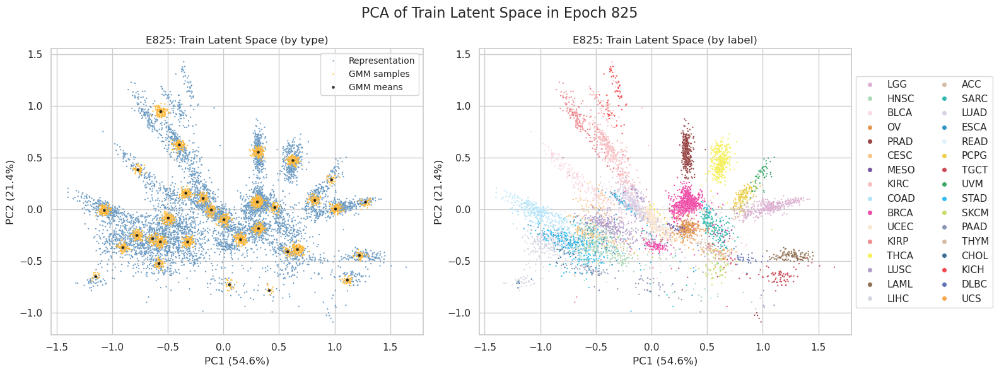

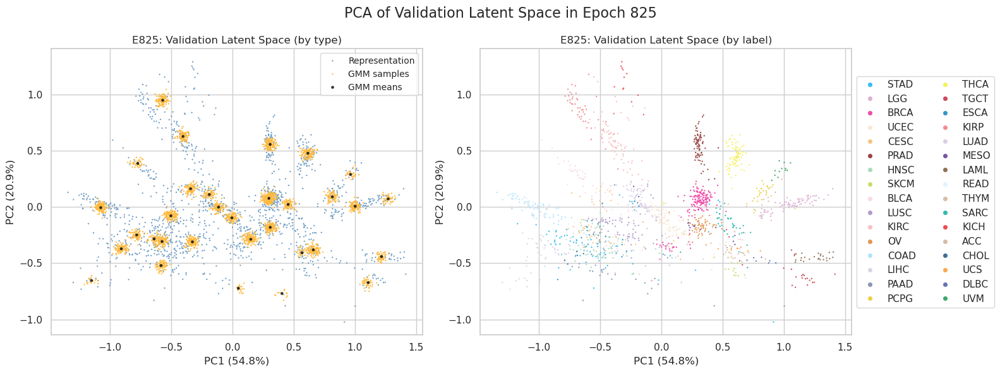

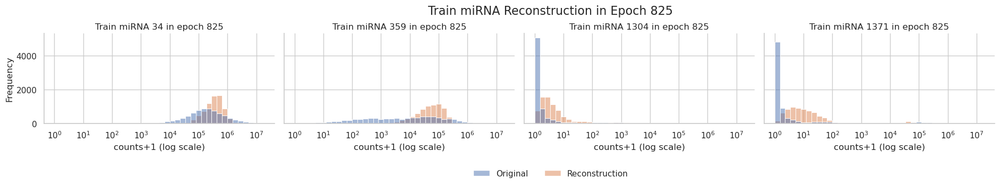

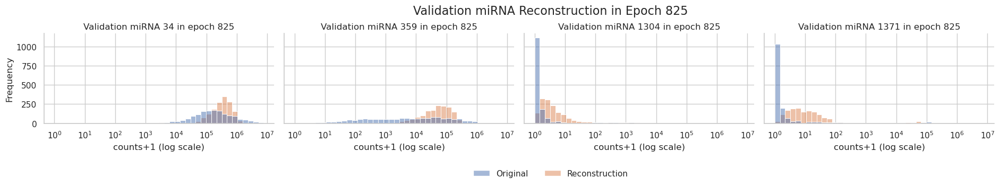

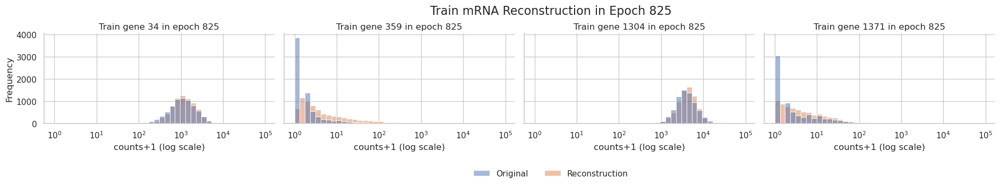

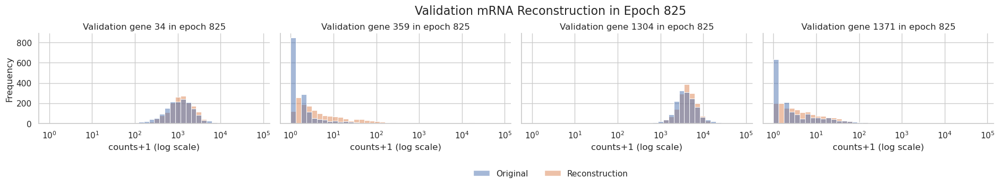

 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                 | 831/1500 [1:03:40<59:46,  5.36s/it]

830 train_loss: 10.286269504264968 train_loss_decoder: 8.256214038481648 train_recon_mirna: 1.8857820579382956 train_recon_mrna: 6.370431980543353 train_gmm: 2.0300554657833203 train_mse: 397714528.0 train_mae: 3116.70263671875 train_r2: 0.515558123588562 train_spearman: 0.3817957043647766 train_pearson: 0.8794815540313721 train_msle: 5.143861293792725
830 test_loss: 10.327605694508428 test_loss_decoder: 8.296064606815909 test_recon_mirna: 1.8966964310479726 test_recon_mrna: 6.399368175767937 test_gmm: 2.031541087692519 test_mse: 354775520.0 test_mae: 2972.439208984375 test_r2: 0.5023173689842224 test_spearman: 0.37529456615448 test_pearson: 0.854209303855896 test_msle: 5.352643013000488


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 836/1500 [1:04:03<51:44,  4.68s/it]

835 train_loss: 10.285005661908636 train_loss_decoder: 8.254234403863125 train_recon_mirna: 1.8852870737306318 train_recon_mrna: 6.368947330132492 train_gmm: 2.030771258045512 train_mse: 392719392.0 train_mae: 3092.513916015625 train_r2: 0.5216425657272339 train_spearman: 0.3810606002807617 train_pearson: 0.8803530335426331 train_msle: 5.033142566680908
835 test_loss: 10.324228553251686 test_loss_decoder: 8.291300625671447 test_recon_mirna: 1.8959756070039886 test_recon_mrna: 6.395325018667458 test_gmm: 2.032927927580239 test_mse: 351307808.0 test_mae: 2952.2978515625 test_r2: 0.5071818828582764 test_spearman: 0.3751583993434906 test_pearson: 0.8541115522384644 test_msle: 5.2239766120910645


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                | 841/1500 [1:04:25<48:52,  4.45s/it]

840 train_loss: 10.283299028588711 train_loss_decoder: 8.252368874204649 train_recon_mirna: 1.8850188835951438 train_recon_mrna: 6.3673499906095055 train_gmm: 2.0309301543840634 train_mse: 391469408.0 train_mae: 3082.895751953125 train_r2: 0.5231651067733765 train_spearman: 0.386432021856308 train_pearson: 0.8801690936088562 train_msle: 4.3342695236206055
840 test_loss: 10.32078504672049 test_loss_decoder: 8.288646129494479 test_recon_mirna: 1.8951581523021592 test_recon_mrna: 6.393487977192319 test_gmm: 2.03213891722601 test_mse: 345726720.0 test_mae: 2918.56787109375 test_r2: 0.5150111317634583 test_spearman: 0.3802478313446045 test_pearson: 0.8569578528404236 test_msle: 4.507747650146484


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 846/1500 [1:04:47<48:22,  4.44s/it]

845 train_loss: 10.28154385182758 train_loss_decoder: 8.250357742636213 train_recon_mirna: 1.884248308450686 train_recon_mrna: 6.366109434185526 train_gmm: 2.031186109191367 train_mse: 391332512.0 train_mae: 3080.37060546875 train_r2: 0.523331880569458 train_spearman: 0.3848496675491333 train_pearson: 0.8797551393508911 train_msle: 4.603853702545166
845 test_loss: 10.320319183756354 test_loss_decoder: 8.286590459449059 test_recon_mirna: 1.8945049887297047 test_recon_mrna: 6.392085470719353 test_gmm: 2.0337287243072946 test_mse: 342400416.0 test_mae: 2902.590087890625 test_r2: 0.5196772813796997 test_spearman: 0.37913399934768677 test_pearson: 0.8567306399345398 test_msle: 4.78440523147583


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 851/1500 [1:05:09<48:18,  4.47s/it]

850 train_loss: 10.28028088487929 train_loss_decoder: 8.24857414225309 train_recon_mirna: 1.8838393746322788 train_recon_mrna: 6.364734767620813 train_gmm: 2.0317067426261977 train_mse: 383262048.0 train_mae: 3044.62890625 train_r2: 0.5331622362136841 train_spearman: 0.3846384286880493 train_pearson: 0.880294680595398 train_msle: 4.605700492858887
850 test_loss: 10.319229155386315 test_loss_decoder: 8.287021949622597 test_recon_mirna: 1.8952401657934657 test_recon_mrna: 6.39178178382913 test_gmm: 2.032207205763719 test_mse: 338431456.0 test_mae: 2894.309814453125 test_r2: 0.525244951248169 test_spearman: 0.37929192185401917 test_pearson: 0.8553531765937805 test_msle: 4.799811840057373


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                              | 856/1500 [1:05:31<47:15,  4.40s/it]

855 train_loss: 10.278635723629458 train_loss_decoder: 8.246647657448836 train_recon_mirna: 1.8831442629110953 train_recon_mrna: 6.363503394537742 train_gmm: 2.0319880661806224 train_mse: 382345504.0 train_mae: 3040.59619140625 train_r2: 0.5342786312103271 train_spearman: 0.3875167965888977 train_pearson: 0.8796759247779846 train_msle: 4.571269989013672
855 test_loss: 10.317839461021528 test_loss_decoder: 8.284148858387857 test_recon_mirna: 1.893240224544474 test_recon_mrna: 6.390908633843383 test_gmm: 2.033690602633671 test_mse: 341765792.0 test_mae: 2904.623291015625 test_r2: 0.5205675363540649 test_spearman: 0.38323917984962463 test_pearson: 0.8518946170806885 test_msle: 4.785577774047852


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 861/1500 [1:05:54<48:13,  4.53s/it]

860 train_loss: 10.277829213666532 train_loss_decoder: 8.245102887114118 train_recon_mirna: 1.882664196120109 train_recon_mrna: 6.36243869099401 train_gmm: 2.032726326552413 train_mse: 380963584.0 train_mae: 3031.1640625 train_r2: 0.5359618663787842 train_spearman: 0.38579684495925903 train_pearson: 0.8806410431861877 train_msle: 4.608686447143555
860 test_loss: 10.317516698601867 test_loss_decoder: 8.283716267411108 test_recon_mirna: 1.8929788409709905 test_recon_mrna: 6.3907374264401176 test_gmm: 2.0338004311907585 test_mse: 338341440.0 test_mae: 2893.77685546875 test_r2: 0.525371253490448 test_spearman: 0.3818633556365967 test_pearson: 0.8552582859992981 test_msle: 4.771355628967285


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                            | 866/1500 [1:06:16<47:19,  4.48s/it]

865 train_loss: 10.277321222988954 train_loss_decoder: 8.244162127167366 train_recon_mirna: 1.8827488286277487 train_recon_mrna: 6.361413298539618 train_gmm: 2.033159095821588 train_mse: 380600416.0 train_mae: 3029.66259765625 train_r2: 0.5364042520523071 train_spearman: 0.38636648654937744 train_pearson: 0.8806564211845398 train_msle: 4.290987968444824
865 test_loss: 10.31655649280329 test_loss_decoder: 8.282172433765389 test_recon_mirna: 1.892792364337034 test_recon_mrna: 6.389380069428356 test_gmm: 2.034384059037902 test_mse: 335762880.0 test_mae: 2871.101806640625 test_r2: 0.5289884805679321 test_spearman: 0.38211825489997864 test_pearson: 0.8573098182678223 test_msle: 4.421624183654785


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 871/1500 [1:06:39<47:21,  4.52s/it]

870 train_loss: 10.276115354278904 train_loss_decoder: 8.242315599566384 train_recon_mirna: 1.8815315485414914 train_recon_mrna: 6.3607840510248925 train_gmm: 2.0337997547125197 train_mse: 372546688.0 train_mae: 2992.671142578125 train_r2: 0.54621422290802 train_spearman: 0.3869393765926361 train_pearson: 0.8799797892570496 train_msle: 4.650069713592529
870 test_loss: 10.31373968730459 test_loss_decoder: 8.278483977382384 test_recon_mirna: 1.8913774096596994 test_recon_mrna: 6.387106567722685 test_gmm: 2.0352557099222053 test_mse: 331191488.0 test_mae: 2849.596435546875 test_r2: 0.5354012250900269 test_spearman: 0.3815663754940033 test_pearson: 0.8566555976867676 test_msle: 4.819690227508545


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                           | 876/1500 [1:07:01<46:33,  4.48s/it]

875 train_loss: 10.275073583513015 train_loss_decoder: 8.24055119645749 train_recon_mirna: 1.881298094286185 train_recon_mrna: 6.359253102171306 train_gmm: 2.034522387055524 train_mse: 375537600.0 train_mae: 3002.13232421875 train_r2: 0.5425710678100586 train_spearman: 0.38993510603904724 train_pearson: 0.8806719779968262 train_msle: 3.992814064025879
875 test_loss: 10.315870829097896 test_loss_decoder: 8.280704910154887 test_recon_mirna: 1.8930773219110233 test_recon_mrna: 6.387627588243864 test_gmm: 2.0351659189430107 test_mse: 331226016.0 test_mae: 2848.842529296875 test_r2: 0.5353528261184692 test_spearman: 0.38537248969078064 test_pearson: 0.8556708693504333 test_msle: 4.185931205749512


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                          | 881/1500 [1:07:24<46:46,  4.53s/it]

880 train_loss: 10.274438130415785 train_loss_decoder: 8.238655020477022 train_recon_mirna: 1.8803110853843128 train_recon_mrna: 6.35834393509271 train_gmm: 2.035783109938763 train_mse: 368152384.0 train_mae: 2971.90478515625 train_r2: 0.5515667200088501 train_spearman: 0.3865731656551361 train_pearson: 0.8799564838409424 train_msle: 4.733433723449707
880 test_loss: 10.314893758980245 test_loss_decoder: 8.278905811221101 test_recon_mirna: 1.8917288272805335 test_recon_mrna: 6.387176983940567 test_gmm: 2.0359879477591445 test_mse: 328122720.0 test_mae: 2836.958984375 test_r2: 0.5397062301635742 test_spearman: 0.3813655972480774 test_pearson: 0.8544027209281921 test_msle: 4.887545585632324


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                         | 886/1500 [1:07:47<46:20,  4.53s/it]

885 train_loss: 10.273175278311541 train_loss_decoder: 8.236806272986525 train_recon_mirna: 1.879961549520173 train_recon_mrna: 6.356844723466352 train_gmm: 2.036369005325015 train_mse: 375096608.0 train_mae: 2998.675537109375 train_r2: 0.5431082248687744 train_spearman: 0.39145413041114807 train_pearson: 0.8803116679191589 train_msle: 3.8433637619018555
885 test_loss: 10.31223261340632 test_loss_decoder: 8.274794488391239 test_recon_mirna: 1.8899307175293183 test_recon_mrna: 6.38486377086192 test_gmm: 2.0374381250150804 test_mse: 327862496.0 test_mae: 2830.94677734375 test_r2: 0.5400712490081787 test_spearman: 0.38647669553756714 test_pearson: 0.858718991279602 test_msle: 4.017018795013428


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 891/1500 [1:08:09<45:03,  4.44s/it]

890 train_loss: 10.27235972903696 train_loss_decoder: 8.234920412926272 train_recon_mirna: 1.8792214353582903 train_recon_mrna: 6.355698977567981 train_gmm: 2.037439316110688 train_mse: 362841312.0 train_mae: 2949.433837890625 train_r2: 0.5580359697341919 train_spearman: 0.3875608742237091 train_pearson: 0.8803207278251648 train_msle: 4.962494373321533
890 test_loss: 10.31066035935664 test_loss_decoder: 8.272464984690469 test_recon_mirna: 1.8893713262142087 test_recon_mrna: 6.38309365847626 test_gmm: 2.038195374666172 test_mse: 320762496.0 test_mae: 2813.54296875 test_r2: 0.5500311851501465 test_spearman: 0.3833429515361786 test_pearson: 0.8549723029136658 test_msle: 5.1621904373168945


 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 896/1500 [1:08:31<44:41,  4.44s/it]

895 train_loss: 10.27178038785912 train_loss_decoder: 8.233573467985094 train_recon_mirna: 1.879128650401259 train_recon_mrna: 6.354444817583835 train_gmm: 2.038206919874027 train_mse: 361870816.0 train_mae: 2941.405517578125 train_r2: 0.5592181086540222 train_spearman: 0.3891667127609253 train_pearson: 0.880615234375 train_msle: 4.4731245040893555
895 test_loss: 10.311725363200656 test_loss_decoder: 8.272684983484202 test_recon_mirna: 1.8892102002971314 test_recon_mrna: 6.383474783187071 test_gmm: 2.039040379716454 test_mse: 321704320.0 test_mae: 2807.97265625 test_r2: 0.5487099885940552 test_spearman: 0.3853977918624878 test_pearson: 0.8551450371742249 test_msle: 4.61013650894165


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                       | 900/1500 [1:08:49<44:15,  4.43s/it]

900 train_loss: 10.270933709085634 train_loss_decoder: 8.23240027877611 train_recon_mirna: 1.878690822654715 train_recon_mrna: 6.353709456121394 train_gmm: 2.038533430309524 train_mse: 363323040.0 train_mae: 2946.01318359375 train_r2: 0.5574491620063782 train_spearman: 0.39050132036209106 train_pearson: 0.8808770775794983 train_msle: 4.430637359619141
900 test_loss: 10.311741208151467 test_loss_decoder: 8.271431154319888 test_recon_mirna: 1.889845360322736 test_recon_mrna: 6.381585793997153 test_gmm: 2.040310053831579 test_mse: 325949888.0 test_mae: 2822.505859375 test_r2: 0.5427542924880981 test_spearman: 0.38531482219696045 test_pearson: 0.8528345227241516 test_msle: 4.573119163513184


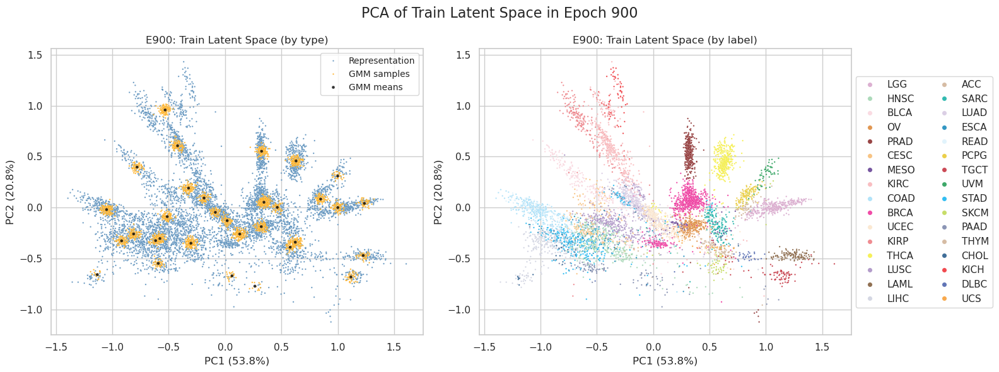

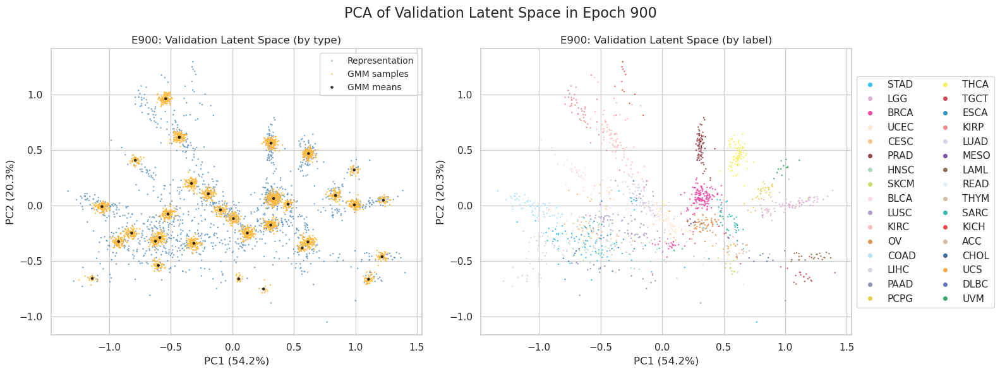

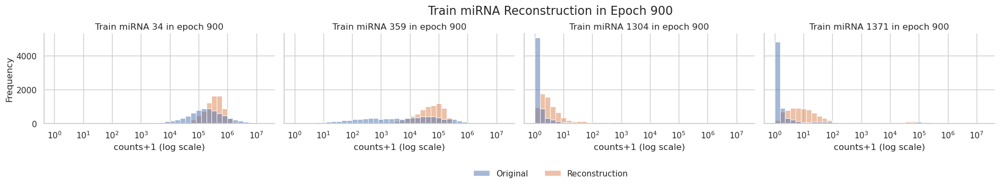

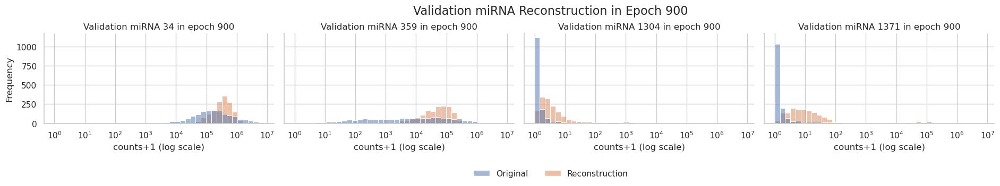

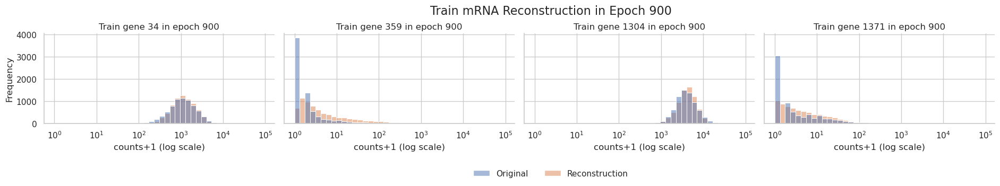

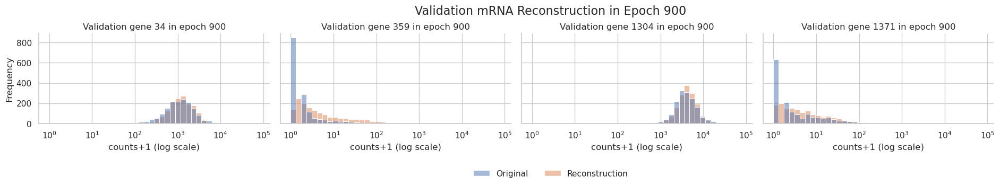

 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                      | 906/1500 [1:09:33<53:16,  5.38s/it]

905 train_loss: 10.269202451998787 train_loss_decoder: 8.230360122350852 train_recon_mirna: 1.8780921793428158 train_recon_mrna: 6.352267943008037 train_gmm: 2.038842329647935 train_mse: 364252576.0 train_mae: 2944.883544921875 train_r2: 0.5563169717788696 train_spearman: 0.3919166624546051 train_pearson: 0.880270779132843 train_msle: 4.199834823608398
905 test_loss: 10.310058487810835 test_loss_decoder: 8.26928335591061 test_recon_mirna: 1.889215240888696 test_recon_mrna: 6.380068115021913 test_gmm: 2.0407751319002267 test_mse: 324458720.0 test_mae: 2807.3193359375 test_r2: 0.5448460578918457 test_spearman: 0.3865647315979004 test_pearson: 0.8555608987808228 test_msle: 4.337002277374268


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 911/1500 [1:09:56<45:59,  4.68s/it]

910 train_loss: 10.268555387352247 train_loss_decoder: 8.228924891903834 train_recon_mirna: 1.8779459940129168 train_recon_mrna: 6.350978897890916 train_gmm: 2.039630495448414 train_mse: 354964320.0 train_mae: 2906.9755859375 train_r2: 0.5676306486129761 train_spearman: 0.3878224194049835 train_pearson: 0.8799490928649902 train_msle: 5.037413120269775
910 test_loss: 10.311011880505735 test_loss_decoder: 8.269913461941316 test_recon_mirna: 1.8891575587022698 test_recon_mrna: 6.380755903239046 test_gmm: 2.041098418564418 test_mse: 318278368.0 test_mae: 2791.887451171875 test_r2: 0.5535159111022949 test_spearman: 0.3868979215621948 test_pearson: 0.8560143113136292 test_msle: 5.145245552062988


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 916/1500 [1:10:18<42:50,  4.40s/it]

915 train_loss: 10.266548781225987 train_loss_decoder: 8.227026029014496 train_recon_mirna: 1.8770879766927413 train_recon_mrna: 6.349938052321754 train_gmm: 2.0395227522114907 train_mse: 354953120.0 train_mae: 2904.987548828125 train_r2: 0.5676442980766296 train_spearman: 0.39140674471855164 train_pearson: 0.8807604908943176 train_msle: 4.358897686004639
915 test_loss: 10.309175307763908 test_loss_decoder: 8.268067129477597 test_recon_mirna: 1.8891136130886048 test_recon_mrna: 6.378953516388993 test_gmm: 2.0411081782863105 test_mse: 312777536.0 test_mae: 2766.61767578125 test_r2: 0.5612325668334961 test_spearman: 0.38614213466644287 test_pearson: 0.8581604957580566 test_msle: 4.50101900100708


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                    | 921/1500 [1:10:40<42:56,  4.45s/it]

920 train_loss: 10.265788783147812 train_loss_decoder: 8.225694877701292 train_recon_mirna: 1.876515671463366 train_recon_mrna: 6.349179206237927 train_gmm: 2.0400939054465206 train_mse: 349963968.0 train_mae: 2879.828369140625 train_r2: 0.5737214088439941 train_spearman: 0.3905579745769501 train_pearson: 0.8802416920661926 train_msle: 4.590368270874023
920 test_loss: 10.307061818467531 test_loss_decoder: 8.264858990726204 test_recon_mirna: 1.8870920521173182 test_recon_mrna: 6.377766938608886 test_gmm: 2.0422028277413276 test_mse: 312966176.0 test_mae: 2764.557861328125 test_r2: 0.5609679222106934 test_spearman: 0.38647574186325073 test_pearson: 0.8549680709838867 test_msle: 4.756842136383057


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 926/1500 [1:11:02<42:05,  4.40s/it]

925 train_loss: 10.26404594070519 train_loss_decoder: 8.223872121126302 train_recon_mirna: 1.8760388279621232 train_recon_mrna: 6.347833293164179 train_gmm: 2.040173819578887 train_mse: 348461344.0 train_mae: 2872.372802734375 train_r2: 0.5755516886711121 train_spearman: 0.3942301869392395 train_pearson: 0.8809168934822083 train_msle: 4.237081050872803
925 test_loss: 10.306134979344396 test_loss_decoder: 8.264240090435523 test_recon_mirna: 1.8872126849945887 test_recon_mrna: 6.377027405440935 test_gmm: 2.0418948889088724 test_mse: 307282368.0 test_mae: 2745.44970703125 test_r2: 0.5689412355422974 test_spearman: 0.3918091952800751 test_pearson: 0.8571572303771973 test_msle: 4.372966289520264


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 931/1500 [1:11:25<42:06,  4.44s/it]

930 train_loss: 10.262492717930886 train_loss_decoder: 8.222457005281713 train_recon_mirna: 1.8757210558206647 train_recon_mrna: 6.346735949461049 train_gmm: 2.040035712649173 train_mse: 345429952.0 train_mae: 2854.580322265625 train_r2: 0.5792441368103027 train_spearman: 0.3956107199192047 train_pearson: 0.881228506565094 train_msle: 3.809113025665283
930 test_loss: 10.305509078287736 test_loss_decoder: 8.263426657075472 test_recon_mirna: 1.8872816062806506 test_recon_mrna: 6.376145050794822 test_gmm: 2.0420824212122644 test_mse: 309183264.0 test_mae: 2744.3291015625 test_r2: 0.5662746429443359 test_spearman: 0.39147424697875977 test_pearson: 0.8552579879760742 test_msle: 3.999985933303833


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 936/1500 [1:11:46<40:46,  4.34s/it]

935 train_loss: 10.261058298318721 train_loss_decoder: 8.220880286720408 train_recon_mirna: 1.8752717667859191 train_recon_mrna: 6.34560851993449 train_gmm: 2.040178011598313 train_mse: 340679744.0 train_mae: 2836.356201171875 train_r2: 0.585030198097229 train_spearman: 0.39328208565711975 train_pearson: 0.8798458576202393 train_msle: 4.4384765625
935 test_loss: 10.301263074559182 test_loss_decoder: 8.260730147659933 test_recon_mirna: 1.8852254969834112 test_recon_mrna: 6.375504650676521 test_gmm: 2.040532926899249 test_mse: 303758432.0 test_mae: 2732.10205078125 test_r2: 0.5738846063613892 test_spearman: 0.3875312805175781 test_pearson: 0.8561862111091614 test_msle: 4.576924800872803


 63%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                 | 941/1500 [1:12:09<41:27,  4.45s/it]

940 train_loss: 10.259866372658742 train_loss_decoder: 8.219507327992169 train_recon_mirna: 1.8746014260928208 train_recon_mrna: 6.344905901899349 train_gmm: 2.0403590446665723 train_mse: 342849152.0 train_mae: 2842.159912109375 train_r2: 0.5823876857757568 train_spearman: 0.39302220940589905 train_pearson: 0.8796979188919067 train_msle: 4.212871074676514
940 test_loss: 10.30269113953267 test_loss_decoder: 8.260980924880597 test_recon_mirna: 1.8865015774417973 test_recon_mrna: 6.3744793474387995 test_gmm: 2.0417102146520727 test_mse: 303702048.0 test_mae: 2724.17333984375 test_r2: 0.5739637613296509 test_spearman: 0.3893401324748993 test_pearson: 0.8568265438079834 test_msle: 4.354548454284668


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                 | 946/1500 [1:12:31<41:44,  4.52s/it]

945 train_loss: 10.258033436970184 train_loss_decoder: 8.21787542631777 train_recon_mirna: 1.8741772513585149 train_recon_mrna: 6.343698174959255 train_gmm: 2.040158010652413 train_mse: 334215968.0 train_mae: 2802.599853515625 train_r2: 0.5929034948348999 train_spearman: 0.3917233645915985 train_pearson: 0.8797224164009094 train_msle: 4.597177028656006
945 test_loss: 10.299481081934307 test_loss_decoder: 8.258240722651534 test_recon_mirna: 1.8846598037916347 test_recon_mrna: 6.373580918859899 test_gmm: 2.0412403592827726 test_mse: 299237600.0 test_mae: 2706.972900390625 test_r2: 0.5802265405654907 test_spearman: 0.38881030678749084 test_pearson: 0.8570510149002075 test_msle: 4.648569107055664


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 951/1500 [1:12:54<42:06,  4.60s/it]

950 train_loss: 10.256938055960884 train_loss_decoder: 8.216722292897558 train_recon_mirna: 1.873771476130007 train_recon_mrna: 6.34295081676755 train_gmm: 2.040215763063327 train_mse: 337623488.0 train_mae: 2817.833740234375 train_r2: 0.5887528657913208 train_spearman: 0.39252665638923645 train_pearson: 0.8794964551925659 train_msle: 4.211487293243408
950 test_loss: 10.29874746334903 test_loss_decoder: 8.257308494259012 test_recon_mirna: 1.884174130598767 test_recon_mrna: 6.373134363660245 test_gmm: 2.041438969090019 test_mse: 301528960.0 test_mae: 2710.580078125 test_r2: 0.5770121812820435 test_spearman: 0.39078542590141296 test_pearson: 0.856256365776062 test_msle: 4.300014019012451


 64%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 956/1500 [1:13:16<39:48,  4.39s/it]

955 train_loss: 10.256096944599985 train_loss_decoder: 8.216161987070722 train_recon_mirna: 1.873483092783061 train_recon_mrna: 6.34267889428766 train_gmm: 2.039934957529264 train_mse: 334619424.0 train_mae: 2802.245361328125 train_r2: 0.5924120545387268 train_spearman: 0.39205649495124817 train_pearson: 0.8798813223838806 train_msle: 4.6485161781311035
955 test_loss: 10.304470476524383 test_loss_decoder: 8.263114028414108 test_recon_mirna: 1.883289507014453 test_recon_mrna: 6.379824521399655 test_gmm: 2.0413564481102755 test_mse: 301012672.0 test_mae: 2710.395263671875 test_r2: 0.5777363777160645 test_spearman: 0.3899577260017395 test_pearson: 0.8569420576095581 test_msle: 4.762241840362549


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 961/1500 [1:13:38<39:47,  4.43s/it]

960 train_loss: 10.255100436299136 train_loss_decoder: 8.21496586588199 train_recon_mirna: 1.8730847231982588 train_recon_mrna: 6.341881142683731 train_gmm: 2.040134570417146 train_mse: 337161920.0 train_mae: 2809.693115234375 train_r2: 0.5893151164054871 train_spearman: 0.3921408951282501 train_pearson: 0.8799965977668762 train_msle: 4.184928894042969
960 test_loss: 10.299345765657717 test_loss_decoder: 8.258184812597325 test_recon_mirna: 1.883717985061094 test_recon_mrna: 6.37446682753623 test_gmm: 2.0411609530603934 test_mse: 297692032.0 test_mae: 2691.388916015625 test_r2: 0.5823945999145508 test_spearman: 0.3881779909133911 test_pearson: 0.855774998664856 test_msle: 4.351036071777344


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 966/1500 [1:14:00<39:16,  4.41s/it]

965 train_loss: 10.253218714729329 train_loss_decoder: 8.21290668134114 train_recon_mirna: 1.8725737504619435 train_recon_mrna: 6.340332930879196 train_gmm: 2.0403120333881875 train_mse: 334163680.0 train_mae: 2794.7333984375 train_r2: 0.59296715259552 train_spearman: 0.3930318057537079 train_pearson: 0.880014181137085 train_msle: 4.193966865539551
965 test_loss: 10.29765060694316 test_loss_decoder: 8.256077579767673 test_recon_mirna: 1.8849077585452945 test_recon_mrna: 6.371169821222378 test_gmm: 2.041573027175487 test_mse: 298874080.0 test_mae: 2696.2509765625 test_r2: 0.5807364583015442 test_spearman: 0.389503538608551 test_pearson: 0.8534696102142334 test_msle: 4.379779815673828


 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 971/1500 [1:14:22<39:09,  4.44s/it]

970 train_loss: 10.25330385157204 train_loss_decoder: 8.212803391813283 train_recon_mirna: 1.8725803194465411 train_recon_mrna: 6.340223072366742 train_gmm: 2.0405004597587575 train_mse: 327922592.0 train_mae: 2769.393798828125 train_r2: 0.6005692481994629 train_spearman: 0.3918176293373108 train_pearson: 0.8803750276565552 train_msle: 4.6306071281433105
970 test_loss: 10.294552030739558 test_loss_decoder: 8.25243625721737 test_recon_mirna: 1.8827815196944713 test_recon_mrna: 6.3696547375228985 test_gmm: 2.042115773522187 test_mse: 296296896.0 test_mae: 2689.58203125 test_r2: 0.5843517780303955 test_spearman: 0.3903968930244446 test_pearson: 0.8559088110923767 test_msle: 4.84235954284668


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 975/1500 [1:14:40<37:39,  4.30s/it]

975 train_loss: 10.250469891521151 train_loss_decoder: 8.210314902317414 train_recon_mirna: 1.871470970133859 train_recon_mrna: 6.338843932183556 train_gmm: 2.040154989203737 train_mse: 327578496.0 train_mae: 2760.696044921875 train_r2: 0.6009883284568787 train_spearman: 0.39600181579589844 train_pearson: 0.8807023763656616 train_msle: 3.928422451019287
975 test_loss: 10.293667743265704 test_loss_decoder: 8.251214890642034 test_recon_mirna: 1.8818545046331416 test_recon_mrna: 6.369360386008893 test_gmm: 2.0424528526236703 test_mse: 293282592.0 test_mae: 2669.339599609375 test_r2: 0.5885802507400513 test_spearman: 0.39081141352653503 test_pearson: 0.8556400537490845 test_msle: 4.180978298187256


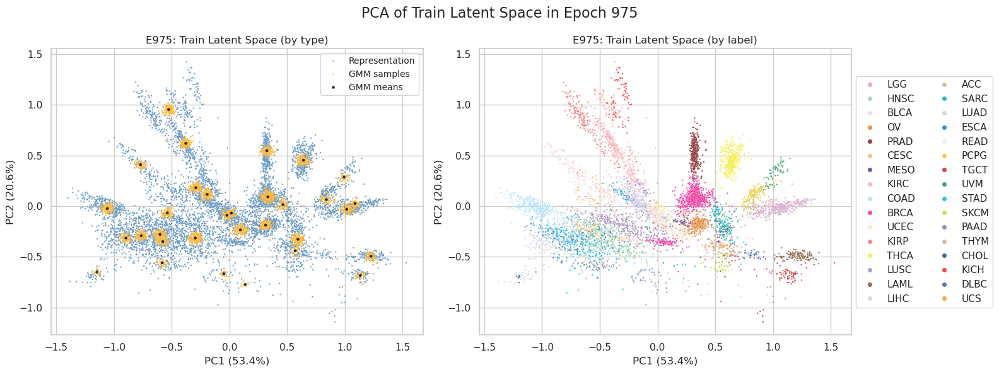

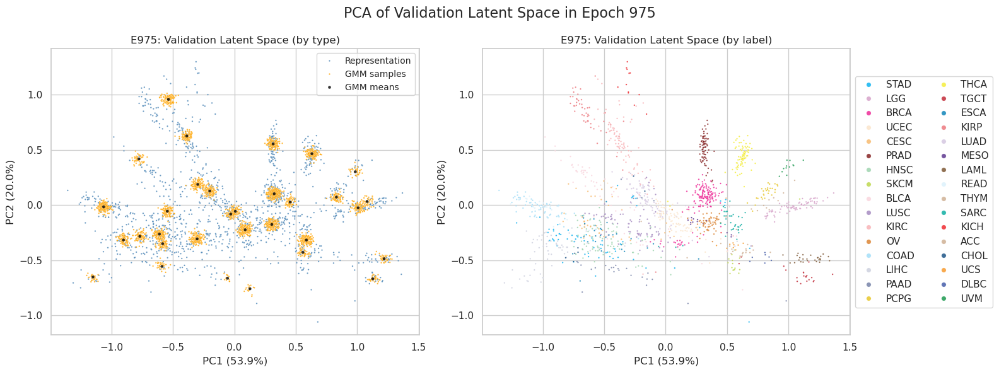

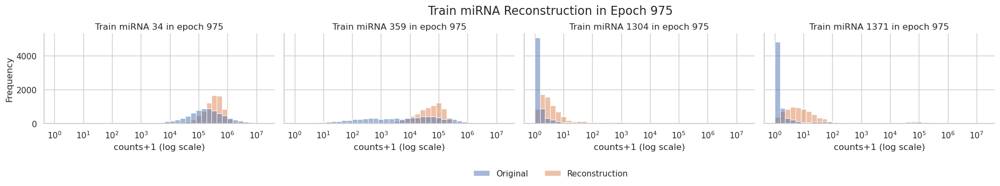

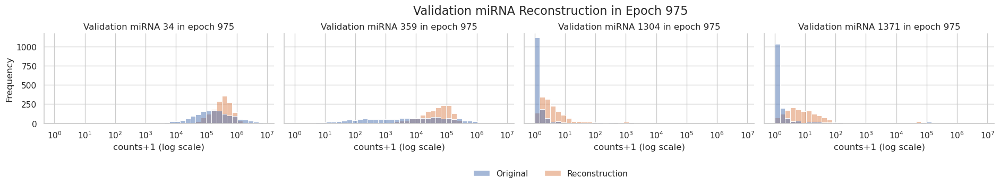

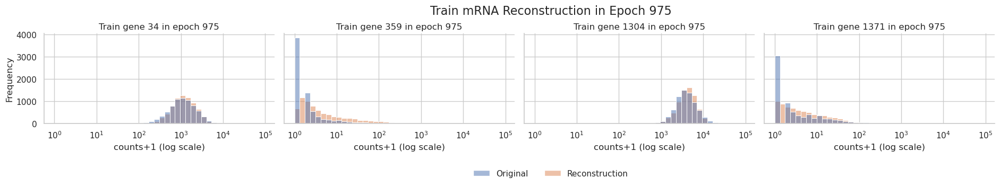

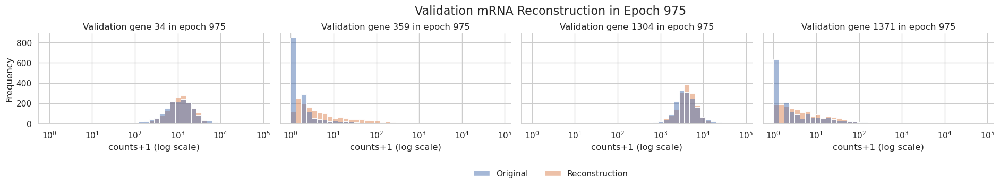

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 981/1500 [1:15:23<44:53,  5.19s/it]

980 train_loss: 10.249327350119962 train_loss_decoder: 8.208817770714296 train_recon_mirna: 1.8709109364876155 train_recon_mrna: 6.337906834226681 train_gmm: 2.0405095794056662 train_mse: 319782912.0 train_mae: 2728.677001953125 train_r2: 0.6104838848114014 train_spearman: 0.39290356636047363 train_pearson: 0.8802034258842468 train_msle: 4.447455883026123
980 test_loss: 10.291632335652832 test_loss_decoder: 8.249164863660745 test_recon_mirna: 1.881346645778836 test_recon_mrna: 6.367818217881909 test_gmm: 2.042467471992086 test_mse: 283066464.0 test_mae: 2620.527099609375 test_r2: 0.6029115915298462 test_spearman: 0.39133378863334656 test_pearson: 0.8568929433822632 test_msle: 4.635674953460693


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 986/1500 [1:15:44<38:37,  4.51s/it]

985 train_loss: 10.247070289276602 train_loss_decoder: 8.206990577545458 train_recon_mirna: 1.8702174368820925 train_recon_mrna: 6.336773140663366 train_gmm: 2.040079711731144 train_mse: 324046560.0 train_mae: 2744.4794921875 train_r2: 0.6052904725074768 train_spearman: 0.39594942331314087 train_pearson: 0.8799789547920227 train_msle: 4.143975734710693
985 test_loss: 10.289989512474335 test_loss_decoder: 8.248274232559092 test_recon_mirna: 1.8809413806484692 test_recon_mrna: 6.367332851910623 test_gmm: 2.041715279915243 test_mse: 286653728.0 test_mae: 2628.3232421875 test_r2: 0.5978792905807495 test_spearman: 0.3945682942867279 test_pearson: 0.8575798869132996 test_msle: 4.319833278656006


 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 991/1500 [1:16:08<39:31,  4.66s/it]

990 train_loss: 10.245791224145744 train_loss_decoder: 8.205733224391007 train_recon_mirna: 1.8696787541844362 train_recon_mrna: 6.336054470206571 train_gmm: 2.0400579997547363 train_mse: 315003552.0 train_mae: 2708.179443359375 train_r2: 0.616305410861969 train_spearman: 0.39649757742881775 train_pearson: 0.8805446624755859 train_msle: 4.147706985473633
990 test_loss: 10.288103016321507 test_loss_decoder: 8.247113554489673 test_recon_mirna: 1.880673815036873 test_recon_mrna: 6.366439739452799 test_gmm: 2.0409894618318356 test_mse: 287085376.0 test_mae: 2634.49609375 test_r2: 0.5972737073898315 test_spearman: 0.3939209282398224 test_pearson: 0.8536558151245117 test_msle: 4.32765007019043


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                         | 996/1500 [1:16:31<38:49,  4.62s/it]

995 train_loss: 10.244791638614192 train_loss_decoder: 8.204962690745601 train_recon_mirna: 1.8695943227709069 train_recon_mrna: 6.335368367974695 train_gmm: 2.0398289478685916 train_mse: 310361376.0 train_mae: 2683.913330078125 train_r2: 0.621959924697876 train_spearman: 0.3957878649234772 train_pearson: 0.8799979090690613 train_msle: 4.213699817657471
995 test_loss: 10.286675087454654 test_loss_decoder: 8.245134810868961 test_recon_mirna: 1.879740082899067 test_recon_mrna: 6.365394727969895 test_gmm: 2.0415402765856916 test_mse: 281775776.0 test_mae: 2609.12939453125 test_r2: 0.6047221422195435 test_spearman: 0.3939652442932129 test_pearson: 0.8549743890762329 test_msle: 4.363777160644531


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1001/1500 [1:16:54<39:12,  4.71s/it]

1000 train_loss: 10.24304509668157 train_loss_decoder: 8.203301272181925 train_recon_mirna: 1.868868559061371 train_recon_mrna: 6.334432713120553 train_gmm: 2.0397438244996446 train_mse: 311925920.0 train_mae: 2690.828125 train_r2: 0.6200541853904724 train_spearman: 0.393514484167099 train_pearson: 0.8795695900917053 train_msle: 4.443014621734619
1000 test_loss: 10.285664161404128 test_loss_decoder: 8.244772408900655 test_recon_mirna: 1.8796695246559934 test_recon_mrna: 6.365102884244662 test_gmm: 2.040891752503473 test_mse: 277734752.0 test_mae: 2590.243896484375 test_r2: 0.6103909015655518 test_spearman: 0.39388856291770935 test_pearson: 0.8579636812210083 test_msle: 4.53480339050293


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                       | 1006/1500 [1:17:17<37:51,  4.60s/it]

1005 train_loss: 10.242092534154704 train_loss_decoder: 8.202340029224757 train_recon_mirna: 1.8682906156642833 train_recon_mrna: 6.334049413560473 train_gmm: 2.039752504929946 train_mse: 311374592.0 train_mae: 2687.293212890625 train_r2: 0.6207257509231567 train_spearman: 0.3959851861000061 train_pearson: 0.8802691102027893 train_msle: 4.139562129974365
1005 test_loss: 10.287232494647714 test_loss_decoder: 8.246014941698723 test_recon_mirna: 1.8796494473060916 test_recon_mrna: 6.366365494392632 test_gmm: 2.04121755294899 test_mse: 275398240.0 test_mae: 2571.712890625 test_r2: 0.6136685609817505 test_spearman: 0.3945302665233612 test_pearson: 0.8558720946311951 test_msle: 4.273250579833984


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 1011/1500 [1:17:40<36:35,  4.49s/it]

1010 train_loss: 10.240696585658489 train_loss_decoder: 8.201117547572892 train_recon_mirna: 1.8680221573136406 train_recon_mrna: 6.333095390259252 train_gmm: 2.039579038085597 train_mse: 302787072.0 train_mae: 2649.639892578125 train_r2: 0.6311858892440796 train_spearman: 0.3930833041667938 train_pearson: 0.8803046941757202 train_msle: 4.675214767456055
1010 test_loss: 10.285208559316924 test_loss_decoder: 8.244369056756621 test_recon_mirna: 1.8795943814902052 test_recon_mrna: 6.364774675266417 test_gmm: 2.040839502560302 test_mse: 278856736.0 test_mae: 2589.868896484375 test_r2: 0.6088169813156128 test_spearman: 0.39542338252067566 test_pearson: 0.8536348342895508 test_msle: 4.723000526428223


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                      | 1016/1500 [1:18:03<36:36,  4.54s/it]

1015 train_loss: 10.239180567660792 train_loss_decoder: 8.1996111606489 train_recon_mirna: 1.8673810592014777 train_recon_mrna: 6.332230101447421 train_gmm: 2.039569407011893 train_mse: 307919968.0 train_mae: 2662.314697265625 train_r2: 0.6249337196350098 train_spearman: 0.3982817530632019 train_pearson: 0.8803991079330444 train_msle: 3.547400712966919
1015 test_loss: 10.282910810239203 test_loss_decoder: 8.241939097414932 test_recon_mirna: 1.8787482340816453 test_recon_mrna: 6.363190863333287 test_gmm: 2.040971712824272 test_mse: 272955840.0 test_mae: 2551.80859375 test_r2: 0.6170948147773743 test_spearman: 0.39712515473365784 test_pearson: 0.8569724559783936 test_msle: 3.704975128173828


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 1021/1500 [1:18:25<35:48,  4.49s/it]

1020 train_loss: 10.238352681259052 train_loss_decoder: 8.198797775626856 train_recon_mirna: 1.8673426865443987 train_recon_mrna: 6.331455089082458 train_gmm: 2.0395549056321958 train_mse: 306243680.0 train_mae: 2660.88134765625 train_r2: 0.6269755363464355 train_spearman: 0.3956632912158966 train_pearson: 0.8797875046730042 train_msle: 4.728287220001221
1020 test_loss: 10.281741380153035 test_loss_decoder: 8.241517611896459 test_recon_mirna: 1.878840493769379 test_recon_mrna: 6.36267711812708 test_gmm: 2.040223768256576 test_mse: 276546048.0 test_mae: 2572.353271484375 test_r2: 0.6120584607124329 test_spearman: 0.3959696590900421 test_pearson: 0.8539358377456665 test_msle: 4.878672122955322


 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 1026/1500 [1:18:48<35:21,  4.48s/it]

1025 train_loss: 10.236200680000902 train_loss_decoder: 8.196753820165254 train_recon_mirna: 1.866266816912636 train_recon_mrna: 6.3304870032526175 train_gmm: 2.039446859835648 train_mse: 304183232.0 train_mae: 2651.13916015625 train_r2: 0.6294852495193481 train_spearman: 0.39653271436691284 train_pearson: 0.880298376083374 train_msle: 4.021409034729004
1025 test_loss: 10.28084913864141 test_loss_decoder: 8.239887819503023 test_recon_mirna: 1.8784753787899702 test_recon_mrna: 6.361412440713053 test_gmm: 2.0409613191383866 test_mse: 277703168.0 test_mae: 2571.658203125 test_r2: 0.6104352474212646 test_spearman: 0.3970554769039154 test_pearson: 0.8551608324050903 test_msle: 4.152315616607666


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                    | 1031/1500 [1:19:09<33:56,  4.34s/it]

1030 train_loss: 10.235165633999804 train_loss_decoder: 8.195834296320683 train_recon_mirna: 1.8659829352490287 train_recon_mrna: 6.329851361071654 train_gmm: 2.0393313376791204 train_mse: 297833568.0 train_mae: 2621.094482421875 train_r2: 0.6372195482254028 train_spearman: 0.3950843811035156 train_pearson: 0.8800278306007385 train_msle: 4.227396488189697
1030 test_loss: 10.279113139848349 test_loss_decoder: 8.238990714307668 test_recon_mirna: 1.877639805251582 test_recon_mrna: 6.361350909056086 test_gmm: 2.040122425540681 test_mse: 270608384.0 test_mae: 2545.973388671875 test_r2: 0.6203879117965698 test_spearman: 0.3924655616283417 test_pearson: 0.8553621172904968 test_msle: 4.363744735717773


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 1036/1500 [1:19:32<34:15,  4.43s/it]

1035 train_loss: 10.234030731716791 train_loss_decoder: 8.194800499361039 train_recon_mirna: 1.8655249402516711 train_recon_mrna: 6.329275559109368 train_gmm: 2.0392302323557523 train_mse: 299106752.0 train_mae: 2624.53955078125 train_r2: 0.6356687545776367 train_spearman: 0.3926481306552887 train_pearson: 0.8800320625305176 train_msle: 4.337339878082275
1035 test_loss: 10.279219215566684 test_loss_decoder: 8.239293453047889 test_recon_mirna: 1.878283373739966 test_recon_mrna: 6.361010079307922 test_gmm: 2.0399257625187945 test_mse: 266634960.0 test_mae: 2522.673583984375 test_r2: 0.6259617805480957 test_spearman: 0.39080125093460083 test_pearson: 0.857125461101532 test_msle: 4.518072605133057


 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                  | 1041/1500 [1:19:54<34:24,  4.50s/it]

1040 train_loss: 10.232404554218135 train_loss_decoder: 8.193298197854974 train_recon_mirna: 1.8648277064832066 train_recon_mrna: 6.3284704913717675 train_gmm: 2.039106356363161 train_mse: 295609408.0 train_mae: 2606.83837890625 train_r2: 0.6399287581443787 train_spearman: 0.39253923296928406 train_pearson: 0.8797783851623535 train_msle: 4.491236209869385
1040 test_loss: 10.277779034770399 test_loss_decoder: 8.237747874497634 test_recon_mirna: 1.8775043541174228 test_recon_mrna: 6.3602435203802115 test_gmm: 2.0400311602727643 test_mse: 264168288.0 test_mae: 2509.9501953125 test_r2: 0.6294220685958862 test_spearman: 0.39266538619995117 test_pearson: 0.8561765551567078 test_msle: 4.651247978210449


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 1046/1500 [1:20:16<33:27,  4.42s/it]

1045 train_loss: 10.232266051369105 train_loss_decoder: 8.193180688708996 train_recon_mirna: 1.8649346920472072 train_recon_mrna: 6.3282459966617886 train_gmm: 2.0390853626601104 train_mse: 299384768.0 train_mae: 2623.0703125 train_r2: 0.635330080986023 train_spearman: 0.39285773038864136 train_pearson: 0.8807642459869385 train_msle: 4.234755039215088
1045 test_loss: 10.276809798109749 test_loss_decoder: 8.23676997812695 test_recon_mirna: 1.87709648641991 test_recon_mrna: 6.35967349170704 test_gmm: 2.040039819982799 test_mse: 270277024.0 test_mae: 2526.846435546875 test_r2: 0.6208527088165283 test_spearman: 0.39348548650741577 test_pearson: 0.8552685976028442 test_msle: 4.35706090927124


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                 | 1050/1500 [1:20:34<33:44,  4.50s/it]

1050 train_loss: 10.229814090962705 train_loss_decoder: 8.190701327141774 train_recon_mirna: 1.8637299688421476 train_recon_mrna: 6.326971358299626 train_gmm: 2.039112763820932 train_mse: 291423872.0 train_mae: 2586.58203125 train_r2: 0.6450270414352417 train_spearman: 0.39415210485458374 train_pearson: 0.8797235488891602 train_msle: 4.145122528076172
1050 test_loss: 10.276493491472703 test_loss_decoder: 8.236572084107959 test_recon_mirna: 1.8766428082388673 test_recon_mrna: 6.359929275869091 test_gmm: 2.0399214073647447 test_mse: 262081664.0 test_mae: 2493.806640625 test_r2: 0.6323492527008057 test_spearman: 0.39224323630332947 test_pearson: 0.854986846446991 test_msle: 4.320040702819824


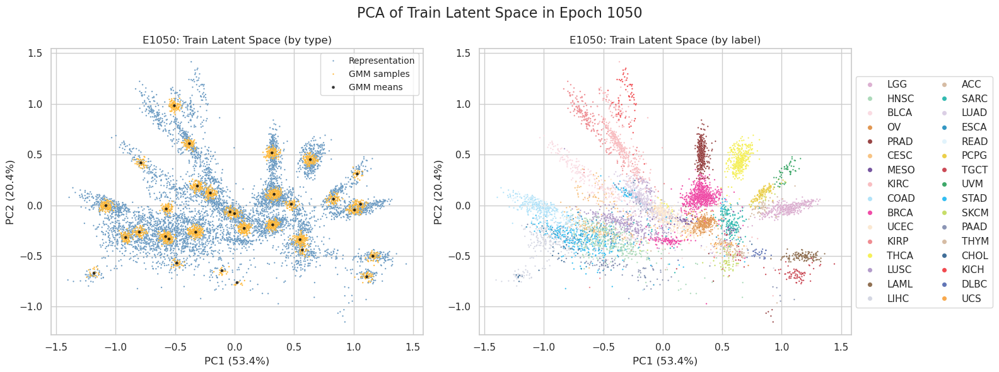

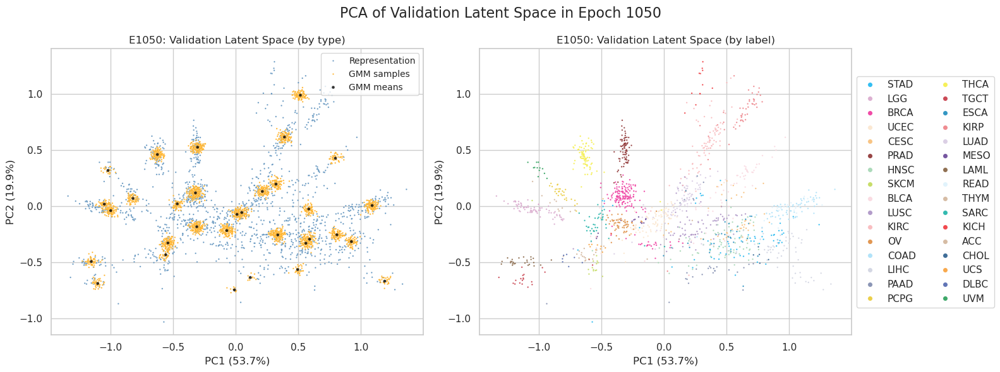

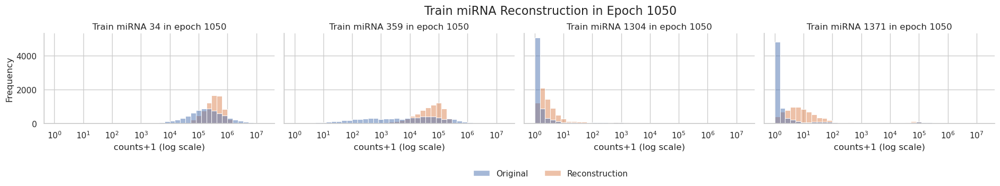

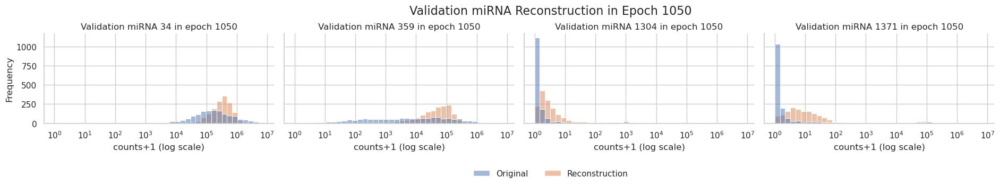

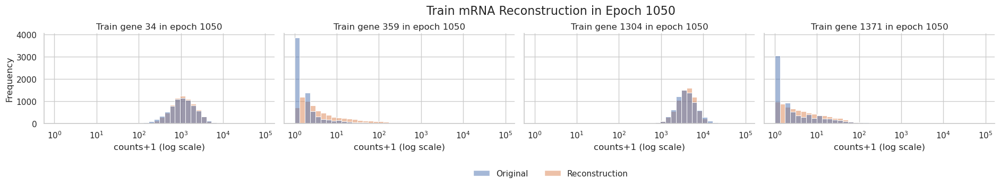

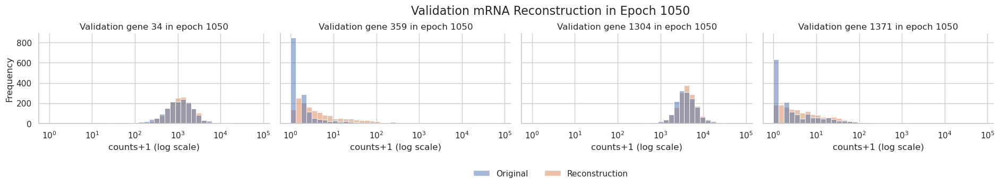

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                | 1056/1500 [1:21:21<41:04,  5.55s/it]

1055 train_loss: 10.228700856024407 train_loss_decoder: 8.189730511538379 train_recon_mirna: 1.8632487931415656 train_recon_mrna: 6.3264817183968125 train_gmm: 2.038970344486029 train_mse: 292024160.0 train_mae: 2586.988525390625 train_r2: 0.6442958116531372 train_spearman: 0.3930800259113312 train_pearson: 0.880181610584259 train_msle: 3.945905923843384
1055 test_loss: 10.274891379538477 test_loss_decoder: 8.235094063680512 test_recon_mirna: 1.8760754429541675 test_recon_mrna: 6.359018620726345 test_gmm: 2.039797315857965 test_mse: 267092992.0 test_mae: 2510.435791015625 test_r2: 0.6253193020820618 test_spearman: 0.39241501688957214 test_pearson: 0.8549497723579407 test_msle: 4.097053050994873


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 1061/1500 [1:21:45<35:09,  4.81s/it]

1060 train_loss: 10.227568852833237 train_loss_decoder: 8.188526898811851 train_recon_mirna: 1.8626406884526572 train_recon_mrna: 6.325886210359195 train_gmm: 2.0390419540213847 train_mse: 290400928.0 train_mae: 2582.556640625 train_r2: 0.6462730169296265 train_spearman: 0.39297786355018616 train_pearson: 0.8796687722206116 train_msle: 4.21565580368042
1060 test_loss: 10.272201221372253 test_loss_decoder: 8.232761724613862 test_recon_mirna: 1.8756461851726374 test_recon_mrna: 6.357115539441225 test_gmm: 2.03943949675839 test_mse: 265365280.0 test_mae: 2510.84912109375 test_r2: 0.6277429461479187 test_spearman: 0.39206817746162415 test_pearson: 0.8561445474624634 test_msle: 4.31829833984375


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 1066/1500 [1:22:06<31:44,  4.39s/it]

1065 train_loss: 10.226894761745692 train_loss_decoder: 8.187885551800953 train_recon_mirna: 1.862378232256792 train_recon_mrna: 6.32550731954416 train_gmm: 2.0390092099447386 train_mse: 289898048.0 train_mae: 2575.80810546875 train_r2: 0.6468855738639832 train_spearman: 0.3939402103424072 train_pearson: 0.8797674775123596 train_msle: 4.531676292419434
1065 test_loss: 10.273881132331365 test_loss_decoder: 8.233616878925856 test_recon_mirna: 1.8765857886153403 test_recon_mrna: 6.357031090310516 test_gmm: 2.0402642534055078 test_mse: 263665024.0 test_mae: 2501.509765625 test_r2: 0.6301280856132507 test_spearman: 0.39335542917251587 test_pearson: 0.8552172780036926 test_msle: 4.687088966369629


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 1071/1500 [1:22:29<32:02,  4.48s/it]

1070 train_loss: 10.225062640650767 train_loss_decoder: 8.186087142335385 train_recon_mirna: 1.8614369635890604 train_recon_mrna: 6.324650178746324 train_gmm: 2.038975498315382 train_mse: 285497632.0 train_mae: 2553.82080078125 train_r2: 0.6522455215454102 train_spearman: 0.39334115386009216 train_pearson: 0.8806238174438477 train_msle: 4.154673099517822
1070 test_loss: 10.271851161137143 test_loss_decoder: 8.23215666724439 test_recon_mirna: 1.8747778146138767 test_recon_mrna: 6.357378852630512 test_gmm: 2.039694493892754 test_mse: 261022896.0 test_mae: 2490.037353515625 test_r2: 0.6338344812393188 test_spearman: 0.3930874466896057 test_pearson: 0.8574653267860413 test_msle: 4.237113952636719


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 1076/1500 [1:22:52<32:27,  4.59s/it]

1075 train_loss: 10.224328430707796 train_loss_decoder: 8.185602578645446 train_recon_mirna: 1.8611822296760556 train_recon_mrna: 6.32442034896939 train_gmm: 2.0387258520623517 train_mse: 285371488.0 train_mae: 2554.812744140625 train_r2: 0.6523991823196411 train_spearman: 0.3942752182483673 train_pearson: 0.8797460198402405 train_msle: 4.319705963134766
1075 test_loss: 10.271306003287267 test_loss_decoder: 8.231285103508421 test_recon_mirna: 1.874422242955812 test_recon_mrna: 6.356862860552609 test_gmm: 2.040020899778845 test_mse: 260666160.0 test_mae: 2485.833740234375 test_r2: 0.634334921836853 test_spearman: 0.3913523554801941 test_pearson: 0.8561351299285889 test_msle: 4.53713321685791


 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 1081/1500 [1:23:15<31:53,  4.57s/it]

1080 train_loss: 10.223302046654554 train_loss_decoder: 8.18446230753382 train_recon_mirna: 1.8607547630513397 train_recon_mrna: 6.323707544482481 train_gmm: 2.0388397391207342 train_mse: 283707616.0 train_mae: 2547.514892578125 train_r2: 0.654425859451294 train_spearman: 0.3962053954601288 train_pearson: 0.8797996044158936 train_msle: 4.027925491333008
1080 test_loss: 10.271338890694457 test_loss_decoder: 8.231756140892404 test_recon_mirna: 1.8744129458995609 test_recon_mrna: 6.3573431949928425 test_gmm: 2.0395827498020522 test_mse: 261451952.0 test_mae: 2488.767822265625 test_r2: 0.633232593536377 test_spearman: 0.3944467306137085 test_pearson: 0.8565824031829834 test_msle: 4.159487724304199


 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                            | 1086/1500 [1:23:37<31:32,  4.57s/it]

1085 train_loss: 10.222254336641331 train_loss_decoder: 8.183380247272419 train_recon_mirna: 1.8604979894118536 train_recon_mrna: 6.322882257860566 train_gmm: 2.0388740893689112 train_mse: 280835072.0 train_mae: 2538.99560546875 train_r2: 0.6579248309135437 train_spearman: 0.3932279944419861 train_pearson: 0.8799278140068054 train_msle: 4.245275020599365
1085 test_loss: 10.271004961779512 test_loss_decoder: 8.231316324364771 test_recon_mirna: 1.875131973776935 test_recon_mrna: 6.356184350587837 test_gmm: 2.0396886374147414 test_mse: 253459024.0 test_mae: 2456.017822265625 test_r2: 0.6444451808929443 test_spearman: 0.3926738202571869 test_pearson: 0.8583268523216248 test_msle: 4.369622707366943


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 1091/1500 [1:23:59<30:14,  4.44s/it]

1090 train_loss: 10.221174777820224 train_loss_decoder: 8.182251634230791 train_recon_mirna: 1.8596669375340216 train_recon_mrna: 6.3225846966967705 train_gmm: 2.0389231435894333 train_mse: 279139872.0 train_mae: 2526.65869140625 train_r2: 0.6599897146224976 train_spearman: 0.39481768012046814 train_pearson: 0.880256712436676 train_msle: 3.8763413429260254
1090 test_loss: 10.268315378738993 test_loss_decoder: 8.228807454546246 test_recon_mirna: 1.8739139003552983 test_recon_mrna: 6.354893554190947 test_gmm: 2.0395079241927485 test_mse: 252833984.0 test_mae: 2450.584228515625 test_r2: 0.6453219652175903 test_spearman: 0.39281725883483887 test_pearson: 0.8565908074378967 test_msle: 4.011158466339111


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                          | 1096/1500 [1:24:22<30:24,  4.51s/it]

1095 train_loss: 10.219427509747453 train_loss_decoder: 8.180615509973693 train_recon_mirna: 1.8591550966629984 train_recon_mrna: 6.321460413310695 train_gmm: 2.0388119997737597 train_mse: 273844864.0 train_mae: 2508.093505859375 train_r2: 0.6664393544197083 train_spearman: 0.3942950963973999 train_pearson: 0.8790860772132874 train_msle: 4.0992841720581055
1095 test_loss: 10.266767401378525 test_loss_decoder: 8.227429065282207 test_recon_mirna: 1.873962229330758 test_recon_mrna: 6.3534668359514495 test_gmm: 2.039338336096318 test_mse: 253120608.0 test_mae: 2451.770751953125 test_r2: 0.6449198722839355 test_spearman: 0.3915700614452362 test_pearson: 0.8542183041572571 test_msle: 4.292087554931641


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 1101/1500 [1:24:45<29:47,  4.48s/it]

1100 train_loss: 10.218747403905496 train_loss_decoder: 8.17981175466006 train_recon_mirna: 1.8587126964802716 train_recon_mrna: 6.3210990581797875 train_gmm: 2.0389356492454374 train_mse: 281976064.0 train_mae: 2537.822509765625 train_r2: 0.6565350294113159 train_spearman: 0.39620351791381836 train_pearson: 0.8797683119773865 train_msle: 3.8565266132354736
1100 test_loss: 10.267314560069819 test_loss_decoder: 8.228555660366217 test_recon_mirna: 1.8743509895236357 test_recon_mrna: 6.354204670842581 test_gmm: 2.0387588997036024 test_mse: 255359504.0 test_mae: 2452.733154296875 test_r2: 0.6417791247367859 test_spearman: 0.3972754180431366 test_pearson: 0.8574993014335632 test_msle: 3.9352164268493652


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 1106/1500 [1:25:08<30:15,  4.61s/it]

1105 train_loss: 10.217455951839781 train_loss_decoder: 8.178642138622537 train_recon_mirna: 1.8582310150179138 train_recon_mrna: 6.320411123604624 train_gmm: 2.038813813217244 train_mse: 276527328.0 train_mae: 2513.230224609375 train_r2: 0.6631718873977661 train_spearman: 0.39536935091018677 train_pearson: 0.8796893358230591 train_msle: 3.9315173625946045
1105 test_loss: 10.265966743474124 test_loss_decoder: 8.2267905362281 test_recon_mirna: 1.873549418763434 test_recon_mrna: 6.353241117464665 test_gmm: 2.0391762072460238 test_mse: 254432480.0 test_mae: 2449.475341796875 test_r2: 0.6430795788764954 test_spearman: 0.39473941922187805 test_pearson: 0.8569696545600891 test_msle: 4.049708366394043


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                        | 1111/1500 [1:25:30<29:02,  4.48s/it]

1110 train_loss: 10.21629842836073 train_loss_decoder: 8.17727781792681 train_recon_mirna: 1.857763888061257 train_recon_mrna: 6.319513929865553 train_gmm: 2.0390206104339184 train_mse: 275777152.0 train_mae: 2514.128662109375 train_r2: 0.6640857458114624 train_spearman: 0.3945692479610443 train_pearson: 0.8795677423477173 train_msle: 4.348125457763672
1110 test_loss: 10.264492545446767 test_loss_decoder: 8.22616936750889 test_recon_mirna: 1.8730969054005944 test_recon_mrna: 6.353072462108295 test_gmm: 2.0383231779378783 test_mse: 252471936.0 test_mae: 2445.199951171875 test_r2: 0.6458297967910767 test_spearman: 0.3951449990272522 test_pearson: 0.8580554723739624 test_msle: 4.507887363433838


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 1116/1500 [1:25:53<29:21,  4.59s/it]

1115 train_loss: 10.214763290651614 train_loss_decoder: 8.17591827550785 train_recon_mirna: 1.8569088587708924 train_recon_mrna: 6.319009416736958 train_gmm: 2.0388450151437634 train_mse: 269952448.0 train_mae: 2489.444580078125 train_r2: 0.6711806058883667 train_spearman: 0.3940827548503876 train_pearson: 0.8799088597297668 train_msle: 4.24655294418335
1115 test_loss: 10.265003949886061 test_loss_decoder: 8.22663176350557 test_recon_mirna: 1.8732869255853222 test_recon_mrna: 6.353344837920248 test_gmm: 2.038372186380493 test_mse: 244421792.0 test_mae: 2408.0712890625 test_r2: 0.6571226716041565 test_spearman: 0.3947494328022003 test_pearson: 0.8591529130935669 test_msle: 4.363926887512207


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                       | 1121/1500 [1:26:16<28:03,  4.44s/it]

1120 train_loss: 10.214429544824766 train_loss_decoder: 8.175361459754894 train_recon_mirna: 1.8564998882309518 train_recon_mrna: 6.318861571523942 train_gmm: 2.039068085069872 train_mse: 273884672.0 train_mae: 2506.112548828125 train_r2: 0.6663908958435059 train_spearman: 0.3895481824874878 train_pearson: 0.8805674910545349 train_msle: 4.638383388519287
1120 test_loss: 10.26699483469153 test_loss_decoder: 8.229281122353951 test_recon_mirna: 1.873109083758431 test_recon_mrna: 6.3561720385955205 test_gmm: 2.0377137123375784 test_mse: 249039712.0 test_mae: 2434.637451171875 test_r2: 0.6506446003913879 test_spearman: 0.3920672833919525 test_pearson: 0.8546148538589478 test_msle: 4.736942291259766


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                      | 1125/1500 [1:26:34<28:16,  4.52s/it]

1125 train_loss: 10.213401858687979 train_loss_decoder: 8.174168351669326 train_recon_mirna: 1.8560578868736681 train_recon_mrna: 6.318110464795658 train_gmm: 2.039233507018652 train_mse: 271763040.0 train_mae: 2491.032470703125 train_r2: 0.6689751744270325 train_spearman: 0.3937269151210785 train_pearson: 0.8802279233932495 train_msle: 4.076417922973633
1125 test_loss: 10.263328518097461 test_loss_decoder: 8.224731958813514 test_recon_mirna: 1.873197284307266 test_recon_mrna: 6.351534674506247 test_gmm: 2.0385965592839472 test_mse: 251420912.0 test_mae: 2438.458740234375 test_r2: 0.6473042368888855 test_spearman: 0.3957463204860687 test_pearson: 0.8552894592285156 test_msle: 4.16151762008667


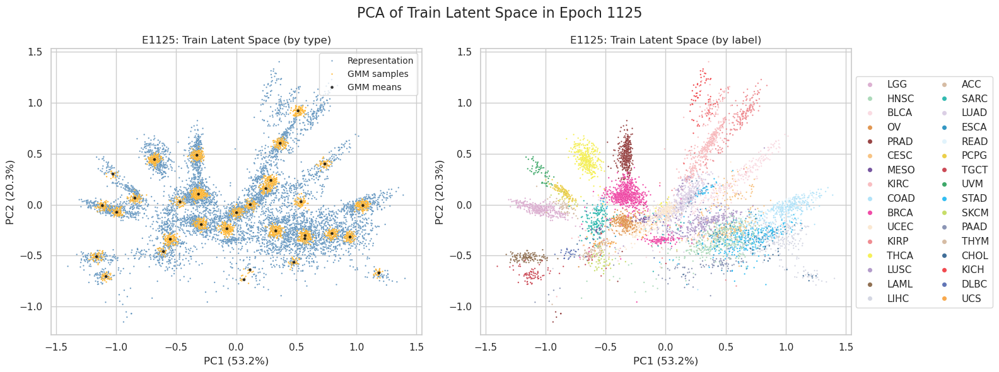

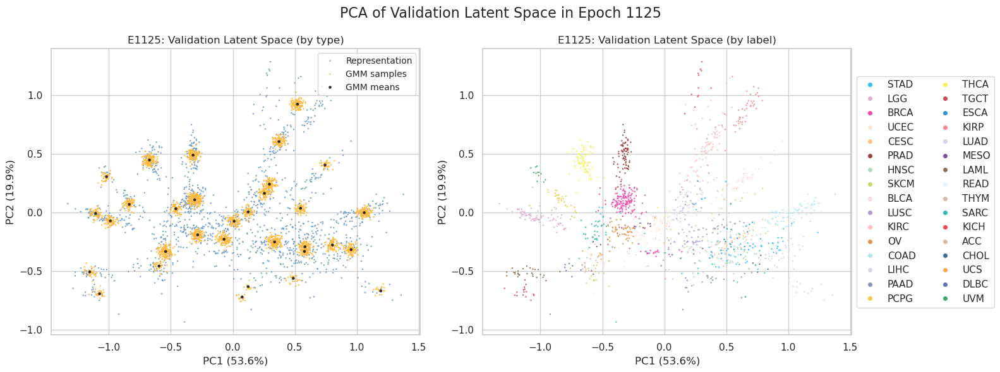

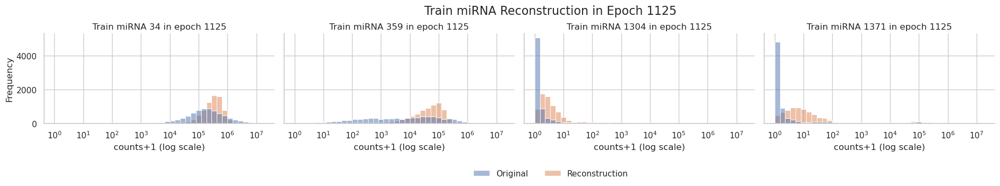

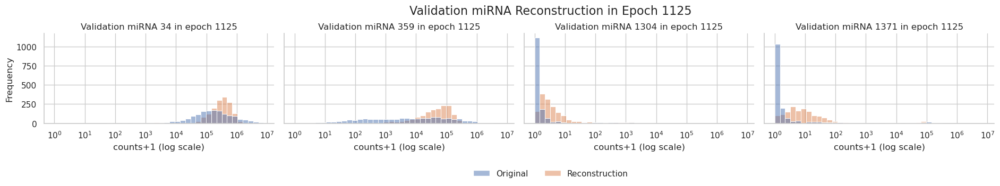

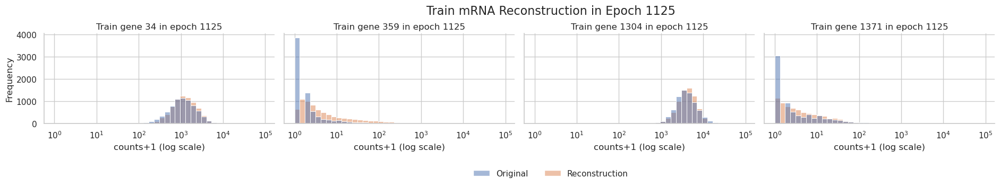

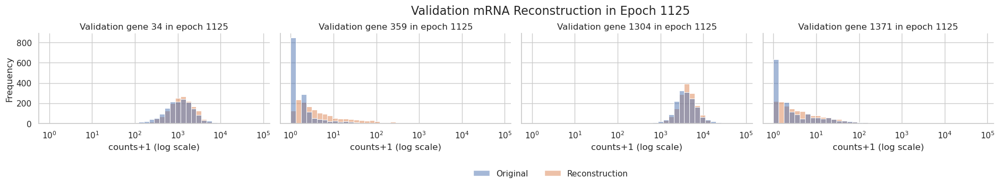

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 1131/1500 [1:27:18<33:14,  5.41s/it]

1130 train_loss: 10.212297955523333 train_loss_decoder: 8.17318267774565 train_recon_mirna: 1.855668335299233 train_recon_mrna: 6.317514342446418 train_gmm: 2.0391152777776833 train_mse: 271424864.0 train_mae: 2489.858154296875 train_r2: 0.6693871021270752 train_spearman: 0.3927919566631317 train_pearson: 0.8805078864097595 train_msle: 4.084048271179199
1130 test_loss: 10.263043547610604 test_loss_decoder: 8.224568431868025 test_recon_mirna: 1.8728384004621317 test_recon_mrna: 6.351730031405894 test_gmm: 2.038475115742578 test_mse: 251293056.0 test_mae: 2442.9345703125 test_r2: 0.6474835872650146 test_spearman: 0.3943485617637634 test_pearson: 0.8561265468597412 test_msle: 4.2108154296875


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 1136/1500 [1:27:40<28:38,  4.72s/it]

1135 train_loss: 10.211581725047774 train_loss_decoder: 8.172270175406164 train_recon_mirna: 1.8548389649447947 train_recon_mrna: 6.317431210461368 train_gmm: 2.0393115496416097 train_mse: 270382688.0 train_mae: 2484.843017578125 train_r2: 0.6706565022468567 train_spearman: 0.39428839087486267 train_pearson: 0.8808041214942932 train_msle: 3.9588115215301514
1135 test_loss: 10.260928430678248 test_loss_decoder: 8.222598399678898 test_recon_mirna: 1.872235682333224 test_recon_mrna: 6.350362717345673 test_gmm: 2.0383300309993513 test_mse: 253684000.0 test_mae: 2444.85546875 test_r2: 0.6441295742988586 test_spearman: 0.39719074964523315 test_pearson: 0.8569155931472778 test_msle: 4.025187969207764


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 1141/1500 [1:28:04<28:34,  4.77s/it]

1140 train_loss: 10.210244120159249 train_loss_decoder: 8.171022603541283 train_recon_mirna: 1.8546955127461524 train_recon_mrna: 6.316327090795131 train_gmm: 2.0392215166179657 train_mse: 267115264.0 train_mae: 2470.251708984375 train_r2: 0.6746364831924438 train_spearman: 0.39243221282958984 train_pearson: 0.8811626434326172 train_msle: 4.099493026733398
1140 test_loss: 10.2621062287683 test_loss_decoder: 8.222852819788146 test_recon_mirna: 1.8727808613290586 test_recon_mrna: 6.350071958459087 test_gmm: 2.0392534089801524 test_mse: 246900016.0 test_mae: 2420.637939453125 test_r2: 0.6536462306976318 test_spearman: 0.3941614627838135 test_pearson: 0.8592888116836548 test_msle: 4.27323579788208


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 1146/1500 [1:28:27<27:02,  4.58s/it]

1145 train_loss: 10.209777516231988 train_loss_decoder: 8.170268852345156 train_recon_mirna: 1.8542727854859076 train_recon_mrna: 6.315996066859248 train_gmm: 2.0395086638868305 train_mse: 260398064.0 train_mae: 2449.453125 train_r2: 0.6828184127807617 train_spearman: 0.39156848192214966 train_pearson: 0.8802012801170349 train_msle: 4.534305095672607
1145 test_loss: 10.26663897965568 test_loss_decoder: 8.227937943304125 test_recon_mirna: 1.8756670271991809 test_recon_mrna: 6.352270916104944 test_gmm: 2.0387010363515548 test_mse: 242148448.0 test_mae: 2400.19140625 test_r2: 0.660311758518219 test_spearman: 0.39218637347221375 test_pearson: 0.8587888479232788 test_msle: 4.592335224151611


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 1151/1500 [1:28:51<27:33,  4.74s/it]

1150 train_loss: 10.209220121003339 train_loss_decoder: 8.169529708433588 train_recon_mirna: 1.853082943379526 train_recon_mrna: 6.316446765054063 train_gmm: 2.0396904125697506 train_mse: 263678336.0 train_mae: 2452.3349609375 train_r2: 0.6788228750228882 train_spearman: 0.3972460925579071 train_pearson: 0.8808132410049438 train_msle: 3.7763147354125977
1150 test_loss: 10.264732616125126 test_loss_decoder: 8.226505758053056 test_recon_mirna: 1.8716591514382273 test_recon_mrna: 6.35484660661483 test_gmm: 2.03822685807207 test_mse: 242513968.0 test_mae: 2391.787109375 test_r2: 0.6597989797592163 test_spearman: 0.39686623215675354 test_pearson: 0.8583264946937561 test_msle: 3.908424139022827


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 1156/1500 [1:29:14<26:57,  4.70s/it]

1155 train_loss: 10.20783356203769 train_loss_decoder: 8.167861368511426 train_recon_mirna: 1.8524883098438338 train_recon_mrna: 6.315373058667593 train_gmm: 2.0399721935262645 train_mse: 265009408.0 train_mae: 2459.59033203125 train_r2: 0.677201509475708 train_spearman: 0.3930928409099579 train_pearson: 0.880367636680603 train_msle: 4.287169456481934
1155 test_loss: 10.261868285367523 test_loss_decoder: 8.223234940794143 test_recon_mirna: 1.8729889027854485 test_recon_mrna: 6.350246038008695 test_gmm: 2.0386333445733795 test_mse: 247475040.0 test_mae: 2416.293212890625 test_r2: 0.6528395414352417 test_spearman: 0.39464324712753296 test_pearson: 0.858495831489563 test_msle: 4.372307777404785


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                 | 1161/1500 [1:29:37<25:53,  4.58s/it]

1160 train_loss: 10.20687805279642 train_loss_decoder: 8.166614151380227 train_recon_mirna: 1.8518357547478246 train_recon_mrna: 6.314778396632403 train_gmm: 2.0402639014161927 train_mse: 261730960.0 train_mae: 2444.802734375 train_r2: 0.6811949014663696 train_spearman: 0.3952189087867737 train_pearson: 0.8811715841293335 train_msle: 3.77925181388855
1160 test_loss: 10.26016965492494 test_loss_decoder: 8.221132271903699 test_recon_mirna: 1.872325117972085 test_recon_mrna: 6.348807153931613 test_gmm: 2.039037383021242 test_mse: 240741344.0 test_mae: 2386.30126953125 test_r2: 0.6622856855392456 test_spearman: 0.3951704502105713 test_pearson: 0.8612925410270691 test_msle: 3.932849645614624


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                | 1166/1500 [1:30:00<25:30,  4.58s/it]

1165 train_loss: 10.205744164881834 train_loss_decoder: 8.165210835024231 train_recon_mirna: 1.8512366698359493 train_recon_mrna: 6.313974165188283 train_gmm: 2.040533329857602 train_mse: 259837504.0 train_mae: 2437.135009765625 train_r2: 0.6835012435913086 train_spearman: 0.39450323581695557 train_pearson: 0.8813096284866333 train_msle: 4.0387864112854
1165 test_loss: 10.259635633212977 test_loss_decoder: 8.220516106465212 test_recon_mirna: 1.8716505230622886 test_recon_mrna: 6.348865583402922 test_gmm: 2.0391195267477644 test_mse: 235823392.0 test_mae: 2352.514404296875 test_r2: 0.6691845655441284 test_spearman: 0.3969443142414093 test_pearson: 0.859990656375885 test_msle: 4.126352310180664


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 1171/1500 [1:30:23<24:53,  4.54s/it]

1170 train_loss: 10.204279597978227 train_loss_decoder: 8.1637746569339 train_recon_mirna: 1.850537066385249 train_recon_mrna: 6.313237590548651 train_gmm: 2.0405049410443272 train_mse: 257833088.0 train_mae: 2430.2841796875 train_r2: 0.6859427690505981 train_spearman: 0.39363816380500793 train_pearson: 0.881348192691803 train_msle: 4.219513893127441
1170 test_loss: 10.258513095903703 test_loss_decoder: 8.21966070337717 test_recon_mirna: 1.8719157119804544 test_recon_mrna: 6.3477449913967146 test_gmm: 2.0388523925265347 test_mse: 237046656.0 test_mae: 2370.138427734375 test_r2: 0.6674686074256897 test_spearman: 0.39683982729911804 test_pearson: 0.8579219579696655 test_msle: 4.333649635314941


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 1176/1500 [1:30:45<24:32,  4.55s/it]

1175 train_loss: 10.203698188958503 train_loss_decoder: 8.162779163748993 train_recon_mirna: 1.8498928786873865 train_recon_mrna: 6.312886285061606 train_gmm: 2.04091902520951 train_mse: 250748576.0 train_mae: 2402.392578125 train_r2: 0.6945720911026001 train_spearman: 0.3941163718700409 train_pearson: 0.8818206191062927 train_msle: 3.9607269763946533
1175 test_loss: 10.256620118209572 test_loss_decoder: 8.218764235726137 test_recon_mirna: 1.8719263053008626 test_recon_mrna: 6.346837930425275 test_gmm: 2.037855882483434 test_mse: 233422448.0 test_mae: 2360.158935546875 test_r2: 0.6725527048110962 test_spearman: 0.3963361382484436 test_pearson: 0.8592118620872498 test_msle: 4.047508716583252


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 1181/1500 [1:31:08<24:22,  4.59s/it]

1180 train_loss: 10.202837050426584 train_loss_decoder: 8.161871233227949 train_recon_mirna: 1.8494476060198926 train_recon_mrna: 6.312423627208057 train_gmm: 2.040965817198635 train_mse: 255436544.0 train_mae: 2416.572021484375 train_r2: 0.6888618469238281 train_spearman: 0.39643338322639465 train_pearson: 0.8823714256286621 train_msle: 3.7124979496002197
1180 test_loss: 10.257248569148897 test_loss_decoder: 8.21846177254931 test_recon_mirna: 1.8719701660550274 test_recon_mrna: 6.346491606494283 test_gmm: 2.0387867965995876 test_mse: 236480112.0 test_mae: 2361.765380859375 test_r2: 0.66826331615448 test_spearman: 0.3973222076892853 test_pearson: 0.8609929084777832 test_msle: 3.7934505939483643


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 1186/1500 [1:31:32<24:22,  4.66s/it]

1185 train_loss: 10.202027062404206 train_loss_decoder: 8.161241369318782 train_recon_mirna: 1.8494453783813898 train_recon_mrna: 6.311795990937393 train_gmm: 2.040785693085423 train_mse: 254865680.0 train_mae: 2416.2880859375 train_r2: 0.6895571947097778 train_spearman: 0.3951309025287628 train_pearson: 0.8828059434890747 train_msle: 4.182552337646484
1185 test_loss: 10.25754776525378 test_loss_decoder: 8.218792999213678 test_recon_mirna: 1.8725782391164205 test_recon_mrna: 6.346214760097258 test_gmm: 2.0387547660401024 test_mse: 232986832.0 test_mae: 2354.50634765625 test_r2: 0.6731637716293335 test_spearman: 0.397968053817749 test_pearson: 0.8606791496276855 test_msle: 4.352620601654053


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 1191/1500 [1:31:55<23:51,  4.63s/it]

1190 train_loss: 10.200632242670956 train_loss_decoder: 8.15961601042475 train_recon_mirna: 1.8482348788657073 train_recon_mrna: 6.311381131559043 train_gmm: 2.0410162322462053 train_mse: 253312832.0 train_mae: 2404.47607421875 train_r2: 0.6914486885070801 train_spearman: 0.3967699706554413 train_pearson: 0.8830644488334656 train_msle: 3.6460764408111572
1190 test_loss: 10.258194047306816 test_loss_decoder: 8.218552382258625 test_recon_mirna: 1.8725177902906909 test_recon_mrna: 6.3460345919679355 test_gmm: 2.03964166504819 test_mse: 237085648.0 test_mae: 2367.810546875 test_r2: 0.6674138903617859 test_spearman: 0.3997530937194824 test_pearson: 0.8594599962234497 test_msle: 3.7366220951080322


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                            | 1196/1500 [1:32:18<23:59,  4.74s/it]

1195 train_loss: 10.199574193098544 train_loss_decoder: 8.158580640168761 train_recon_mirna: 1.8479630586788773 train_recon_mrna: 6.310617581489884 train_gmm: 2.0409935529297827 train_mse: 252709200.0 train_mae: 2398.612548828125 train_r2: 0.6921839714050293 train_spearman: 0.3978258967399597 train_pearson: 0.8837989568710327 train_msle: 3.5608270168304443
1195 test_loss: 10.25757381018896 test_loss_decoder: 8.217741873845057 test_recon_mirna: 1.8732118779452929 test_recon_mrna: 6.344529995899763 test_gmm: 2.0398319363439037 test_mse: 230817200.0 test_mae: 2332.089111328125 test_r2: 0.6762073040008545 test_spearman: 0.39868369698524475 test_pearson: 0.863919734954834 test_msle: 3.664935827255249


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 1200/1500 [1:32:37<23:11,  4.64s/it]

1200 train_loss: 10.19867172697994 train_loss_decoder: 8.157691376816297 train_recon_mirna: 1.8473349960384433 train_recon_mrna: 6.310356380777853 train_gmm: 2.0409803501636428 train_mse: 248087568.0 train_mae: 2382.112548828125 train_r2: 0.6978133916854858 train_spearman: 0.3966161906719208 train_pearson: 0.8840212821960449 train_msle: 3.7357051372528076
1200 test_loss: 10.257015652730223 test_loss_decoder: 8.217984824390687 test_recon_mirna: 1.8731632045124167 test_recon_mrna: 6.344821619878269 test_gmm: 2.039030828339536 test_mse: 229814304.0 test_mae: 2332.108154296875 test_r2: 0.6776142120361328 test_spearman: 0.39977988600730896 test_pearson: 0.8617823123931885 test_msle: 3.8592607975006104


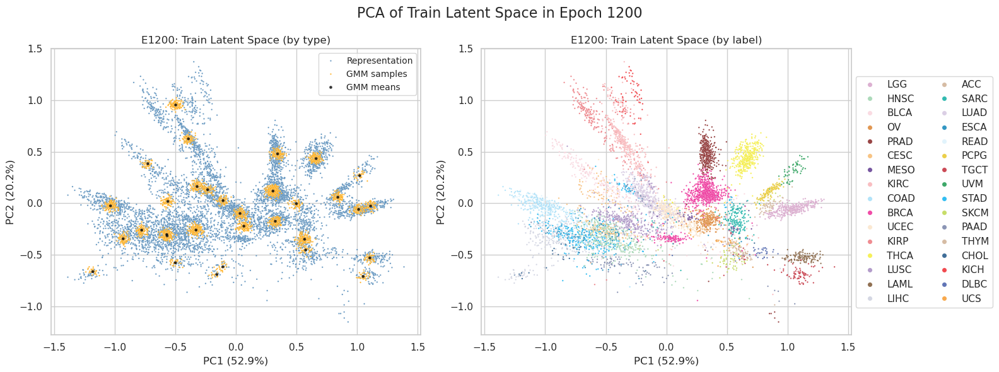

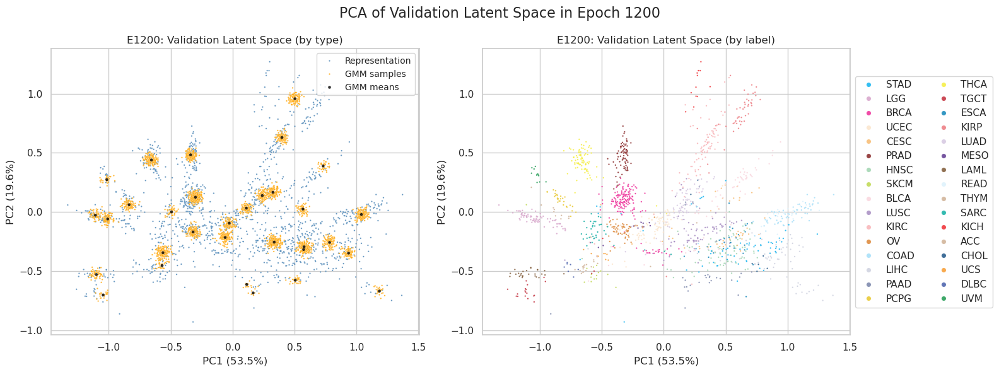

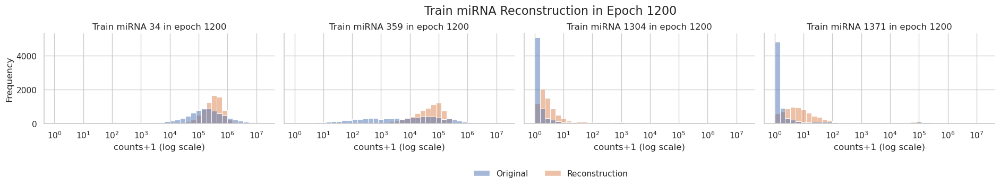

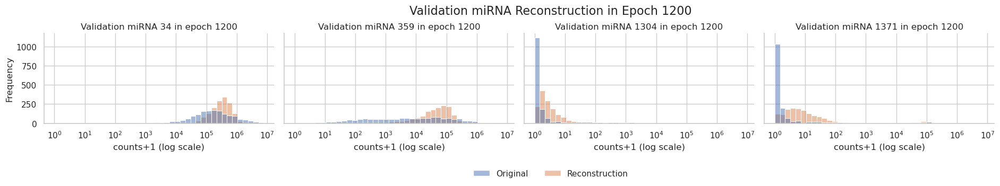

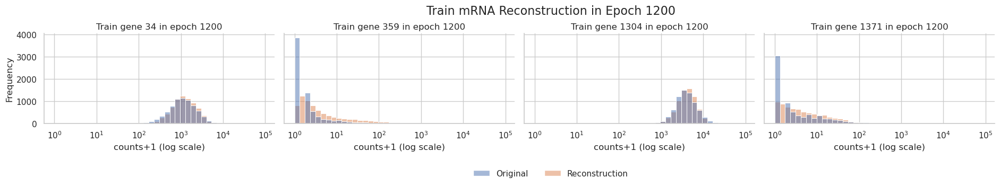

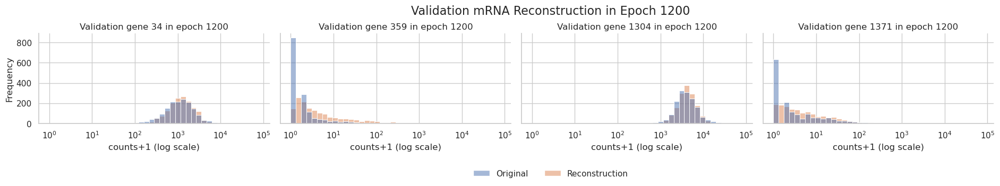

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                          | 1206/1500 [1:33:22<27:18,  5.57s/it]

1205 train_loss: 10.197375356335177 train_loss_decoder: 8.156206665091938 train_recon_mirna: 1.8466661108900728 train_recon_mrna: 6.309540554201865 train_gmm: 2.04116869124324 train_mse: 246759312.0 train_mae: 2380.0634765625 train_r2: 0.699431300163269 train_spearman: 0.3937470316886902 train_pearson: 0.8837578892707825 train_msle: 4.531325817108154
1205 test_loss: 10.255786152735887 test_loss_decoder: 8.216777657241376 test_recon_mirna: 1.8729165405329278 test_recon_mrna: 6.343861116708449 test_gmm: 2.0390084954945102 test_mse: 228920256.0 test_mae: 2333.022216796875 test_r2: 0.6788684129714966 test_spearman: 0.39769381284713745 test_pearson: 0.8639075756072998 test_msle: 4.672463417053223


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 1211/1500 [1:33:45<23:15,  4.83s/it]

1210 train_loss: 10.196850477361503 train_loss_decoder: 8.15574093710971 train_recon_mirna: 1.8465270647373695 train_recon_mrna: 6.30921387237234 train_gmm: 2.0411095402517923 train_mse: 247980816.0 train_mae: 2380.760009765625 train_r2: 0.6979434490203857 train_spearman: 0.39333000779151917 train_pearson: 0.8843833804130554 train_msle: 4.113897800445557
1210 test_loss: 10.255330165017877 test_loss_decoder: 8.217082918405845 test_recon_mirna: 1.8731451785350521 test_recon_mrna: 6.3439377398707935 test_gmm: 2.0382472466120327 test_mse: 230732608.0 test_mae: 2331.083984375 test_r2: 0.6763259768486023 test_spearman: 0.3992758095264435 test_pearson: 0.8649036884307861 test_msle: 4.155442237854004


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 1216/1500 [1:34:09<23:00,  4.86s/it]

1215 train_loss: 10.195297256602263 train_loss_decoder: 8.154255529799434 train_recon_mirna: 1.845343403147498 train_recon_mrna: 6.3089121266519355 train_gmm: 2.041041726802829 train_mse: 247650800.0 train_mae: 2377.990966796875 train_r2: 0.698345422744751 train_spearman: 0.3984835147857666 train_pearson: 0.8848910331726074 train_msle: 3.5829813480377197
1215 test_loss: 10.256583374765437 test_loss_decoder: 8.217337166336412 test_recon_mirna: 1.8733673151387271 test_recon_mrna: 6.343969851197685 test_gmm: 2.0392462084290264 test_mse: 229744592.0 test_mae: 2316.328125 test_r2: 0.6777119636535645 test_spearman: 0.40160104632377625 test_pearson: 0.8662184476852417 test_msle: 3.648314952850342


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 1221/1500 [1:34:32<21:12,  4.56s/it]

1220 train_loss: 10.19483529876224 train_loss_decoder: 8.153605617347889 train_recon_mirna: 1.8449491568662804 train_recon_mrna: 6.308656460481608 train_gmm: 2.0412296814143507 train_mse: 239923920.0 train_mae: 2349.931884765625 train_r2: 0.7077572345733643 train_spearman: 0.39552298188209534 train_pearson: 0.8853251934051514 train_msle: 4.04560661315918
1220 test_loss: 10.26206229086615 test_loss_decoder: 8.22311368537462 test_recon_mirna: 1.874103822033989 test_recon_mrna: 6.3490098633406316 test_gmm: 2.038948605491529 test_mse: 222528848.0 test_mae: 2305.788330078125 test_r2: 0.6878343224525452 test_spearman: 0.3996855616569519 test_pearson: 0.8677430152893066 test_msle: 4.109724044799805


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 1226/1500 [1:34:56<21:27,  4.70s/it]

1225 train_loss: 10.193826306979783 train_loss_decoder: 8.152765589110206 train_recon_mirna: 1.8446149537891277 train_recon_mrna: 6.30815063532108 train_gmm: 2.041060717869576 train_mse: 241256880.0 train_mae: 2350.126220703125 train_r2: 0.7061336040496826 train_spearman: 0.39535874128341675 train_pearson: 0.8857502937316895 train_msle: 4.065117835998535
1225 test_loss: 10.258439001116665 test_loss_decoder: 8.219181364965804 test_recon_mirna: 1.8752639375150382 test_recon_mrna: 6.343917427450767 test_gmm: 2.039257636150861 test_mse: 221559232.0 test_mae: 2296.63916015625 test_r2: 0.6891945004463196 test_spearman: 0.3973362147808075 test_pearson: 0.8660983443260193 test_msle: 4.173194885253906


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 1231/1500 [1:35:19<20:47,  4.64s/it]

1230 train_loss: 10.192978976219408 train_loss_decoder: 8.151760582459172 train_recon_mirna: 1.8440257015049266 train_recon_mrna: 6.3077348809542455 train_gmm: 2.0412183937602366 train_mse: 238978880.0 train_mae: 2344.5234375 train_r2: 0.7089083194732666 train_spearman: 0.39659541845321655 train_pearson: 0.8861930966377258 train_msle: 4.043801307678223
1230 test_loss: 10.25856466640095 test_loss_decoder: 8.218709793755684 test_recon_mirna: 1.8754762994336673 test_recon_mrna: 6.343233494322016 test_gmm: 2.0398548726452654 test_mse: 220890240.0 test_mae: 2290.753662109375 test_r2: 0.6901329755783081 test_spearman: 0.39948058128356934 test_pearson: 0.8654405474662781 test_msle: 4.159855365753174


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 1236/1500 [1:35:42<20:40,  4.70s/it]

1235 train_loss: 10.191657695933138 train_loss_decoder: 8.150523322927372 train_recon_mirna: 1.8434298062550172 train_recon_mrna: 6.307093516672354 train_gmm: 2.0411343730057654 train_mse: 239526816.0 train_mae: 2341.33984375 train_r2: 0.7082409858703613 train_spearman: 0.3966119587421417 train_pearson: 0.8863366842269897 train_msle: 3.8919663429260254
1235 test_loss: 10.25999850360541 test_loss_decoder: 8.219457298961911 test_recon_mirna: 1.877978977850462 test_recon_mrna: 6.341478321111449 test_gmm: 2.0405412046434974 test_mse: 218331344.0 test_mae: 2279.718994140625 test_r2: 0.6937226057052612 test_spearman: 0.4012267291545868 test_pearson: 0.8664503693580627 test_msle: 3.959933042526245


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 1241/1500 [1:36:06<20:20,  4.71s/it]

1240 train_loss: 10.191717949724133 train_loss_decoder: 8.15016287973772 train_recon_mirna: 1.843100898611267 train_recon_mrna: 6.307061981126455 train_gmm: 2.041555069986412 train_mse: 236407280.0 train_mae: 2331.3427734375 train_r2: 0.7120407223701477 train_spearman: 0.3943899869918823 train_pearson: 0.887390673160553 train_msle: 4.010273456573486
1240 test_loss: 10.259939127391823 test_loss_decoder: 8.219787150596849 test_recon_mirna: 1.8781025223026704 test_recon_mrna: 6.341684628294179 test_gmm: 2.040151976794973 test_mse: 222240672.0 test_mae: 2287.347900390625 test_r2: 0.6882385611534119 test_spearman: 0.39937785267829895 test_pearson: 0.864372968673706 test_msle: 4.087275981903076


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 1246/1500 [1:36:29<19:29,  4.60s/it]

1245 train_loss: 10.189813940069014 train_loss_decoder: 8.148653158765924 train_recon_mirna: 1.8425001717222642 train_recon_mrna: 6.306152987043659 train_gmm: 2.041160781303089 train_mse: 237265296.0 train_mae: 2333.849365234375 train_r2: 0.710995614528656 train_spearman: 0.3968460261821747 train_pearson: 0.8875541687011719 train_msle: 3.901691198348999
1245 test_loss: 10.259186069673161 test_loss_decoder: 8.2177508493045 test_recon_mirna: 1.8770524499861885 test_recon_mrna: 6.3406983993183115 test_gmm: 2.041435220368662 test_mse: 223940608.0 test_mae: 2292.555908203125 test_r2: 0.685853898525238 test_spearman: 0.40113502740859985 test_pearson: 0.8655449748039246 test_msle: 4.017152786254883


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 1251/1500 [1:36:53<19:20,  4.66s/it]

1250 train_loss: 10.189010391893232 train_loss_decoder: 8.147919412956538 train_recon_mirna: 1.842150055577193 train_recon_mrna: 6.3057693573793445 train_gmm: 2.0410909789366944 train_mse: 232490256.0 train_mae: 2314.426513671875 train_r2: 0.7168118953704834 train_spearman: 0.3964473605155945 train_pearson: 0.8873319625854492 train_msle: 3.9005260467529297
1250 test_loss: 10.2592579871652 test_loss_decoder: 8.218284330283895 test_recon_mirna: 1.877311691680792 test_recon_mrna: 6.340972638603103 test_gmm: 2.040973656881305 test_mse: 217173504.0 test_mae: 2278.50048828125 test_r2: 0.6953468322753906 test_spearman: 0.40037697553634644 test_pearson: 0.8677621483802795 test_msle: 3.9751548767089844


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 1256/1500 [1:37:17<19:26,  4.78s/it]

1255 train_loss: 10.187833889198322 train_loss_decoder: 8.146512700991865 train_recon_mirna: 1.841358633631791 train_recon_mrna: 6.305154067360074 train_gmm: 2.041321188206456 train_mse: 230873456.0 train_mae: 2312.401123046875 train_r2: 0.7187812924385071 train_spearman: 0.39620959758758545 train_pearson: 0.8874339461326599 train_msle: 4.5417399406433105
1255 test_loss: 10.25822436889421 test_loss_decoder: 8.217320066582397 test_recon_mirna: 1.8771396684549306 test_recon_mrna: 6.340180398127467 test_gmm: 2.040904302311812 test_mse: 213877744.0 test_mae: 2258.171142578125 test_r2: 0.6999701857566833 test_spearman: 0.4014147222042084 test_pearson: 0.8685964941978455 test_msle: 4.637397766113281


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 1261/1500 [1:37:40<19:10,  4.81s/it]

1260 train_loss: 10.187290185389353 train_loss_decoder: 8.145866767443744 train_recon_mirna: 1.8412684327677054 train_recon_mrna: 6.304598334676039 train_gmm: 2.0414234179456088 train_mse: 232587600.0 train_mae: 2312.322021484375 train_r2: 0.7166934013366699 train_spearman: 0.3957256078720093 train_pearson: 0.8874744772911072 train_msle: 4.056516647338867
1260 test_loss: 10.25885686260375 test_loss_decoder: 8.217561221958432 test_recon_mirna: 1.8778631874546847 test_recon_mrna: 6.339698034503748 test_gmm: 2.0412956406453184 test_mse: 217824256.0 test_mae: 2273.2080078125 test_r2: 0.6944339275360107 test_spearman: 0.4025100767612457 test_pearson: 0.868054211139679 test_msle: 4.14518404006958


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 1266/1500 [1:38:05<19:05,  4.90s/it]

1265 train_loss: 10.186664435011078 train_loss_decoder: 8.145451136482531 train_recon_mirna: 1.8411108656456712 train_recon_mrna: 6.30434027083686 train_gmm: 2.041213298528547 train_mse: 231331760.0 train_mae: 2306.579833984375 train_r2: 0.7182230353355408 train_spearman: 0.3970937132835388 train_pearson: 0.8879108428955078 train_msle: 3.923494338989258
1265 test_loss: 10.261106853771938 test_loss_decoder: 8.219644499942804 test_recon_mirna: 1.8796570857591 test_recon_mrna: 6.339987414183705 test_gmm: 2.0414623538291345 test_mse: 219520736.0 test_mae: 2274.654052734375 test_r2: 0.6920541524887085 test_spearman: 0.40182769298553467 test_pearson: 0.8684262633323669 test_msle: 3.9856324195861816


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                 | 1271/1500 [1:38:28<17:50,  4.67s/it]

1270 train_loss: 10.185347317951754 train_loss_decoder: 8.144283450697042 train_recon_mirna: 1.8402711516558494 train_recon_mrna: 6.304012299041192 train_gmm: 2.041063867254712 train_mse: 226168112.0 train_mae: 2285.591796875 train_r2: 0.7245126962661743 train_spearman: 0.39774659276008606 train_pearson: 0.8885926008224487 train_msle: 4.003310680389404
1270 test_loss: 10.260760433978941 test_loss_decoder: 8.218916652588298 test_recon_mirna: 1.8798130026204665 test_recon_mrna: 6.339103649967831 test_gmm: 2.041843781390643 test_mse: 213847936.0 test_mae: 2249.751220703125 test_r2: 0.7000119686126709 test_spearman: 0.4018153250217438 test_pearson: 0.8700295090675354 test_msle: 4.040278911590576


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 1275/1500 [1:38:47<17:56,  4.78s/it]

1275 train_loss: 10.184745090714975 train_loss_decoder: 8.143517847644056 train_recon_mirna: 1.8398662572060938 train_recon_mrna: 6.303651590437961 train_gmm: 2.0412272430709186 train_mse: 230958992.0 train_mae: 2297.947998046875 train_r2: 0.7186771035194397 train_spearman: 0.3982163965702057 train_pearson: 0.8891603350639343 train_msle: 3.8848955631256104
1275 test_loss: 10.260929418045823 test_loss_decoder: 8.21962057750624 test_recon_mirna: 1.8801744154669326 test_recon_mrna: 6.339446162039306 test_gmm: 2.0413088405395827 test_mse: 212074944.0 test_mae: 2237.222900390625 test_r2: 0.7024991512298584 test_spearman: 0.4042508900165558 test_pearson: 0.8725607991218567 test_msle: 3.9664361476898193


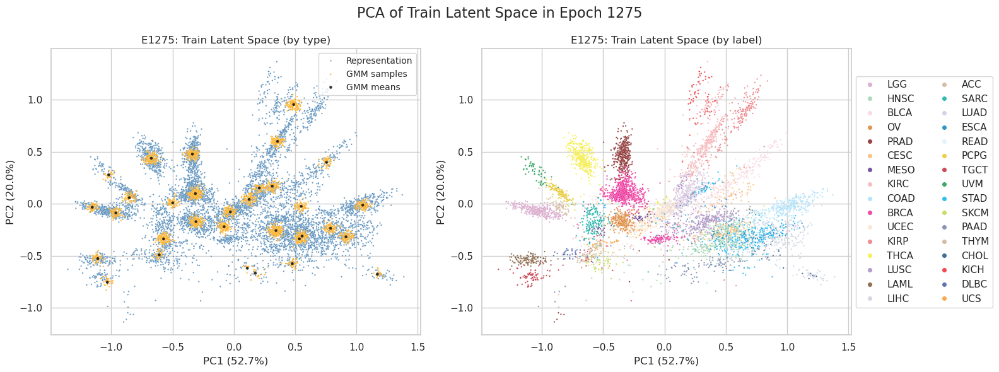

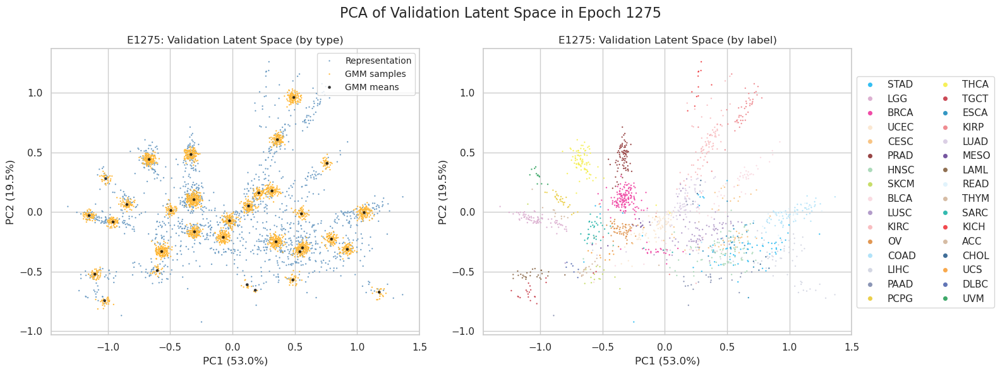

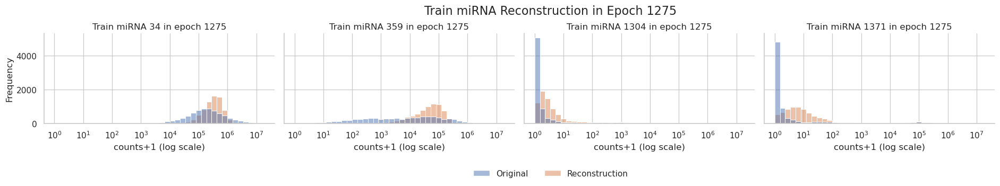

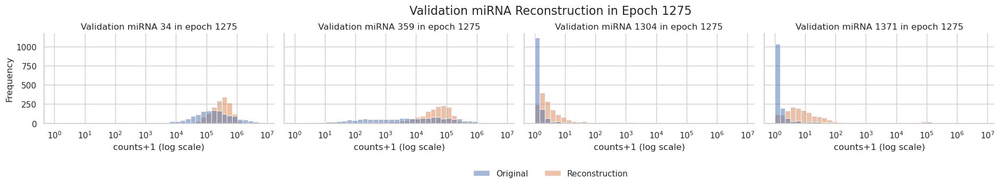

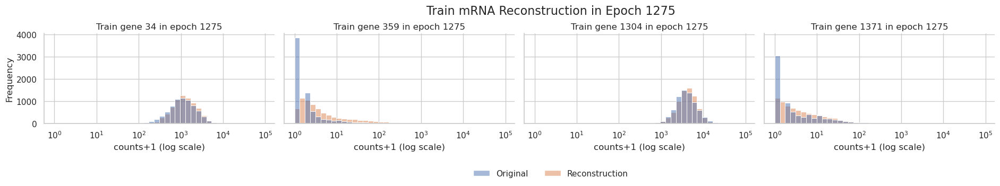

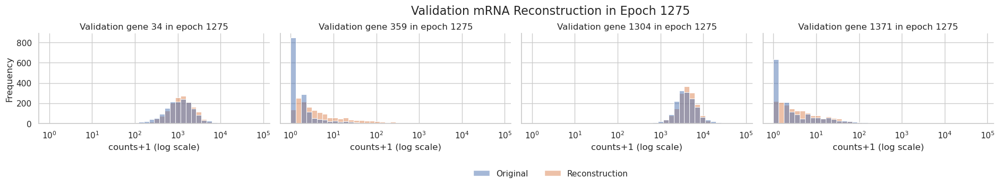

 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 1281/1500 [1:39:38<21:19,  5.84s/it]

1280 train_loss: 10.184139930824376 train_loss_decoder: 8.142642842960228 train_recon_mirna: 1.8396365727591732 train_recon_mrna: 6.303006270201055 train_gmm: 2.0414970878641485 train_mse: 233937536.0 train_mae: 2311.03173828125 train_r2: 0.7150490283966064 train_spearman: 0.39753228425979614 train_pearson: 0.8893145322799683 train_msle: 3.930614948272705
1280 test_loss: 10.26108950922344 test_loss_decoder: 8.219141181564895 test_recon_mirna: 1.8807174387804932 test_recon_mrna: 6.338423742784403 test_gmm: 2.0419483276585453 test_mse: 215859600.0 test_mae: 2254.83203125 test_r2: 0.69718998670578 test_spearman: 0.402604341506958 test_pearson: 0.8687487244606018 test_msle: 4.0432281494140625


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 1286/1500 [1:40:02<17:36,  4.94s/it]

1285 train_loss: 10.182718668913662 train_loss_decoder: 8.141431102259936 train_recon_mirna: 1.8390135575136537 train_recon_mrna: 6.302417544746282 train_gmm: 2.041287566653726 train_mse: 227859008.0 train_mae: 2285.51171875 train_r2: 0.7224531173706055 train_spearman: 0.39778366684913635 train_pearson: 0.890003502368927 train_msle: 3.8722987174987793
1285 test_loss: 10.262194450480823 test_loss_decoder: 8.219701010768002 test_recon_mirna: 1.8811275211384169 test_recon_mrna: 6.338573489629585 test_gmm: 2.042493439712822 test_mse: 214699072.0 test_mae: 2252.117431640625 test_r2: 0.6988179683685303 test_spearman: 0.4039928615093231 test_pearson: 0.8682838082313538 test_msle: 3.95424747467041


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 1291/1500 [1:40:26<17:05,  4.90s/it]

1290 train_loss: 10.184204199213548 train_loss_decoder: 8.142724188473947 train_recon_mirna: 1.8392186272343996 train_recon_mrna: 6.303505561239547 train_gmm: 2.041480010739601 train_mse: 224837328.0 train_mae: 2274.400146484375 train_r2: 0.7261337041854858 train_spearman: 0.39577141404151917 train_pearson: 0.8898915648460388 train_msle: 3.9151387214660645
1290 test_loss: 10.26330719741655 test_loss_decoder: 8.22071966068037 test_recon_mirna: 1.8819469086290828 test_recon_mrna: 6.3387727520512875 test_gmm: 2.0425875367361797 test_mse: 206271744.0 test_mae: 2228.87841796875 test_r2: 0.7106399536132812 test_spearman: 0.4001058340072632 test_pearson: 0.872077465057373 test_msle: 4.056189060211182


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 1296/1500 [1:40:50<16:00,  4.71s/it]

1295 train_loss: 10.182294759198893 train_loss_decoder: 8.140617278055132 train_recon_mirna: 1.8384269178387542 train_recon_mrna: 6.302190360216377 train_gmm: 2.0416774811437612 train_mse: 227159024.0 train_mae: 2279.132568359375 train_r2: 0.7233057022094727 train_spearman: 0.39992043375968933 train_pearson: 0.8906379342079163 train_msle: 3.750901699066162
1295 test_loss: 10.264405687716646 test_loss_decoder: 8.220960413571964 test_recon_mirna: 1.8833764305925107 test_recon_mrna: 6.337583982979454 test_gmm: 2.0434452741446822 test_mse: 210511232.0 test_mae: 2232.525634765625 test_r2: 0.7046927213668823 test_spearman: 0.40213969349861145 test_pearson: 0.8693475723266602 test_msle: 3.9312493801116943


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 1301/1500 [1:41:13<15:33,  4.69s/it]

1300 train_loss: 10.181619631838474 train_loss_decoder: 8.13939492615061 train_recon_mirna: 1.8381028439862748 train_recon_mrna: 6.301292082164335 train_gmm: 2.042224705687864 train_mse: 227147504.0 train_mae: 2276.089599609375 train_r2: 0.7233197689056396 train_spearman: 0.39684319496154785 train_pearson: 0.8909731507301331 train_msle: 3.7758102416992188
1300 test_loss: 10.267683407730141 test_loss_decoder: 8.2239383727893 test_recon_mirna: 1.884173152910663 test_recon_mrna: 6.339765219878638 test_gmm: 2.0437450349408413 test_mse: 212170624.0 test_mae: 2239.236083984375 test_r2: 0.7023649215698242 test_spearman: 0.40396347641944885 test_pearson: 0.8696844577789307 test_msle: 3.889232873916626


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 1305/1500 [1:41:35<15:10,  4.67s/it]

1305 train_loss: 10.180203856729575 train_loss_decoder: 8.137992602661813 train_recon_mirna: 1.8374781472173616 train_recon_mrna: 6.300514455444451 train_gmm: 2.0422112540677624 train_mse: 218110480.0 train_mae: 2244.49169921875 train_r2: 0.7343274354934692 train_spearman: 0.3981241285800934 train_pearson: 0.8904916644096375 train_msle: 3.8843958377838135
1305 test_loss: 10.264726165121244 test_loss_decoder: 8.220375234223994 test_recon_mirna: 1.8831312606735369 test_recon_mrna: 6.337243973550456 test_gmm: 2.04435093089725 test_mse: 204594656.0 test_mae: 2209.930419921875 test_r2: 0.7129925489425659 test_spearman: 0.4020501375198364 test_pearson: 0.8726187944412231 test_msle: 3.9795854091644287
Early stopped training at epoch 1305 with loss 8.216727091006804


In [16]:
learning_rates={'dec':1e-4, 'rep':1e-2, 'gmm':1e-2}
weight_decay={'dec':1e-4, 'rep':1e-4, 'gmm':1e-4}
betas=(0.9, 0.999)
nepochs = 1500
pr = 5 # how often to print epoch
plot = 75 # how often to print plot

sample_mirna = ['MIMAT0000421', 'MIMAT0000422', 'MIMAT0000435', 'MIMAT0000728']
sample_index = [tcga_mirna.columns.get_loc(a) for a in sample_mirna]

print(sample_index)
subset = sample_index[0]

loss_tab = train_midgd(dgd, train_loader, validation_loader, device,
                       learning_rates=learning_rates, weight_decay=weight_decay, betas=betas, 
                       nepochs=nepochs, fold=None, pr=pr, plot=plot, 
                       reduction_type=reduction_type, scaling_type=scaling_type,
                       sample_index=sample_index, subset=subset, wandb_log=False, early_stopping=50, is_plot=True)

# Plotting Loss

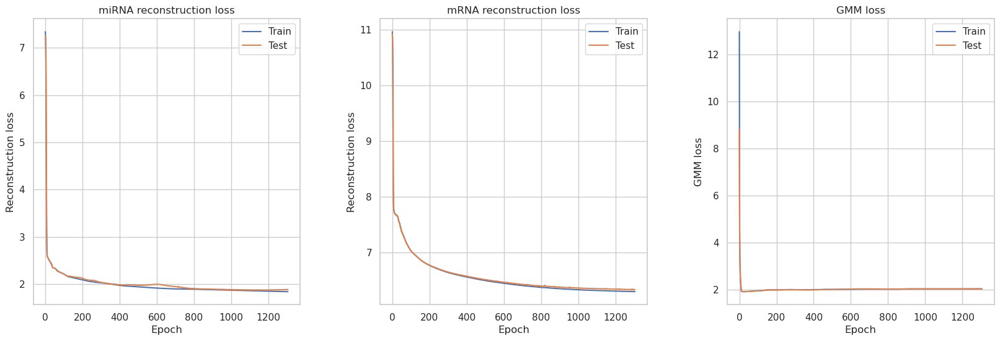

In [17]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a figure to hold the subplots
plt.figure(figsize=(20, 6))
plt.subplots_adjust(wspace=0.3)

plt.subplot(1, 3, 1)
sns.lineplot(x="epoch", y="train_recon_mirna", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_recon_mirna", data=loss_tab, label="Test")
plt.title("miRNA reconstruction loss")
plt.xlabel("Epoch")
plt.ylabel("Reconstruction loss")

plt.subplot(1, 3, 2)
sns.lineplot(x="epoch", y="train_recon_mrna", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_recon_mrna", data=loss_tab, label="Test")
plt.title("mRNA reconstruction loss")
plt.xlabel("Epoch")
plt.ylabel("Reconstruction loss")

plt.subplot(1, 3, 3)
sns.lineplot(x="epoch", y="train_gmm", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_gmm", data=loss_tab, label="Test")
plt.title("GMM loss")
plt.xlabel("Epoch")
plt.ylabel("GMM loss")

# Display the plots
plt.show()

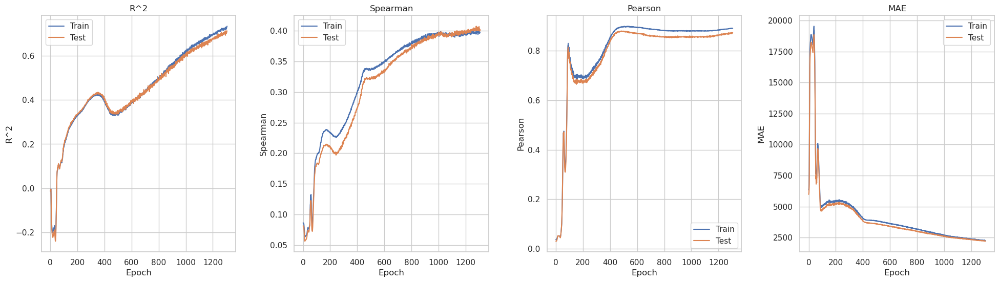

In [18]:
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Create a figure to hold the subplots
plt.figure(figsize=(24, 6))
plt.subplots_adjust(wspace=0.3)

# First subplot for R-squared
plt.subplot(1, 4, 1)
sns.lineplot(x="epoch", y="train_r2", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_r2", data=loss_tab, label="Test")
plt.title("R^2")
plt.xlabel("Epoch")
plt.ylabel("R^2")

# Second subplot for Corr
plt.subplot(1, 4, 2)
sns.lineplot(x="epoch", y="train_spearman", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_spearman", data=loss_tab, label="Test")
plt.title("Spearman")
plt.xlabel("Epoch")
plt.ylabel("Spearman")

# Third subplot for MSE
plt.subplot(1, 4, 3)
sns.lineplot(x="epoch", y="train_pearson", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_pearson", data=loss_tab, label="Test")
plt.title("Pearson")
plt.xlabel("Epoch")
plt.ylabel("Pearson")

# Fourth subplot for MAE
plt.subplot(1, 4, 4)
sns.lineplot(x="epoch", y="train_mae", data=loss_tab, label="Train")
sns.lineplot(x="epoch", y="test_mae", data=loss_tab, label="Test")
plt.title("MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")

# Display the plots
plt.show()

# Save Model

In [19]:
torch.save(dgd, "models/midgd-ms-filtered-best-3.pth")

# Overall Model Performance

In [20]:
from base.engine.predict import learn_new_representation #, learn_new_representation_mrna

In [21]:
new_rep = learn_new_representation(dgd, test_loader, learning_rates=1e-2, weight_decay=0., test_epochs=50)
dgd.test_rep = new_rep

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [01:39<00:00,  1.99s/it]


In [22]:
mirna_annot = pd.read_table("data/TCGA_mirna_anno_iso_match.tsv", sep='\t', index_col=[0])

# Change column name
mirna_column = pd.Series(train_mirna.columns[:-4])

# Convert mirna_annot DataFrame to a dictionary for mapping
mapping_dict = dict(zip(mirna_annot['mature_iso_id'], mirna_annot['mature_iso_name_miRBase']))

# Replace the values in mirna_column using the mapping dictionary
mirna_column = mirna_column.map(mapping_dict).fillna(mirna_column)
mirna_column = np.array(mirna_column)

print(mirna_column)

def _add_columns(X, y, data_loader):
    X = X.assign(tissue=data_loader.dataset.tissue_type)
    X = X.assign(sample=data_loader.dataset.sample_type)
    X = X.assign(color=data_loader.dataset.color)
    X = X.assign(cancer_type=data_loader.dataset.label)
    
    y = y.assign(tissue=data_loader.dataset.tissue_type)
    y = y.assign(sample=data_loader.dataset.sample_type)
    y = y.assign(color=data_loader.dataset.color)
    y = y.assign(cancer_type=data_loader.dataset.label)
    return X, y

def _get_data_prediction(dgd, data_loader, mirna_column_name, dataset="train"):
    with torch.inference_mode():
        scaling = torch.mean(data_loader.dataset.mirna_data, axis=1)
        if dataset == "train":
            X, _ = dgd.forward(dgd.train_rep()) 
        elif dataset == "val":
            X, _ = dgd.forward(dgd.val_rep()) 
        elif dataset == "test":
            X, _ = dgd.forward(dgd.test_rep()) 
        X = X * scaling.unsqueeze(1).to(device)
        X = X.detach().cpu().numpy()
        X = pd.DataFrame(X, columns=mirna_column_name)

        y = data_loader.dataset.mirna_data
        y = y.detach().cpu().numpy()
        y = pd.DataFrame(y, columns=mirna_column_name)
        
        X, y = _add_columns(X, y, data_loader)
    return X, y

def _get_data_pred_from_rep(dgd, test_rep, data_loader, mirna_column_name):
    with torch.inference_mode():
        scaling = torch.mean(data_loader.dataset.mirna_data, axis=1)
        X, _ = dgd.forward(test_rep.z) 
        X = X * scaling.unsqueeze(1).to(device)
        X = X.detach().cpu().numpy()
        X = pd.DataFrame(X, columns=mirna_column_name)

        y = data_loader.dataset.mirna_data
        y = y.detach().cpu().numpy()
        y = pd.DataFrame(y, columns=mirna_column_name)
        
        X, y = _add_columns(X, y, data_loader)
    return X, y
    
def generate_analysis_data(dgd, train_loader, validation_loader, test_loader, mirna_column_name, subset=False, dataset="test"):
    if subset:
        if dataset == "train":
            X_train, y_train = _get_data_prediction(dgd, train_loader, mirna_column_name, dataset="train")
            train = pd.DataFrame(
                data={
                    'X': X_train[subset], 
                    'y': y_train[subset],
                    'cancer_type': train_loader.dataset.label,
                    'tissue': train_loader.dataset.tissue_type,
                    'color': train_loader.dataset.color
                }
            )
            return train
        elif dataset == "val":
            X_val, y_val = _get_data_prediction(dgd, validation_loader, mirna_column_name, dataset="val")
            val = pd.DataFrame(
                data={
                    'X': X_val[subset], 
                    'y': y_val[subset],
                    'cancer_type': validation_loader.dataset.label,
                    'tissue': validation_loader.dataset.tissue_type,
                    'color': validation_loader.dataset.color
                }
            )
            return val
        elif dataset == "test":
            X_test, y_test = _get_data_prediction(dgd, test_loader, mirna_column_name, dataset="test")
            test = pd.DataFrame(
                data={
                    'X': X_test[subset], 
                    'y': y_test[subset],
                    'cancer_type': test_loader.dataset.label,
                    'tissue': test_loader.dataset.tissue_type,
                    'color': test_loader.dataset.color
                }
            )
            return test
    else:
        X_train, y_train = _get_data_prediction(dgd, train_loader, mirna_column_name, dataset="train")
        X_val, y_val = _get_data_prediction(dgd, validation_loader, mirna_column_name, dataset="val")
        X_test, y_test = _get_data_prediction(dgd, test_loader, mirna_column_name, dataset="test")
        
    return X_train, y_train, X_val, y_val, X_test, y_test

def get_mirna_data(dgd, data_loader, subset, mirna_column_name=mirna_column, dataset="test"):
    return generate_analysis_data(dgd, *data_loader, mirna_column_name, subset=subset, dataset=dataset)

X_train, y_train, X_val, y_val, X_test, y_test = generate_analysis_data(dgd, train_loader, validation_loader, test_loader, mirna_column)

['hsa-let-7a-5p' 'hsa-let-7a-2-3p' 'hsa-let-7b-5p' ... 'hsa-miR-3168'
 'hsa-miR-3119' 'hsa-miR-6823-3p']


In [23]:
from scipy import stats

def calculate_corr(X, y, axis=0):
    spearman_corr = []
    pearson_corr = []
    spearman_pval = []
    pearson_pval = []
    r2 = []
    r2_pval = []
    X = X.iloc[:,:-4]
    y = y.iloc[:,:-4]
    
    if axis == 0:
        for i in range(y.shape[1]):
            # Calculate Spearman correlation coefficient
            spearman, spearman_p = stats.spearmanr(X.iloc[:, i], y.iloc[:, i])
            pearson, pearson_p = stats.pearsonr(X.iloc[:, i], y.iloc[:, i])
            _, _, r_value, r_p, _ = stats.linregress(X.iloc[:, i], y.iloc[:, i])
            
            spearman_corr.append(spearman)
            pearson_corr.append(pearson)
            r2.append(r_value**2)
            spearman_pval.append(spearman_p)
            pearson_pval.append(pearson_p)
            r2_pval.append(r_p)
        
        corr_data = pd.DataFrame(
            data={  
                'pearson': pearson_corr,
                'spearman': spearman_corr,
                'r2': r2,
                'pearson_p': pearson_pval,
                'spearman_p': spearman_pval,
                'r2_p': r2_pval,
                'mirna': X.columns
            },
            index=np.arange(0, len(X.columns))
        )
    elif axis == 1:
        for i in range(y.shape[0]):
            # Calculate Spearman correlation coefficient
            spearman, spearman_p = stats.spearmanr(X.iloc[i, :], y.iloc[i, :])
            pearson, pearson_p = stats.pearsonr(X.iloc[i, :], y.iloc[i, :])
            _, _, r_value, r_p, _ = stats.linregress(X.iloc[i, :], y.iloc[i, :])
            
            spearman_corr.append(spearman)
            pearson_corr.append(pearson)
            r2.append(r_value**2)
            spearman_pval.append(spearman_p)
            pearson_pval.append(pearson_p)
            r2_pval.append(r_p)
        
        corr_data = pd.DataFrame(
            data={  
                'pearson': pearson_corr,
                'spearman': spearman_corr,
                'r2': r2,
                'pearson_p': pearson_pval,
                'spearman_p': spearman_pval,
                'r2_p': r2_pval,
                'mirna': X.index[:-4]
            },
            index=np.arange(0, len(X.index))
        )
    else:
        raise ValueError("Axis must be 0 (columns) or 1 (rows).")
    
    return corr_data.sort_values(by='pearson', ascending=False, ignore_index=True)

def calculate_pearson(X, y, sparsity):
    pearson_corr = []
    pearson_pval = []
    
    for i in range(y_test.shape[1]-4):
        # Calculate Spearman correlation coefficient
        pearson, pearson_p = stats.pearsonr(X.iloc[:,i], y.iloc[:,i])
        pearson_corr.append(pearson)
        pearson_pval.append(pearson_p)
        
    corr_data = pd.DataFrame(
        data={  
            'mirna': X.columns[:-4],
            'pearson': pearson_corr,
            'sparsity': np.repeat(sparsity, len(X.columns[:-4]))
        },
        index=np.arange(0, len(X.columns[:-4]))
    )
    return corr_data.sort_values(by='pearson', ascending=False, ignore_index=True)

def calculate_spearman(X, y, sparsity):
    spearman_corr = []
    spearman_pval = []
    
    for i in range(y_test.shape[1]-4):
        # Calculate Spearman correlation coefficient
        spearman, spearman_p = stats.spearmanr(X.iloc[:,i], y.iloc[:,i])
        spearman_corr.append(spearman)
        spearman_pval.append(spearman_p)
        
    corr_data = pd.DataFrame(
        data={  
            'mirna': X.columns[:-4],
            'spearman': spearman_corr,
            'sparsity': np.repeat(sparsity, len(X.columns[:-4]))
        },
        index=np.arange(0, len(X.columns[:-4]))
    )
    return corr_data.sort_values(by='spearman', ascending=False, ignore_index=True)

def plot_average_correlation(savedir='plots', filename='None'):
    sns.set_theme(style="whitegrid")
    sns.set_style("white")
    fig = plt.figure(figsize=(8,3))
    
    plt.subplot(1, 2, 1)
    sns.histplot(data=corr_data, x='spearman', bins=35)
    # plt.title("Spearman's Correlation")
    plt.xlabel("Spearman's Correlation")
    mean_spearman = corr_data['spearman'].mean()
    plt.axvline(mean_spearman, color='red', linestyle='dashed', linewidth=1)
    plt.text(mean_spearman, plt.gca().get_ylim()[1] * 0.9, f'Mean: {mean_spearman:.2f}', color='red')
    
    plt.subplot(1,2,2)
    sns.histplot(data=corr_data, x='pearson', bins=30)
    # plt.title("Pearson's Correlation")
    plt.xlabel("Pearson's Correlation")
    plt.ylabel("")
    mean_pearson = corr_data['pearson'].mean()
    plt.axvline(mean_pearson, color='red', linestyle='dashed', linewidth=1)
    plt.text(mean_pearson, plt.gca().get_ylim()[1] * 0.9, f'Mean: {mean_pearson:.2f}', color='red')
    
    # Add the main title to the figure
    # fig.suptitle("samples correlation histogram", fontsize=16)
    
    # Display the plots
    sns.despine()
    plt.tight_layout()
    if filename:
        plt.savefig(os.path.join(savedir, filename))
    plt.show()

In [24]:
corr_data = calculate_corr(X_test, y_test, axis=0)

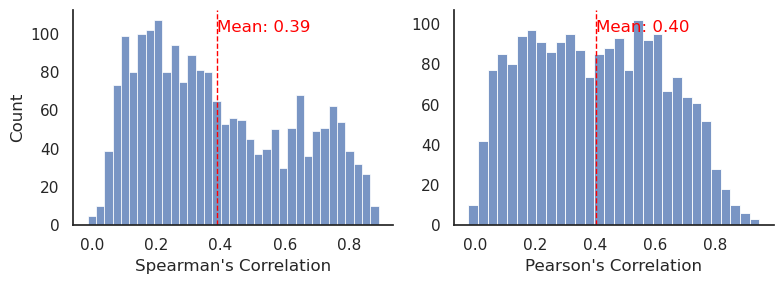

In [25]:
plot_average_correlation(corr_data, filename=None)